Model orthogonalization with LDM variants (heavily based on Vojta's naive code "toymodels.ipynb"). This is an interactive jupyter notebook, that will explore different choices for the construction of the principal components. For now we will only play with the following scenarios:


* 1 good model 1 bad model
* 3 good models 10 bad models
* 1 pefect model, 3 good models, 10 bad models



This is the code hierarchy:

    ├── Utilities
    └── Version 2.0 - LDM variants: Data preparation
    └── PCA - Analysis

        
**I recommend to have Collapsible Headings nbextension active for the best experience.**

## Utilities

In [1]:
# pip install corner


In [2]:
# pip install tables

In [3]:
# pip install scienceplots

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import corner 
from tqdm import tqdm
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
# plt.rcParams['text.usetex'] = True
# plt.rcParams['text.latex.preamble'] = r'\usepackage{amsmath}'


#Another option for plotting
# pip install scienceplots
# import scienceplots 
plt.style.use('science')


# #Some colors that Pablo likes:
colors = [
    "#1f77b4", # Vivid blue
    "#ff7f0e", # Bright orange
    "#2ca02c", # Rich green
    "#d62728", # Strong red
    "#9467bd", # Deep purple
    # "#8c564b", # Brownish-pink
    "#e377c2", # Pink
    "#7f7f7f", # Medium gray
    "#bcbd22", # Lime green
    "#17becf", # Cyan
    "#393b79", # Dark blue
    "#637939", # Olive green
    "#8c6d31", # Bronze
    # "#843c39", # Dark red
    # "#ad494a", # Reddish brown
    "#d6616b", # Soft red
    "#e7ba52", # Golden yellow
    "#7b4173", # Dark purple
    "#a55194", # Mauve
    "#ce6dbd", # Light purple
]

colors_sets = [
    "#ff7f0e",

    "#1f77b4",

    "#2ca02c",
    "#d62728",
    
    "#9467bd",
    "#8c564b",
    "#e377c2",
    "#7f7f7f",
    "#bcbd22",
    "#17becf",
    '#1f77b4',  # muted blue
    'r',  
] 

markers = [
    "o",  # Circle
    "^",  # Triangle up
    "s",  # Square
    "P",  # Plus (filled)
    "*",  # Star
    "X",  # X (filled)
    "D",  # Diamond
    "H",  # Hexagon
]


colors_models = colors







### Next cell are things you (the user) might want to change

In [12]:

#Data separation (training, testing, validation) set ups
##########################

#Number used for when dividing training and testing randomly uniformly (interpolating)
TestingFraction=0.34

#Number used for when dividing training and testing by how close they are to the stable nuclei
distance=2

#Coordinates to truncate so the LDM evaluations are not done below these isotopes
minimumZ=8
minimumN=8



#Centering set up
##########################
centering_data=True




#Isotope chain for 1-D plotting selection
##########################
Selected_element=50
Selected_element_name="Sn"



#Computing constrained MCMC? (takes ~ + 5 minutes extra time)
##########################
computing_MCMC=True

stable_coordinates_full=np.loadtxt("Stable-Isotopes.txt")



#Type of data, if even_even=True then we only use even-even. If not we use all.
even_even=True

# even_even=False

In [15]:
models = ['AME2020', 'ME2', 'MEdelta', 'PC1', 'NL3S', 'SKMS', 'SKP', 'SLY4', 'SV', 'UNEDF0', \
        'UNEDF1', 'UNEDF2', 'FRDM12', 'HFB24', 'BCPM', 'D1M']

# models = ['AME2020', 'DD-ME2', 'DD-MEDelta', 'DD-PC1', 'NL3*', 'SkM*', 'SkP', 'SLy4', 'SV-min', 'UNEDF0', \
#         'UNEDF1', 'UNEDF2', 'FRDM-12', 'HFB-24', 'BCPM', 'D1M']

models_data_sets={}
# models_data_sets=[]

for model in models:
        Data_values=pd.read_hdf("./data/selected_data.h5", key = model, mode = 'r')
        # models_data_sets[model]= {'N': Data_values['N'] , 'Z': Data_values['Z'], 'BE': Data_values['BE']}
        # models_data_sets.append(Data_values[['N','Z','BE']])
        models_data_sets[model] = Data_values[['N','Z','BE']]
        
    

In [16]:
for model in models:
    print(model, len(models_data_sets[model]['N']))

AME2020 2548
ME2 654
MEdelta 654
PC1 654
NL3S 656
SKMS 2459
SKP 2485
SLY4 2479
SV 2484
UNEDF0 2484
UNEDF1 2495
UNEDF2 2540
FRDM12 2457
HFB24 2457
BCPM 2525
D1M 2524


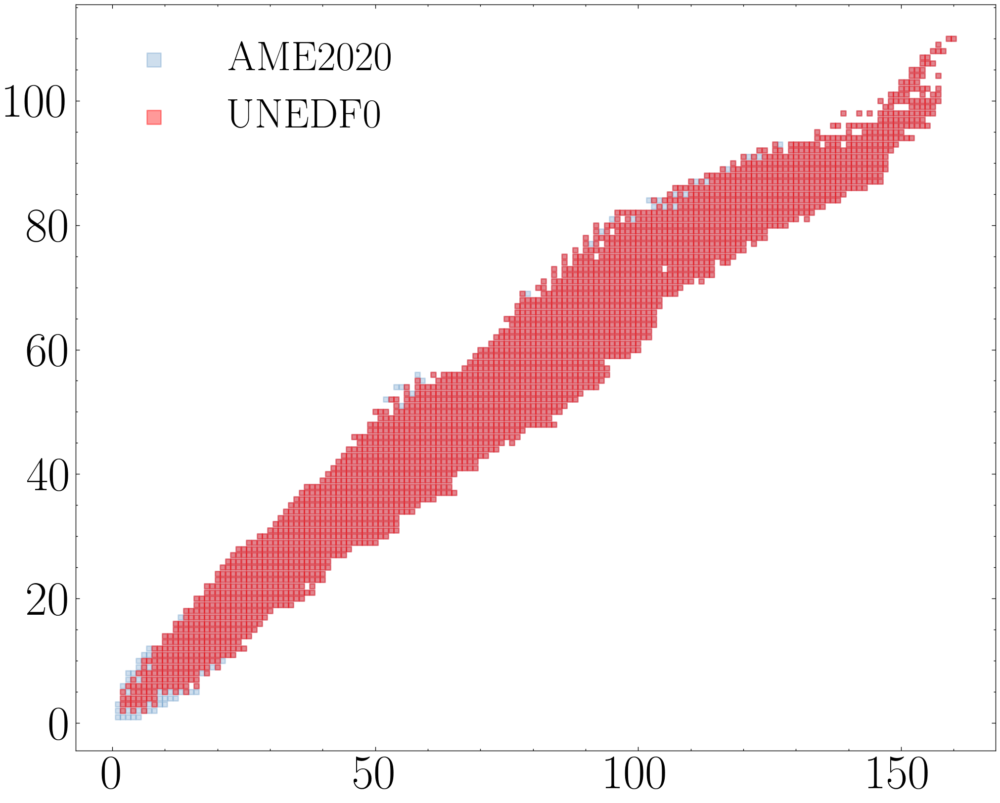

In [17]:
plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

fig, ax = plt.subplots(figsize=(12,10), dpi=200)

ax.scatter(x = models_data_sets['AME2020']['N'], y = models_data_sets['AME2020']['Z'], label = "AME2020", alpha = 0.2,s=11,marker="s")

model=models[9]
ax.scatter(x = models_data_sets[model]['N'], y = models_data_sets[model]['Z'], label = model, alpha = 0.4,s=11,marker="s",color='r')




# ax.scatter(x = stable_coordinates_full.T[0], y = stable_coordinates_full.T[1], label = "Stable", alpha = 0.8,color='black',s=11,marker="s")







# plt.ylabel("Protons",fontsize=45)
plt.legend(fontsize=30,markerscale=3)
plt.show()

In [18]:
for model in models:
    print(model, len(models_data_sets[model]['N']))

AME2020 2548
ME2 654
MEdelta 654
PC1 654
NL3S 656
SKMS 2459
SKP 2485
SLY4 2479
SV 2484
UNEDF0 2484
UNEDF1 2495
UNEDF2 2540
FRDM12 2457
HFB24 2457
BCPM 2525
D1M 2524


In [19]:
# models_selected=['AME2020', 'SKMS', 'SKP', 'SLY4', 'SV', 'UNEDF0', \
#         'UNEDF1', 'UNEDF2', 'FRDM12', 'HFB24', 'BCPM', 'D1M']  #Selecting models that have predictions beyond even even nuclei

In [20]:
models_selected=['AME2020','ME2', 'MEdelta', 'PC1', 'NL3S', 'SKMS', 'SKP', 'SLY4', 'SV', 'UNEDF0', \
        'UNEDF1', 'UNEDF2', 'FRDM12', 'HFB24', 'BCPM', 'D1M']  #Selecting models that have predictions for even even nuclei

In [21]:
filtered_NZ=np.array([models_data_sets[models_selected[0]]['N'].tolist(),models_data_sets[models_selected[0]]['Z'].tolist()]).T

In [22]:
if even_even:
    filtered_NZ_new=[]  #filtering N and Z to lay beyond the minimum selected value (oxygen 16) and to be even-even
    for isotope in filtered_NZ:
        if (isotope[0]>=minimumN) & (isotope[1]>=minimumZ)   & (isotope[0]% 2 == 0) & (isotope[1]% 2 == 0) :
            filtered_NZ_new.append(isotope)

    filtered_NZ=np.copy(np.array(filtered_NZ_new))

else:
    filtered_NZ_new=[]  #filtering N and Z to lay beyond the minimum selected value (oxygen 16)
    for isotope in filtered_NZ:
        if (isotope[0]>=minimumN) & (isotope[1]>=minimumZ):
            filtered_NZ_new.append(isotope)

    filtered_NZ=np.copy(np.array(filtered_NZ_new))


In [23]:
for model in models_selected:  #filtering N and Z so that we have a common set for all the models
    filtered_NZ_new=[]
    for isotope in filtered_NZ:
        if ((models_data_sets[model]['N'] == isotope[0]) & (models_data_sets[model]['Z'] == isotope[1])).any():
            filtered_NZ_new.append(isotope)

    filtered_NZ=np.copy(np.array(filtered_NZ_new))

In [24]:
len(filtered_NZ)

629

In [25]:
filtered_NZ_df=pd.DataFrame({'N':filtered_NZ.T[0] ,'Z':filtered_NZ.T[1] })

In [26]:
selected_models_data_sets=pd.DataFrame(filtered_NZ_df)


for model in models_selected:

        data_model = models_data_sets[model].merge(filtered_NZ_df, on=['N','Z'],how='inner')
        selected_models_data_sets[model] = data_model['BE']

In [27]:
selected_models_data_sets

,N,Z,AME2020,ME2,MEdelta,PC1,NL3S,SKMS,SKP,SLY4,SV,UNEDF0,UNEDF1,UNEDF2,FRDM12,HFB24,BCPM,D1M
0,8,8,127.619315,126.738,129.026,127.455,128.114,128.856436,128.904993,129.839429,127.368236,126.708495,121.705460,121.950687,128.03,125.632422,127.007944,128.028806
1,10,8,139.807766,140.156,141.992,141.423,141.715,144.746257,144.484846,144.734392,141.963546,142.040342,136.123181,136.259511,141.84,138.095058,141.145503,141.000517
2,12,8,151.371414,151.224,152.793,153.215,153.432,158.460613,156.849135,156.488630,153.746333,154.121072,147.620242,148.128389,152.98,151.927694,153.041593,151.904718
3,14,8,162.027188,160.513,161.884,163.303,163.311,170.486446,167.278899,166.483309,163.855872,164.192707,157.219361,158.409799,161.39,161.930329,163.391272,160.883175
4,16,8,168.952452,167.472,168.465,170.768,170.970,178.908577,174.420231,173.303716,170.930478,171.196394,163.998623,165.167568,165.98,168.322965,170.887643,166.974152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
624,154,106,1909.066432,1910.765,1907.813,1909.928,1914.193,1894.445901,1900.875946,1898.639172,1902.293050,1907.479821,1908.851310,1908.842630,1909.73,1909.145350,1905.125660,1901.308909
625,156,106,1923.387483,1925.019,1921.738,1924.361,1928.042,1909.221132,1915.371887,1912.434046,1916.575965,1921.884406,1922.815073,1922.920406,1923.99,1923.647986,1919.402948,1915.781516
626,156,108,1926.771317,1928.415,1925.436,1927.488,1932.395,1911.680941,1918.341803,1916.133844,1919.723353,1925.454882,1926.206982,1926.326995,1927.52,1926.745956,1922.608355,1918.524169
627,158,108,1941.337453,1943.010,1939.691,1942.276,1946.498,1927.231556,1933.157370,1930.669126,1934.554087,1940.259078,1940.812152,1940.991163,1942.52,1941.618592,1937.508145,1933.626547


In [28]:
#Some functions for plotting capabilities

def plot_bars(values, labels, title="Bar Plot", color='blue'):
    """
    Create a bar plot based on the provided values and labels.

    Parameters:
    - values (list): A list of numerical values for the bars.
    - labels (list): A list of labels for each bar.
    - title (str): The title for the bar plot. Default is "Bar Plot".
    - color (str): Color for the bars. Default is 'blue'.
    """
    
    if len(values) != len(labels):
        raise ValueError("Length of values and labels should be the same.")
    
    plt.figure(figsize=(10, 5))
    plt.bar(labels, values, color=color)
    plt.title(title)
    plt.xlabel('Models')
    plt.ylabel('Vt Coordinates')
    plt.xticks(labels,fontsize=10,rotation='vertical')
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()


def Plotter2D_single(data):
    xvals,yvals,zvals = data
    #A plotter to see principal components in 2D
    plt.rc("xtick", labelsize=25)
    plt.rc("ytick", labelsize=25)
    
    fig, ax = plt.subplots(figsize=(12, 8), dpi=200)

    # Create scatter plot
    sc = ax.scatter(xvals, yvals, c=zvals, s=25, cmap='plasma',marker='s')
    # plt.colorbar(sc, label='Z-Value')
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Z-Value', fontsize=25) 
    cbar.ax.tick_params(labelsize=20) 
    plt.xlabel('Neutrons',fontsize=25)
    plt.ylabel('Protons',fontsize=25)

    ax.grid(True)
    # ax.axis('equal')

    plt.show()

def Plotter3D_single(data,elev=30,azim=-60):
    xvals,yvals,zvals = data
    #A plotter to see principal components in 3D
    plt.rc("xtick", labelsize=15)
    plt.rc("ytick", labelsize=15)

    z_min = zvals.min()
    z_max = zvals.max()
    z_normalized = (zvals - z_min) / (z_max - z_min)

    # Create figure for 3D plot
    fig = plt.figure(figsize=(8, 6), dpi=200)
    ax = fig.add_subplot(111, projection='3d')



    # Define the size of the bars
    dx = dy = 1.5  # Width of the bars in the x and y direction
    dz = z_normalized        # Height of the bars (z values)

    # Create 3D bar plot
    ax.bar3d(xvals, yvals, np.zeros_like(zvals), dx, dy, dz, color=plt.cm.plasma(z_normalized))

    ax.view_init(elev=elev, azim=azim) 

    # Setting labels and title
    ax.set_xlabel('Neutrons')
    ax.set_ylabel('Protons')
    ax.set_zlabel('Scaled Z')


    plt.show()    



def Plotter2D(ax,xvals,yvals,zvals):
    #A plotter to see principal components in 2D, part of the big plotter



    # Create scatter plot
    sc = ax.scatter(xvals, yvals, c=zvals, s=25, cmap='plasma',marker='s')
    # plt.colorbar(sc, label='Z-Value')
    cbar = plt.colorbar(sc, ax=ax)
    cbar.set_label('Z-Value', fontsize=25) 
    cbar.ax.tick_params(labelsize=20) 




    plt.xlabel('Neutrons',fontsize=25)
    plt.ylabel('Protons',fontsize=25)

    ax.grid(True)
    ax.axis('equal')

    # plt.show()

def Plotter3D(ax,xvals,yvals,zvals,elev=30,azim=-60):
    #A plotter to see principal components in 3D, part of the big plotter


    z_min = zvals.min()
    z_max = zvals.max()
    z_normalized = (zvals - z_min) / (z_max - z_min)

    # Create figure for 3D plot
    # fig = plt.figure(figsize=(8, 6), dpi=200)
    # ax = fig.add_subplot(111, projection='3d')



    # Define the size of the bars
    dx = dy = 1.5  # Width of the bars in the x and y direction
    dz = z_normalized        # Height of the bars (z values)

    # Create 3D bar plot
    ax.bar3d(xvals, yvals, np.zeros_like(zvals), dx, dy, dz, color=plt.cm.plasma(z_normalized))

    ax.view_init(elev=elev, azim=azim) 

    # Setting labels and title
    ax.set_xlabel('Neutrons')
    ax.set_ylabel('Protons')
    ax.set_zlabel('Scaled Z')


    # plt.show()    



def PlotMultiple(data_sets,angles_sheet=None):
    # Determine the number of rows needed for the plots
    n_rows = len(data_sets)
    # Each data_sets element should look like [x,y,z]

    # Create a figure with subplots
    fig = plt.figure(figsize=(20, 8 * n_rows), dpi=200)

    for i, (xvals, yvals, zvals) in enumerate(data_sets):
        # 2D plot
        ax_2d = fig.add_subplot(n_rows, 2, 2 * i + 1)
        Plotter2D(ax_2d, xvals, yvals, zvals)

        # 3D plot
        ax_3d = fig.add_subplot(n_rows, 2, 2 * i + 2, projection='3d')
        if angles_sheet == None:
            Plotter3D(ax_3d, xvals, yvals, zvals)
        else:
            Plotter3D(ax_3d, xvals, yvals, zvals,elev=angles_sheet[0],azim=angles_sheet[1])

    plt.tight_layout()
    plt.show()



In [29]:
def separate_points_random(list1,random_chance):
    """
    Separates points in list1 into two groups randomly

    """
    train = []
    test = []

    train_list_coordinates=[]
    test_list_coordinates=[]


    for i in range(len(list1)):
        point1=list1[i]
        val=np.random.rand()
        if val<=random_chance:
            train.append(point1)
            train_list_coordinates.append(i)
        else:
            test.append(point1)
            test_list_coordinates.append(i)

    return np.array(train), np.array(test), np.array(train_list_coordinates), np.array(test_list_coordinates)


In [30]:
def separate_points_distance(list1, list2, distance):
    """
    Separates points in list1 into two groups based on their proximity to any point in list2.

    :param list1: List of (x, y) tuples.
    :param list2: List of (x, y) tuples.
    :param distance: The threshold distance to determine proximity.
    :return: Two lists - close_points and distant_points.
    """
    train = []
    test = []

    train_list_coordinates=[]
    test_list_coordinates=[]

    for i in range(len(list1)):
        point1=list1[i]
        close = False
        for point2 in list2:
            if np.linalg.norm(np.array(point1) - np.array(point2)) <= distance:
                close = True
                break
        if close:
            train.append(point1)
            train_list_coordinates.append(i)
        else:
            test.append(point1)
            test_list_coordinates.append(i)

    return np.array(train), np.array(test), np.array(train_list_coordinates), np.array(test_list_coordinates)


In [31]:
def separate_points_distance_allSets(list1, list2, distance1, distance2):
    """
    Separates points in list1 into three groups based on their proximity to any point in list2.

    :param list1: List of (x, y) tuples.
    :param list2: List of (x, y) tuples.
    :param distance: The threshold distance to determine proximity.
    :return: Two lists - close_points and distant_points.
    """
    train = []
    validation=[]
    test = []

    train_list_coordinates=[]
    validation_list_coordinates=[]
    test_list_coordinates=[]

    for i in range(len(list1)):
        point1=list1[i]
        close = False
        for point2 in list2:
            if np.linalg.norm(np.array(point1) - np.array(point2)) <= distance1:
                close = True
                break
        if close:
            train.append(point1)
            train_list_coordinates.append(i)
        else:
            close2=False
            for point2 in list2:
                if np.linalg.norm(np.array(point1) - np.array(point2)) <= distance2:
                    close2 = True
                    break
            if close2==True:
                validation.append(point1)
                validation_list_coordinates.append(i)
            else:
                test.append(point1)
                test_list_coordinates.append(i)                

    return np.array(train),np.array(validation), np.array(test), np.array(train_list_coordinates),  np.array(validation_list_coordinates),np.array(test_list_coordinates)


In [32]:
stable_coordinates_full=np.loadtxt("Stable-Isotopes.txt")

In [33]:
stable_coordinates=[]


##This option is for when we want to focus only on even even
if even_even:
    for i in range(len(stable_coordinates_full)):
        if (stable_coordinates_full[i][0]>=minimumN) & (stable_coordinates_full[i][1]>=minimumZ) & (stable_coordinates_full[i][0]% 2 == 0) & (stable_coordinates_full[i][1]% 2 == 0) :
            stable_coordinates.append(stable_coordinates_full[i])

else:       
    for i in range(len(stable_coordinates_full)):
        if (stable_coordinates_full[i][0]>=minimumN) & (stable_coordinates_full[i][1]>=minimumZ)  :
            stable_coordinates.append(stable_coordinates_full[i])

stable_coordinates=np.array(stable_coordinates)

In [34]:
# ##If we want to generate the data using the AME tables. (A bit messy, might want to clean this up later)


# Full_set_2003=np.loadtxt("data/AME2003.txt")
# # Full_set_2016=np.loadtxt("AME2016.txt")


# AME2003_prepared=[]


# for i in range(len(Full_set_2003)):
#     if (Full_set_2003[i][0]>=minimumN) & (Full_set_2003[i][1]>=minimumZ) :
#         AME2003_prepared.append([Full_set_2003[i][0],Full_set_2003[i][1]])

# AME2003_prepared=np.array(AME2003_prepared)


# # AME2016_even=[]


# # for i in range(len(Full_set_2016)):
# #     if (Full_set_2016[i][0]>=minimumN) & (Full_set_2016[i][1]>=minimumZ) & (Full_set_2016[i][0]% 2 == 0) & (Full_set_2016[i][1]% 2 == 0) :
# #         AME2016_even.append([Full_set_2016[i][0],Full_set_2016[i][1]])

# # AME2016_even=np.array(AME2016_even)



# Full_set_2020=np.loadtxt("data/AME2020.txt")
# AME2020_prepared=[]


# for i in range(len(Full_set_2020)):
#     if (Full_set_2020[i][0]>=minimumN) & (Full_set_2020[i][1]>=minimumZ) :
#         AME2020_prepared.append([Full_set_2020[i][0],Full_set_2020[i][1]])

# AME2020_prepared=np.array(AME2020_prepared)


# AME2020New=[]
# for i in range(len(filtered_NZ)):
#     flag=0
#     for j in range(len(AME2003_prepared)):
#         if (filtered_NZ[i][0]== AME2003_prepared[j][0]) & (filtered_NZ[i][1]== AME2003_prepared[j][1]):
#             flag =1
#             break
#     if flag == 0:
#         AME2020New.append(filtered_NZ[i])

# Full_set=np.copy(filtered_NZ_df)




# distance1=0
# distance2=0


# training_set, validation_set, test_set,train_coordinates0, validation_coordinates0,test_coordinates0=separate_points_distance_allSets(filtered_NZ, AME2020New, distance1,distance2)
# validation_set=np.array([[0,0]])
# # test_set, validation_set,training_set ,test_coordinates0, validation_coordinates0,train_coordinates0=separate_points_distance_allSets(AME2020_prepared, AME2020New, distance1,distance2)

# test_set,training_set,test_coordinates0,train_coordinates0=separate_points_distance(filtered_NZ, AME2020New, 0)


# train_coordinates=[]
# for i in range(len(Full_set)):
#     isotope2020=Full_set[i]
#     for j in range(len(training_set)):
#        train_isotope=training_set[j]
#        if (isotope2020[0]==train_isotope[0]) & (isotope2020[1]==train_isotope[1]):
#            train_coordinates.append(i)
#            break
# train_coordinates=np.array(train_coordinates)



# validation_coordinates=[]
# for i in range(len(Full_set)):
#     isotope2020=Full_set[i]
#     for j in range(len(validation_set)):
#        validation_isotope=validation_set[j]
#        if (isotope2020[0]==validation_isotope[0]) & (isotope2020[1]==validation_isotope[1]):
#            validation_coordinates.append(i)
#            break
# validation_coordinates=np.array(validation_coordinates)

# test_coordinates=[]
# for i in range(len(Full_set)):
#     isotope2020=Full_set[i]
#     for j in range(len(test_set)):
#        test_isotope=test_set[j]
#        if (isotope2020[0]==test_isotope[0]) & (isotope2020[1]==test_isotope[1]):
#            test_coordinates.append(i)
#            break
# test_coordinates=np.array(test_coordinates)

# test_set,training_set,test_coordinates0,train_coordinates0=separate_points_distance(filtered_NZ, AME2020New, 0)

# test_coordinates=np.copy(test_coordinates0)

In [35]:
Full_set=np.copy(filtered_NZ)

In [36]:
# #Separating randomly
# np.random.seed(142857)
# training_set, testing_set, train_coordinates, test_coordinates=separate_points_random(Full_set, TestingFraction)


In [37]:
#Traditional way with stable coordinates

distance1=2
distance2=3

training_set, validation_set, test_set,train_coordinates, validation_coordinates,test_coordinates=separate_points_distance_allSets(Full_set, stable_coordinates, distance1,distance2)

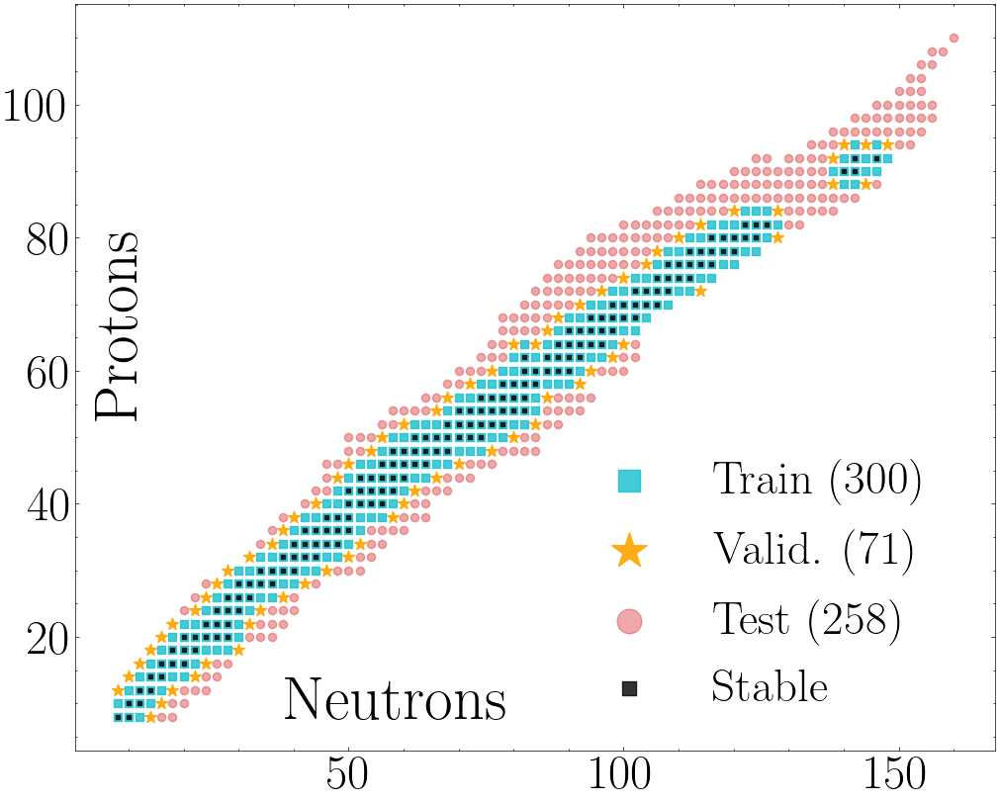

In [38]:
plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

fig, ax = plt.subplots(figsize=(12,10), dpi=100)


color_trainig=colors_sets[9]
color_validation='orange'
color_testing=colors_sets[3]

marker_trainig='s'
marker_validation='*'
marker_testing='o'



size_trainig=30
size_validation=80
size_testing=35

alpha_trainig=0.8
alpha_validation=0.9
alpha_testing=0.4



ax.scatter(x = training_set.T[0], y = training_set.T[1], label = "Train ("+ str(len(training_set))+")", alpha = alpha_trainig,color=color_trainig,s=size_trainig,marker=marker_trainig)

ax.scatter(x = validation_set.T[0], y = validation_set.T[1], label = "Valid. (" + str(len(validation_set))+")", alpha = alpha_validation,color=color_validation,s=size_validation,marker=marker_validation)

ax.scatter(x = test_set.T[0], y = test_set.T[1], label = "Test (" + str(len(test_set))+")", alpha = alpha_testing,color=color_testing,s=size_testing,marker=marker_testing)


ax.scatter(x = stable_coordinates.T[0], y = stable_coordinates.T[1], label = "Stable", alpha = 0.8,color='black',s=11,marker="s")





# ax.scatter(x = np.array(AME2020New).T[0], y = np.array(AME2020New).T[1], label = "Valid. (" + str(len(validation_set))+")", alpha = alpha_validation,color=color_validation,s=size_validation,marker=marker_validation)


plt.xlabel('')

plt.annotate('Neutrons', xy=(0.35, 0.1), xycoords='axes fraction',
             ha='center', va='top', fontsize=45) 
plt.ylabel('')

plt.annotate('Protons', xy=(0.05,0.7), xycoords='axes fraction',
             ha='center', va='top', fontsize=45,rotation =90) 


# plt.ylabel("Protons",fontsize=45)
plt.legend(fontsize=34,markerscale=3 ,loc =(0.53,0.03))
plt.show()

In [39]:

models_output = selected_models_data_sets

models_output.rename(columns={'AME2020': 'truth'}, inplace=True)
models_output["A"] = models_output["N"] + models_output["Z"]


cols = list(models_output.columns)

cols[2], cols[-1] = cols[-1], cols[2]

models_output = models_output[cols]


models_output_train = {}
models_output_validation = {}
models_output_test = {}
key_list=models_selected[1:]



In [40]:
models_output

,N,Z,A,ME2,MEdelta,PC1,NL3S,SKMS,SKP,SLY4,SV,UNEDF0,UNEDF1,UNEDF2,FRDM12,HFB24,BCPM,D1M,truth
0,8,8,16,126.738,129.026,127.455,128.114,128.856436,128.904993,129.839429,127.368236,126.708495,121.705460,121.950687,128.03,125.632422,127.007944,128.028806,127.619315
1,10,8,18,140.156,141.992,141.423,141.715,144.746257,144.484846,144.734392,141.963546,142.040342,136.123181,136.259511,141.84,138.095058,141.145503,141.000517,139.807766
2,12,8,20,151.224,152.793,153.215,153.432,158.460613,156.849135,156.488630,153.746333,154.121072,147.620242,148.128389,152.98,151.927694,153.041593,151.904718,151.371414
3,14,8,22,160.513,161.884,163.303,163.311,170.486446,167.278899,166.483309,163.855872,164.192707,157.219361,158.409799,161.39,161.930329,163.391272,160.883175,162.027188
4,16,8,24,167.472,168.465,170.768,170.970,178.908577,174.420231,173.303716,170.930478,171.196394,163.998623,165.167568,165.98,168.322965,170.887643,166.974152,168.952452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
624,154,106,260,1910.765,1907.813,1909.928,1914.193,1894.445901,1900.875946,1898.639172,1902.293050,1907.479821,1908.851310,1908.842630,1909.73,1909.145350,1905.125660,1901.308909,1909.066432
625,156,106,262,1925.019,1921.738,1924.361,1928.042,1909.221132,1915.371887,1912.434046,1916.575965,1921.884406,1922.815073,1922.920406,1923.99,1923.647986,1919.402948,1915.781516,1923.387483
626,156,108,264,1928.415,1925.436,1927.488,1932.395,1911.680941,1918.341803,1916.133844,1919.723353,1925.454882,1926.206982,1926.326995,1927.52,1926.745956,1922.608355,1918.524169,1926.771317
627,158,108,266,1943.010,1939.691,1942.276,1946.498,1927.231556,1933.157370,1930.669126,1934.554087,1940.259078,1940.812152,1940.991163,1942.52,1941.618592,1937.508145,1933.626547,1941.337453


In [41]:
#Separating outputs for the three regions
models_output_train = models_output.iloc[train_coordinates]

models_output_validation = models_output.iloc[validation_coordinates]

#Use the command below if we decide NOT to have a validation set
# models_output_validation = models_output.iloc[test_coordinates]

models_output_test = models_output.iloc[test_coordinates]

In [42]:
key_list

['ME2',
 'MEdelta',
 'PC1',
 'NL3S',
 'SKMS',
 'SKP',
 'SLY4',
 'SV',
 'UNEDF0',
 'UNEDF1',
 'UNEDF2',
 'FRDM12',
 'HFB24',
 'BCPM',
 'D1M']

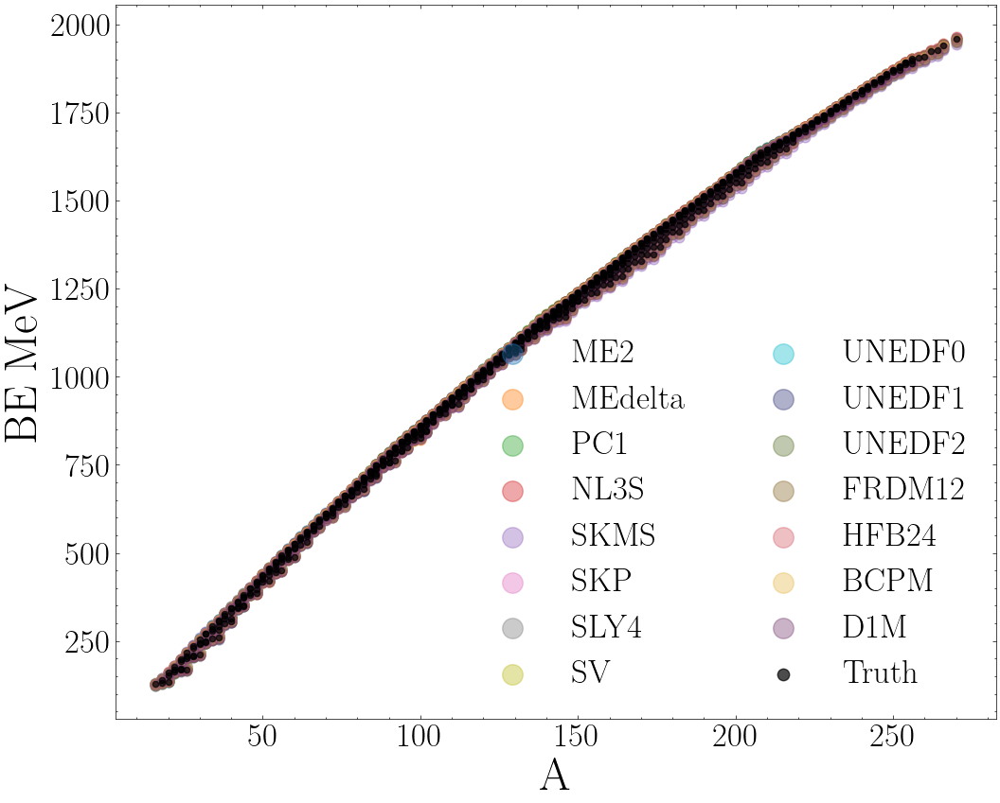

In [43]:
plt.rc("xtick", labelsize=25)
plt.rc("ytick", labelsize=25)

fig, ax = plt.subplots(figsize=(12,10), dpi=100)

i=0
for model in key_list:

    ax.scatter(x = models_output["A"], y = models_output[model], label = model,color=colors[i] ,alpha = 0.4,marker=markers[0],s=60)
    i=i+1   




ax.scatter(x = models_output["A"], y = models_output['truth'], label = "Truth", alpha = 0.7,color='k',s=20)


plt.xlabel("A",fontsize=35)
plt.ylabel("BE MeV",fontsize=35)
plt.legend(fontsize=25,markerscale=2,ncol=2  )

plt.show()

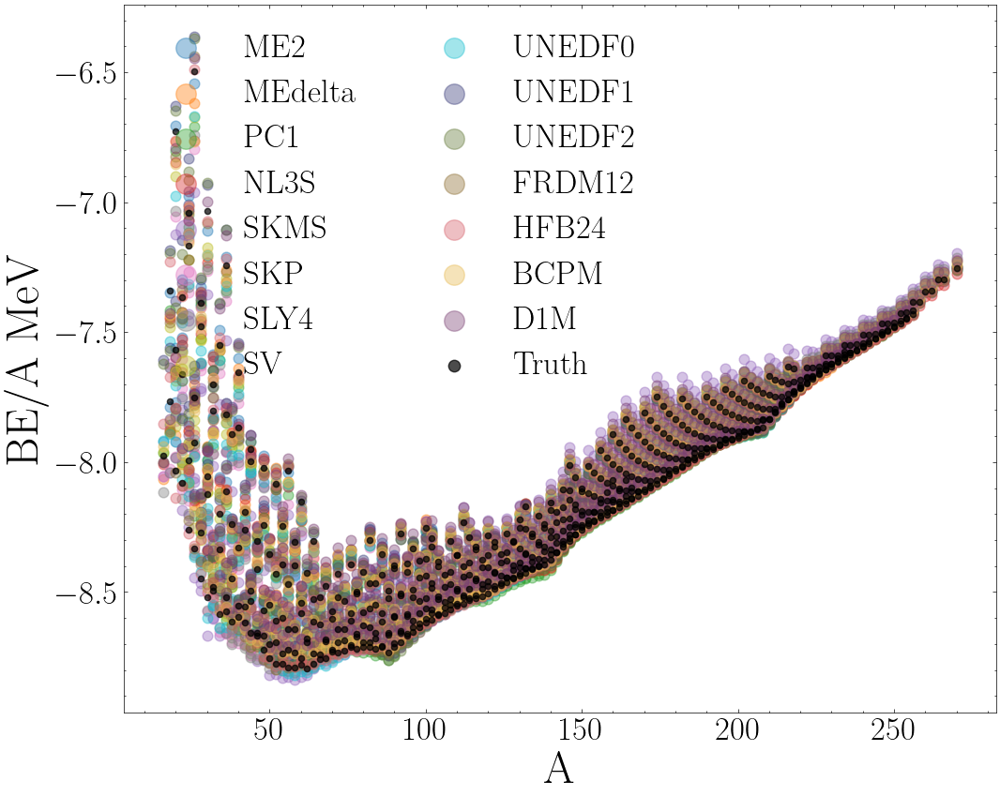

In [44]:
plt.rc("xtick", labelsize=25)
plt.rc("ytick", labelsize=25)

fig, ax = plt.subplots(figsize=(12,10), dpi=100)

i=0
for model in key_list:

    ax.scatter(x = models_output["A"], y =- models_output[model]/models_output["A"], label = model,color=colors[i] ,alpha = 0.4,marker=markers[0],s=60)
    i=i+1   




ax.scatter(x = models_output["A"], y =- models_output['truth']/models_output["A"], label = "Truth", alpha = 0.7,color='k',s=20)


plt.xlabel("A",fontsize=35)
plt.ylabel("BE/A MeV",fontsize=35)
plt.legend(fontsize=25,markerscale=2,ncol=2  )

plt.show()

In [45]:
residuals = models_output['truth'].values[:,None] - models_output[key_list].values 

residuals_train = models_output_train['truth'].values[:,None] - models_output_train[key_list].values 

residuals_validation  = models_output_validation['truth'].values[:,None] - models_output_validation[key_list].values 

residuals_test  = models_output_test['truth'].values[:,None] - models_output_test[key_list].values 



model_predictions=models_output[key_list].values
model_predictions_train=models_output_train[key_list].values
model_predictions_validation=models_output_validation[key_list].values
model_predictions_test=models_output_test[key_list].values






model_summary = {}
model_summary["rmse_all"] = np.sqrt(np.mean(residuals ** 2, axis = 0))
model_summary["rmse_train"] = np.sqrt(np.mean(residuals_train ** 2, axis = 0))
model_summary["rmse_validation"] = np.sqrt(np.mean(residuals_validation ** 2, axis = 0))
model_summary["rmse_test"] = np.sqrt(np.mean(residuals_test ** 2, axis = 0))


model_summary_df = pd.DataFrame(model_summary, index =key_list)
print(model_summary_df)
print(model_summary_df.style.format(precision = 2).to_latex())
#print(model_summary_df.to_latex(float_format="%.2f"))

         rmse_all  rmse_train  rmse_validation  rmse_test
ME2      2.384449    2.472793         2.476089   2.250345
MEdelta  2.316343    2.455282         2.191281   2.179378
PC1      2.026546    1.938838         1.771511   2.185832
NL3S     2.841010    2.180150         2.153837   3.588086
SKMS     7.416662    4.914565         6.337776   9.745115
SKP      3.721933    3.062883         3.501502   4.414797
SLY4     5.344093    4.525944         4.841938   6.273489
SV       3.418812    2.966932         2.988416   3.975236
UNEDF0   1.558200    1.470986         2.024397   1.508496
UNEDF1   1.922609    1.824113         1.825458   2.055661
UNEDF2   1.902711    1.832598         1.656403   2.041097
FRDM12   0.632335    0.622523         0.616965   0.647648
HFB24    0.517972    0.520415         0.512692   0.516569
BCPM     2.491569    2.572482         2.338345   2.436212
D1M      5.267813    5.018423         4.914081   5.632397
\begin{tabular}{lrrrr}
 & rmse_all & rmse_train & rmse_validation & rmse

In [46]:
model_summary_df

,rmse_all,rmse_train,rmse_validation,rmse_test
ME2,2.384449,2.472793,2.476089,2.250345
MEdelta,2.316343,2.455282,2.191281,2.179378
PC1,2.026546,1.938838,1.771511,2.185832
NL3S,2.841010,2.180150,2.153837,3.588086
SKMS,7.416662,4.914565,6.337776,9.745115
SKP,3.721933,3.062883,3.501502,4.414797
SLY4,5.344093,4.525944,4.841938,6.273489
SV,3.418812,2.966932,2.988416,3.975236
UNEDF0,1.558200,1.470986,2.024397,1.508496
UNEDF1,1.922609,1.824113,1.825458,2.055661


Now we prepare the data that relates to a single isotope chain for plotting

In [47]:

Z_range=(Selected_element,Selected_element)
N_range=(0,300)


filtered_models_output = models_output[(models_output['Z'] >= Z_range[0]) & (models_output['Z'] <= Z_range[1]) & 
                     (models_output['N'] >= N_range[0]) & (models_output['N'] <= N_range[1])]  

filtered_models_output_train = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'] >= N_range[0]) & (models_output_train['N'] <= N_range[1])]

filtered_models_output_test = models_output_test[(models_output_test['Z'] >= Z_range[0]) & (models_output_test['Z'] <= Z_range[1]) & 
                     (models_output_test['N'] >= N_range[0]) & (models_output_test['N'] <= N_range[1])]

filtered_models_output_validation = models_output_validation[(models_output_validation['Z'] >= Z_range[0]) & (models_output_validation['Z'] <= Z_range[1]) & 
                     (models_output_validation['N'] >= N_range[0]) & (models_output_validation['N'] <= N_range[1])]


stable_selected_isotope=[]

for i in range(len(stable_coordinates)):
    if stable_coordinates[i][1]==Selected_element:
        stable_selected_isotope.append(stable_coordinates[i])

stable_selected_isotope=np.array(stable_selected_isotope)

# df[df['Column1'].isin(values_array)]

filtered_models_output_stable = models_output_train[(models_output_train['Z'] >= Z_range[0]) & (models_output_train['Z'] <= Z_range[1]) & 
                     (models_output_train['N'].isin(stable_selected_isotope.T[0]))]

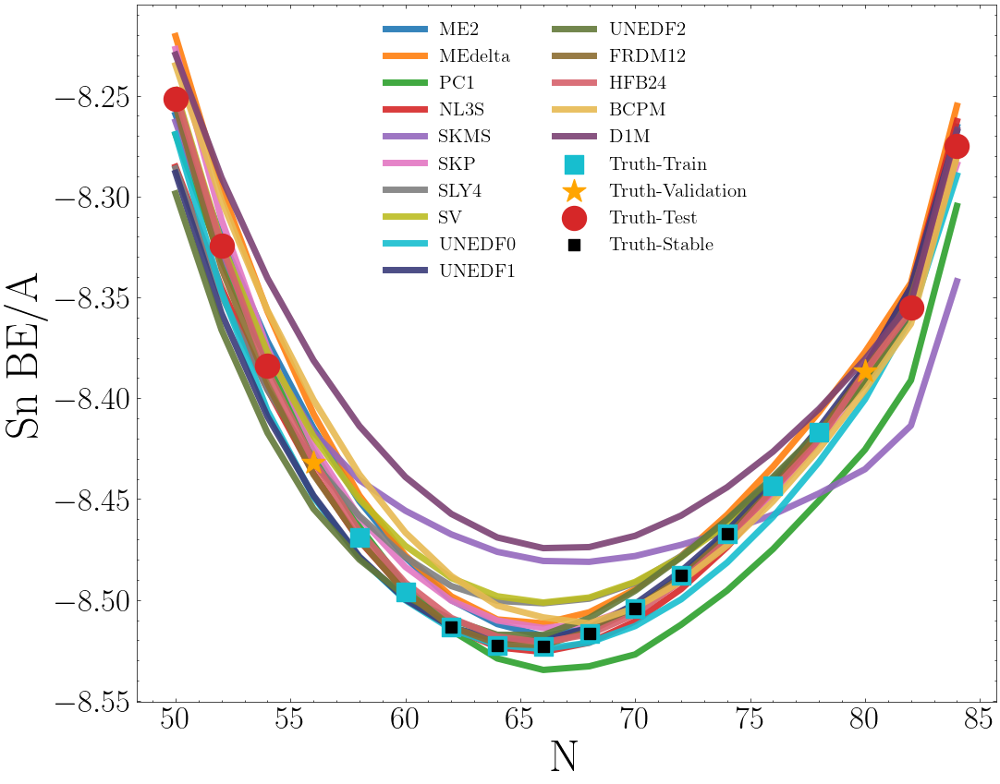

In [48]:
plt.rc("xtick", labelsize=25)
plt.rc("ytick", labelsize=25)

fig, ax = plt.subplots(figsize=(12,10), dpi=100)



i=0
for model in key_list:
   
    ax.plot(filtered_models_output["N"], -filtered_models_output[model]/filtered_models_output["A"], label = model, color=colors_models[i], alpha = 0.9,linewidth=5,zorder=1)
    i=i+1
           








ax.scatter(x = filtered_models_output_train["N"], y = -filtered_models_output_train['truth']/filtered_models_output_train["A"], label = "Truth-Train",  alpha = 1,color=color_trainig,s=200,marker=marker_trainig,zorder=2)

ax.scatter(x = filtered_models_output_validation["N"], y = -filtered_models_output_validation['truth']/filtered_models_output_validation["A"], label = "Truth-Validation", alpha = 1,color=color_validation,s=350,marker=marker_validation,zorder=2)

ax.scatter(x = filtered_models_output_test["N"], y = -filtered_models_output_test['truth']/filtered_models_output_test["A"], label = "Truth-Test", alpha = 1,color=color_testing,s=350,marker=marker_testing,zorder=2)

ax.scatter(x = filtered_models_output_stable["N"], y = -filtered_models_output_stable['truth']/filtered_models_output_stable["A"], label = "Truth-Stable", alpha = 1,color='k',s=80,marker="s",zorder=2)



plt.xlabel("N",fontsize=35)
plt.ylabel(Selected_element_name+" BE/A",fontsize=35)
# plt.legend(fontsize=18,markerscale=1 )
plt.legend(fontsize=15,markerscale=1,ncol=2  )

plt.show()

## PCA - Analysis

In [49]:
predictions_mean= np.mean(model_predictions, axis=1)
predictions_train_mean= np.mean(model_predictions_train, axis=1)
predictions_validation_mean= np.mean(model_predictions_validation, axis=1)
predictions_test_mean= np.mean(model_predictions_test, axis=1)

In [50]:
if centering_data:
    model_predictions_train_processed=np.array([model_predictions_train.T[j]-predictions_train_mean for j in range(len(model_predictions_train.T))]).T
else:
    model_predictions_train_processed=np.copy(model_predictions_train)



In [51]:
U, S, Vt = np.linalg.svd(model_predictions_train_processed)

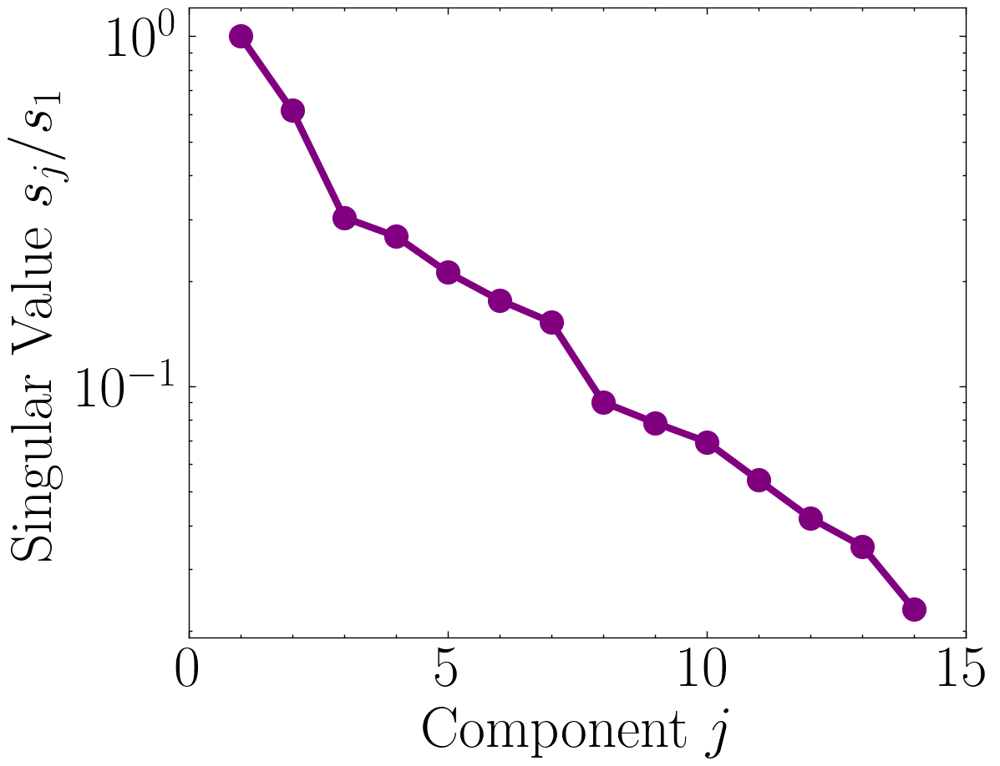

In [52]:
plt.rc("xtick", labelsize=25)
plt.rc("ytick", labelsize=25)


fig, ax = plt.subplots(figsize=(6,5),dpi=200)
fig.patch.set_facecolor('white')

#We plot only up to n-1 singular values if we centered the data because the nth value is numerical noise ~10**(-15)
if centering_data:
    ax.scatter(np.arange(1,S.size), S[0:-1]/S[0],color='purple',s=90)
    ax.plot(np.arange(1,S.size), S[0:-1]/S[0],color='purple',linewidth=3)
else:
    ax.scatter(np.arange(1,S.size+1), S/S[0],color='purple',s=90)
    ax.plot(np.arange(1,S.size+1), S/S[0],color='purple',linewidth=3)    






# if centering_data:
#     ax.scatter(np.arange(1,S.size), S[0:-1],color='purple',s=90)
#     ax.plot(np.arange(1,S.size), S[0:-1],color='purple',linewidth=3)
# else:
#     ax.scatter(np.arange(1,S.size+1), S,color='purple',s=90)
#     ax.plot(np.arange(1,S.size+1), S,color='purple',linewidth=3)    

ax.set_yscale('log')
ax.set_xlabel(r'Component $j$',fontsize=25)
ax.set_ylabel(r' Singular Value $s_j/s_1$',fontsize=25);
# plt.ylim(2*10**(-3),1.5)
ax.set_xticks([0,5,10,15])
# plt.title("Singular values decay",fontsize=30)
plt.show()

### How many PC we want to keep?

In [53]:
components_kept=7

In [54]:

S_hat=np.array([S[i] for i in range(components_kept)])


#No scalling at all:
U_hat=np.array([U.T[i] for i in range(components_kept)])
Vt_hat=np.array([Vt[i]/S[i] for i in range(components_kept)])

#The S needs to be absorved somewhere, either on the U or the V. We chosed the V, but we might want to have normalized Vs for plotting:
Vt_hat_normalized=np.array([Vt[i] for i in range(components_kept)])


#Scaling manually, this is something you can do if you want the PC to have a similar size as the regular models
############################

# U_hat=np.array([U.T[i]*np.linalg.norm(predictions_train_mean) for i in range(components_kept)])
# #This represents the coefficients that we use to write the normalized PC everywhere as linear combinations of the original models. It is scaled by 
# # the values of S_hat such that the norm of the PC keeps ~ constant even as we increase the number of models
# Vt_hat=np.array([Vt[i]/S_hat[i]*np.linalg.norm(predictions_train_mean) for i in range(components_kept)])   
# #These are the normalized coefficients (norm[Vt_hat_normalized[i]] is 1). We use this to plot PC projections to distinguish between clusters of models
# Vt_hat_normalized=np.array([Vt[i] for i in range(components_kept)])


if centering_data:
    num_components=components_kept+1
else:
    num_components=components_kept


In [55]:
#Creating principal components that are for training. These should be equivalent to \hat U, and if they are not there is something wrong



models_PC_train = {}

if centering_data:
    models_PC_train[str("PC_0")] = predictions_train_mean
    
for i in range(components_kept):
    models_PC_train[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_train.T)

models_PC_train["N"] = models_output_train["N"]
models_PC_train["Z"] = models_output_train["Z"]
models_PC_train["A"] = models_PC_train["N"] + models_PC_train["Z"]

models_PC_training = pd.DataFrame(models_PC_train)



In [56]:
#Creating principal components that are for validation



models_PC_validation = {}

if centering_data:
    models_PC_validation[str("PC_0")] = predictions_validation_mean
    
for i in range(components_kept):
    models_PC_validation[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_validation.T)

models_PC_validation["N"] = models_output_validation["N"]
models_PC_validation["Z"] = models_output_validation["Z"]
models_PC_validation["A"] = models_PC_validation["N"] + models_PC_validation["Z"]

models_PC_validation = pd.DataFrame(models_PC_validation)



In [57]:
#Creating principal components that are for testing



models_PC_testing = {}

if centering_data:
    models_PC_testing[str("PC_0")] = predictions_test_mean
for i in range(components_kept):
    # models_PC_testing[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_test.T)*S_hat[i]
    models_PC_testing[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_test.T)

models_PC_testing["N"] = models_output_test["N"]
models_PC_testing["Z"] = models_output_test["Z"]
models_PC_testing["A"] = models_PC_testing["N"] + models_PC_testing["Z"]

models_PC_testing = pd.DataFrame(models_PC_testing)






In [58]:
#Creating principal components that are valid everywhere (testing + training + validation)
models_PC = {}

if centering_data:
    models_PC[str("PC_0")] = predictions_mean

for i in range(components_kept):
    models_PC[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions.T)

models_PC = pd.DataFrame(models_PC)
models_PC["N"] = Full_set.T[0]
models_PC["Z"] = Full_set.T[1]
models_PC["A"] = models_PC["N"] + models_PC["Z"]

In [59]:
#Creating principal components that are focused on the isotope chain we specified before

filtered_models_PC = models_PC[(models_PC['Z'] >= Z_range[0]) & (models_PC['Z'] <= Z_range[1]) & 
                     (models_PC['N'] >= N_range[0]) & (models_PC['N'] <= N_range[1])]

In [60]:
key_list_PCs=list(filtered_models_PC.keys())

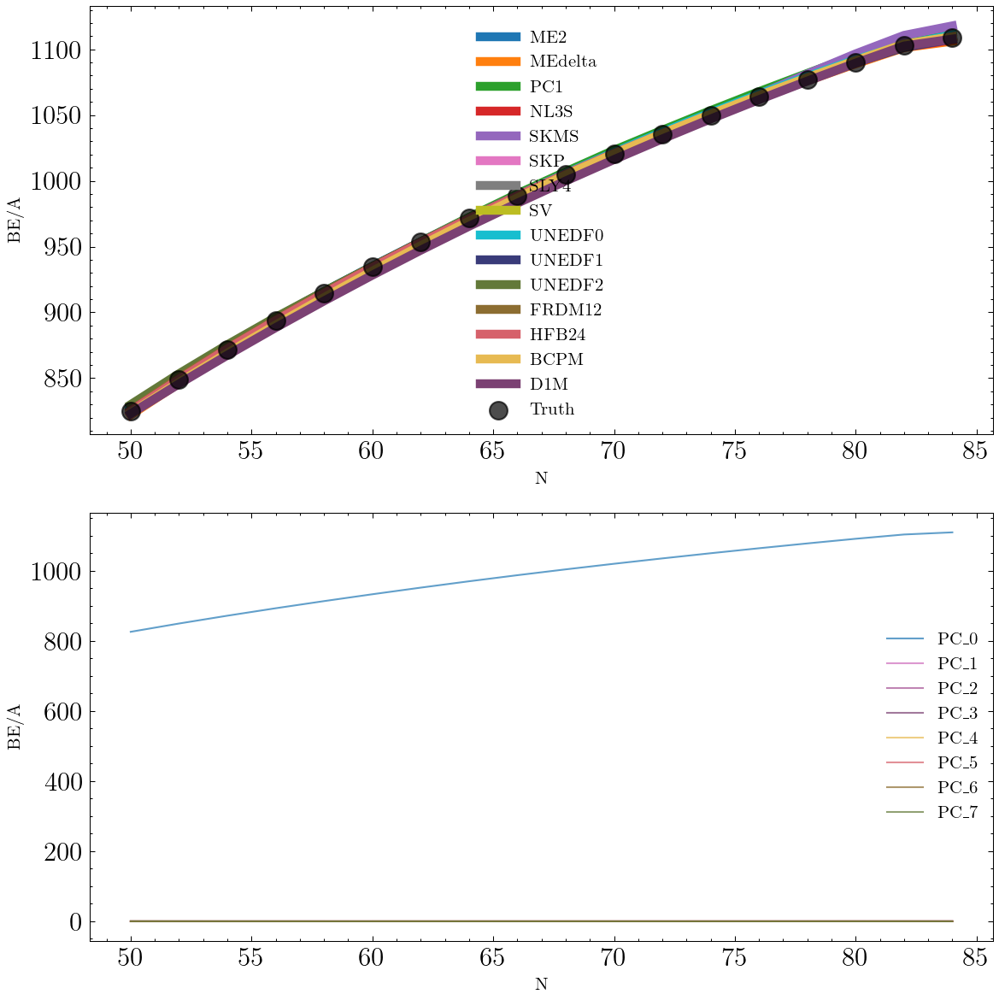

In [61]:
plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)

# fig, ax = plt.subplots(figsize=(12,10), dpi=100)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(8, 8),dpi=150)



i=0
for model in key_list:
   
    ax1.plot(filtered_models_output["N"], filtered_models_output[model], label = model, color=colors_models[i],linewidth=5,zorder=1)
    i=i+1



ax1.scatter(x = filtered_models_output["N"], y = filtered_models_output['truth'], label = "Truth", alpha = 0.7,color='k',s=100)

ax1.set_xlabel("N")
ax1.set_ylabel("BE/A")
ax1.legend()







for i in range(num_components):
    ax2.plot(filtered_models_PC["N"], filtered_models_PC[key_list_PCs[i]], label =key_list_PCs[i], alpha = 0.7,color=colors[-i])

ax2.set_xlabel("N")
ax2.set_ylabel("BE/A")
ax2.legend()





plt.tight_layout()

plt.show()

### Making some 3D plots of the PCs

In [62]:
x_values=models_PC["N"].tolist()
y_values=models_PC["Z"].tolist()
pc_data=[]

if centering_data:
    pc_data.append([x_values,y_values,models_PC["PC_0"].tolist()])

for i in range(components_kept):
    pc_data.append([x_values,y_values,models_PC[str("PC_")+str(i+1)].tolist()])

    
pc_data=np.array(pc_data)    

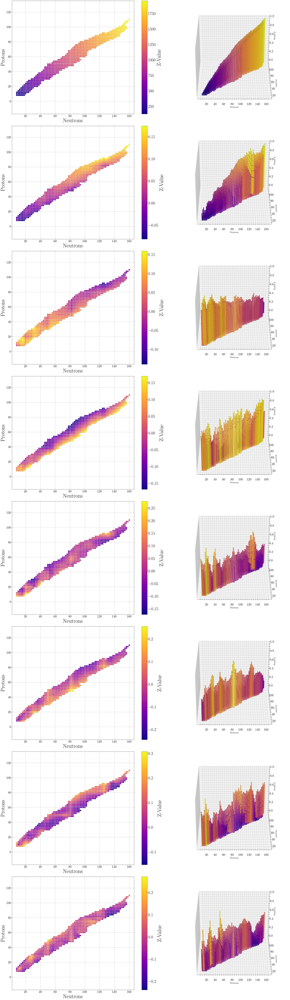

In [63]:
PlotMultiple(pc_data,[30,-90])

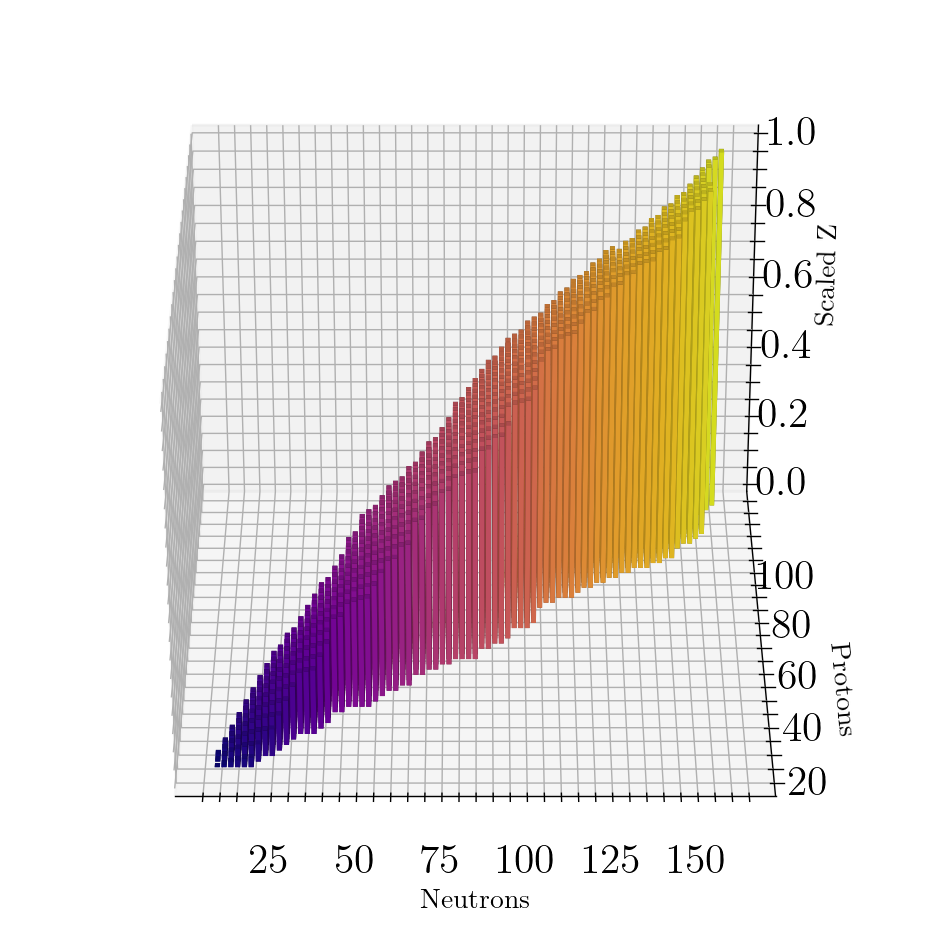

In [64]:
#If we want to see some of them in more detail

Plotter3D_single(pc_data[0],elev=30,azim=-90)

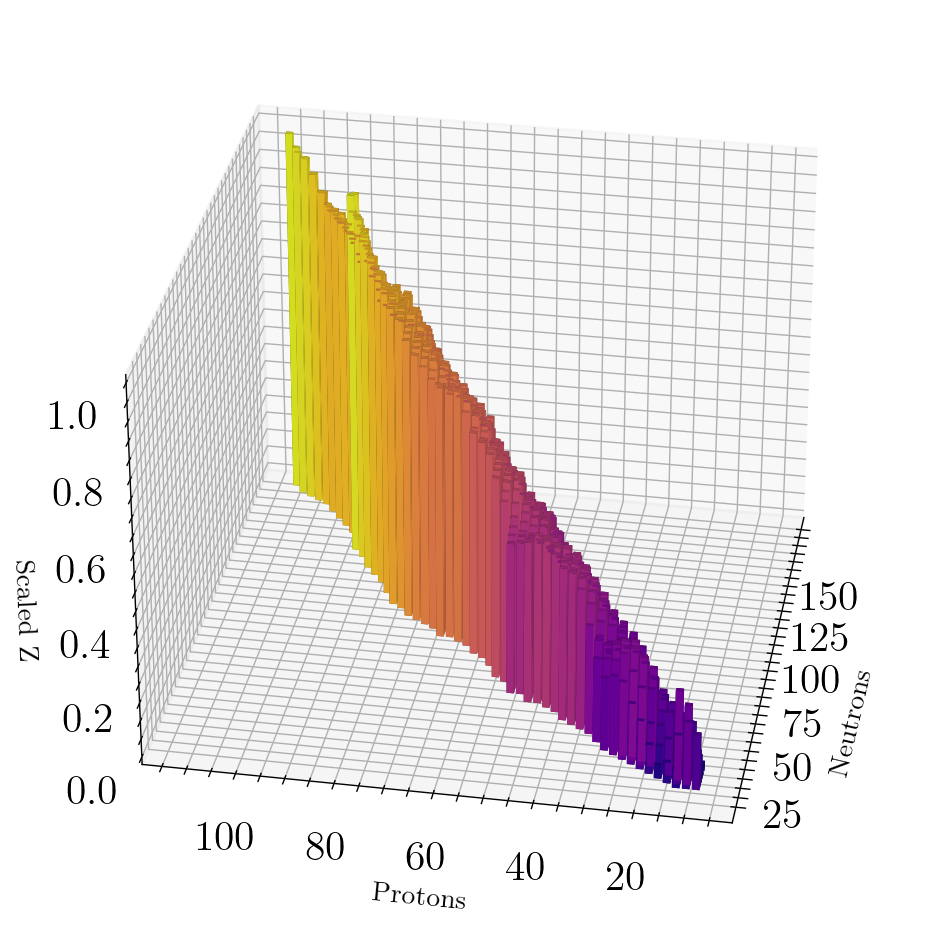

In [65]:
Plotter3D_single(pc_data[1],elev=30,azim=-170)

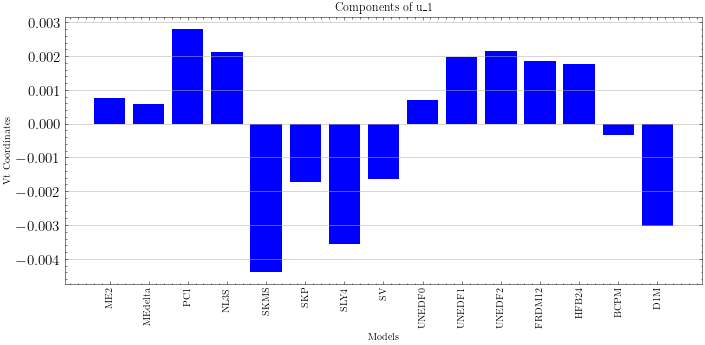

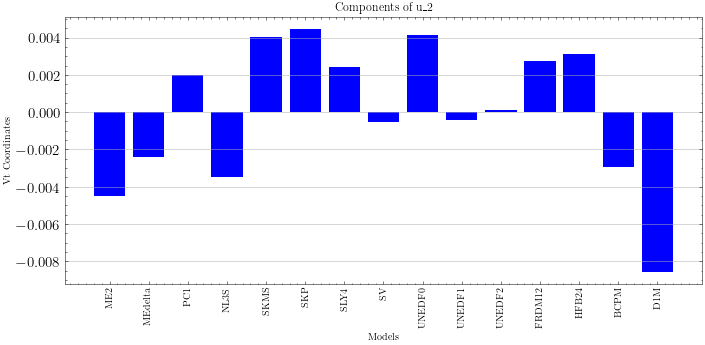

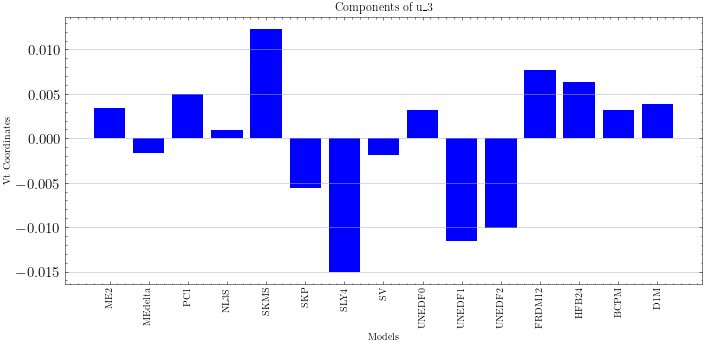

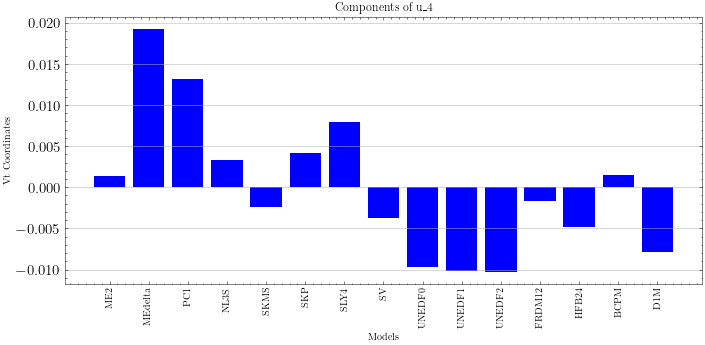

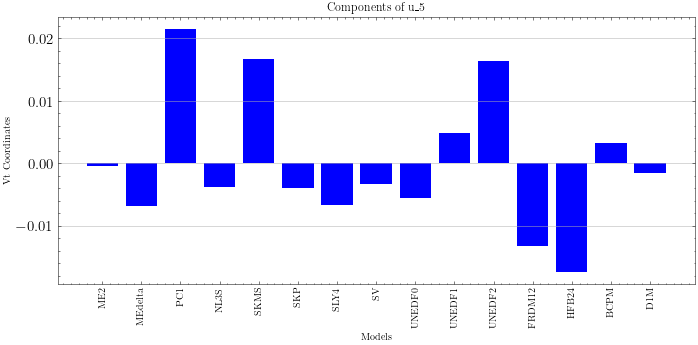

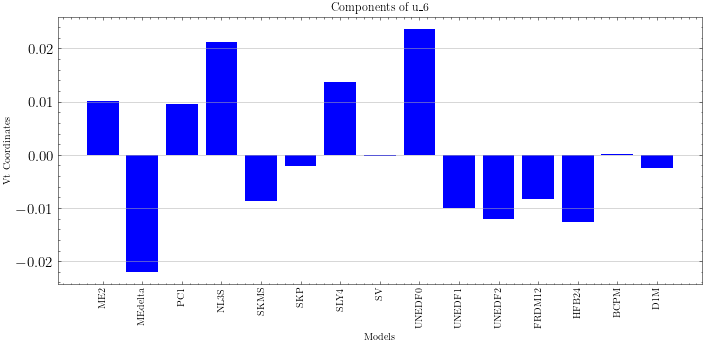

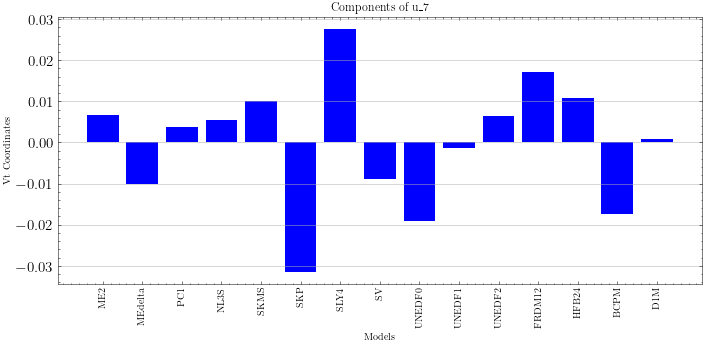

In [66]:
#We can also see how the PC are made up from the different models


for i in range(len(Vt_hat)):

    plot_bars(Vt_hat[i], key_list, title=f"Components of u_{i+1}", color='blue')

### Plotting the projections of each model on the PCs

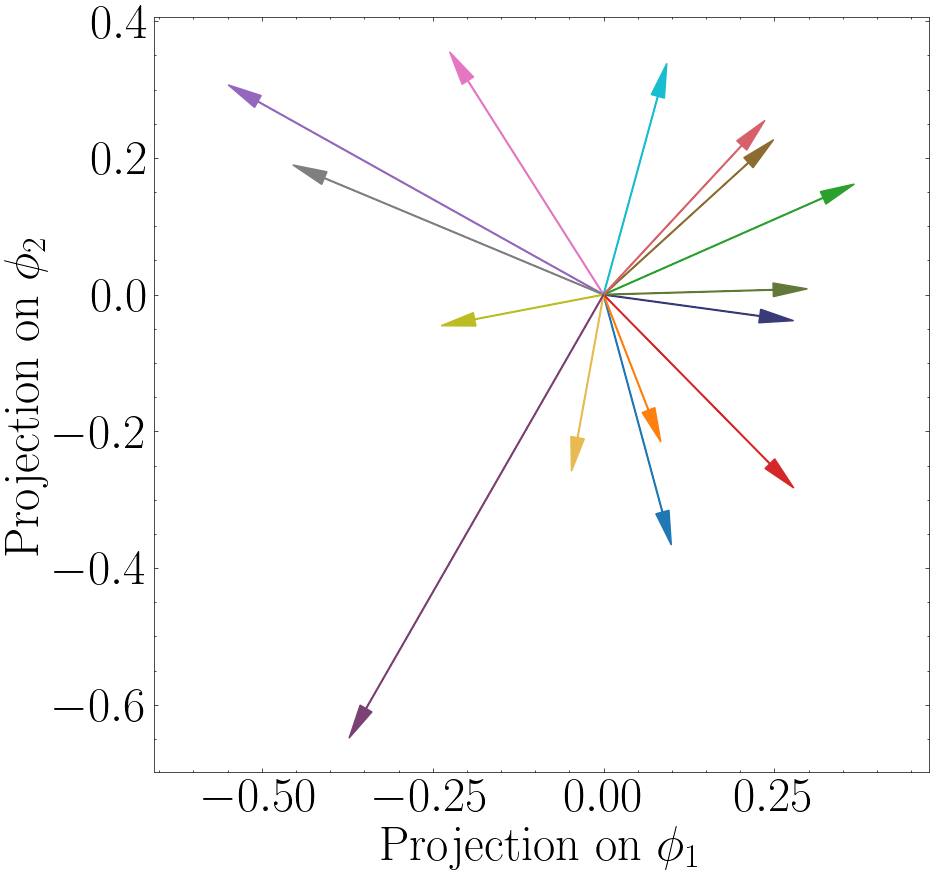

In [67]:

plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

fig, ax = plt.subplots(figsize=(10,10), dpi=100)


visited_model=0
for model in key_list:
    ax.arrow(0, 0, Vt_hat_normalized.T[visited_model][0],Vt_hat_normalized.T[visited_model][1], 
            head_width=0.02, head_length=0.05, fc=colors[visited_model], ec=colors[visited_model],label=model)
#     plt.text(Vt_hat_normalized.T[visited_model][0], Vt_hat_normalized.T[visited_model][1], model,fontsize=20,ha='center', va='center')    
    # ax.arrow(0, 0, Vt_hat_normalized.T[visited_model][0],Vt_hat_normalized.T[visited_model][1], 
    #     head_width=0.02, head_length=0.05, fc='w', ec='w',label=model)

    # ax.arrow(0, 0, Vt_hat_normalized.T[visited_model][0],Vt_hat_normalized.T[visited_model][1], 
    #         head_width=0.02, head_length=0.05, fc=colors[visited_model], ec=colors[visited_model],label=str(visited_model))

    visited_model=visited_model+1



plt.xlabel('Projection on $\phi_1$',fontsize=35)
plt.ylabel('Projection on $\phi_2$',fontsize=35)

plt.xticks(fontsize=35)
plt.yticks(fontsize=35)


# plt.legend(fontsize=15,ncols=2)
# ax.set_xticks([-0.2,0,0.2,0.4,0.6])
plt.axis('equal')
# plt.xlim(-0.25, 0.6)
# plt.ylim(-0.43, 0.5)

plt.show()


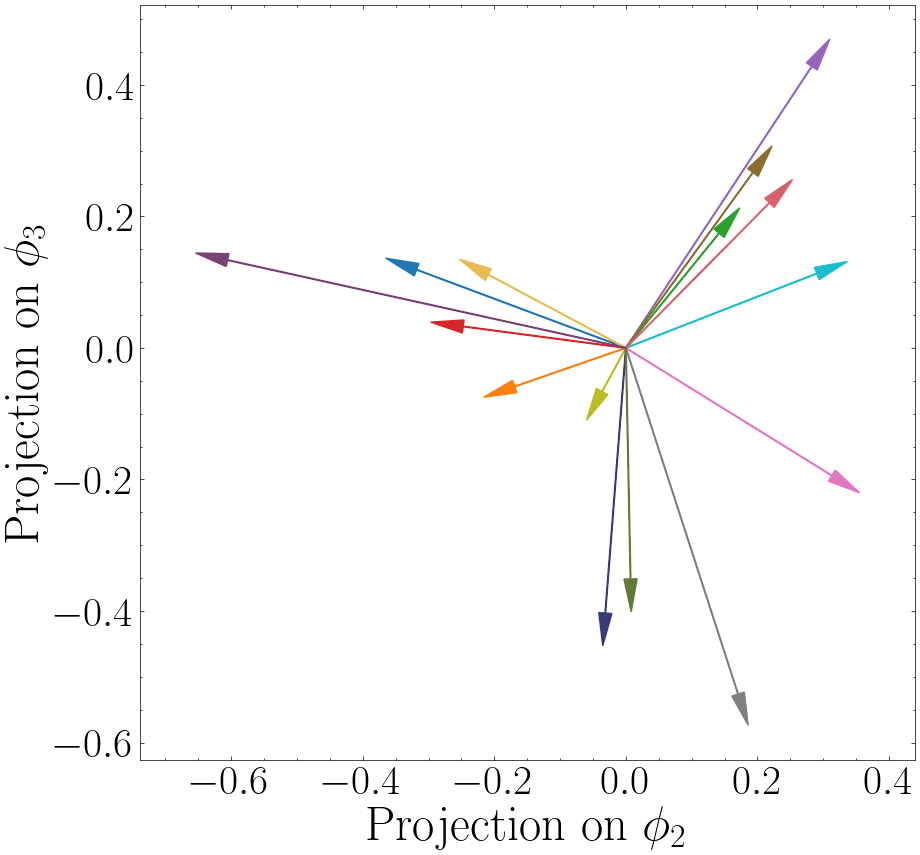

In [68]:

if components_kept>2:

    plt.rc("xtick", labelsize=30)
    plt.rc("ytick", labelsize=30)

    # fig, ax = plt.subplots(figsize=(10,8), dpi=100)
    fig, ax = plt.subplots(figsize=(10,10), dpi=100)



    visited_model=0
    for model in key_list:
        
        ax.arrow(0, 0, Vt_hat_normalized.T[visited_model][1],Vt_hat_normalized.T[visited_model][2], 
                head_width=0.02, head_length=0.05, fc=colors[visited_model], ec=colors[visited_model],label=model)
        # plt.text(Vt_hat_normalized.T[visited_model][1], Vt_hat_normalized.T[visited_model][2], model,fontsize=20,ha='center', va='center') 

        visited_model=visited_model+1




    # Determine plot limits based on the maximum absolute values of the vectors
    # max_val = max(max(abs(coordinate) for vector in list1 + list2 for coordinate in vector))
    # plt.xlim(-max_val-1, max_val+1)
    # plt.ylim(-max_val-1, max_val+1)

    plt.xlabel('Projection on $\phi_2$',fontsize=35)
    plt.ylabel('Projection on $\phi_3$',fontsize=35)

    # plt.legend(fontsize=15)

    plt.axis('equal')

    plt.show()


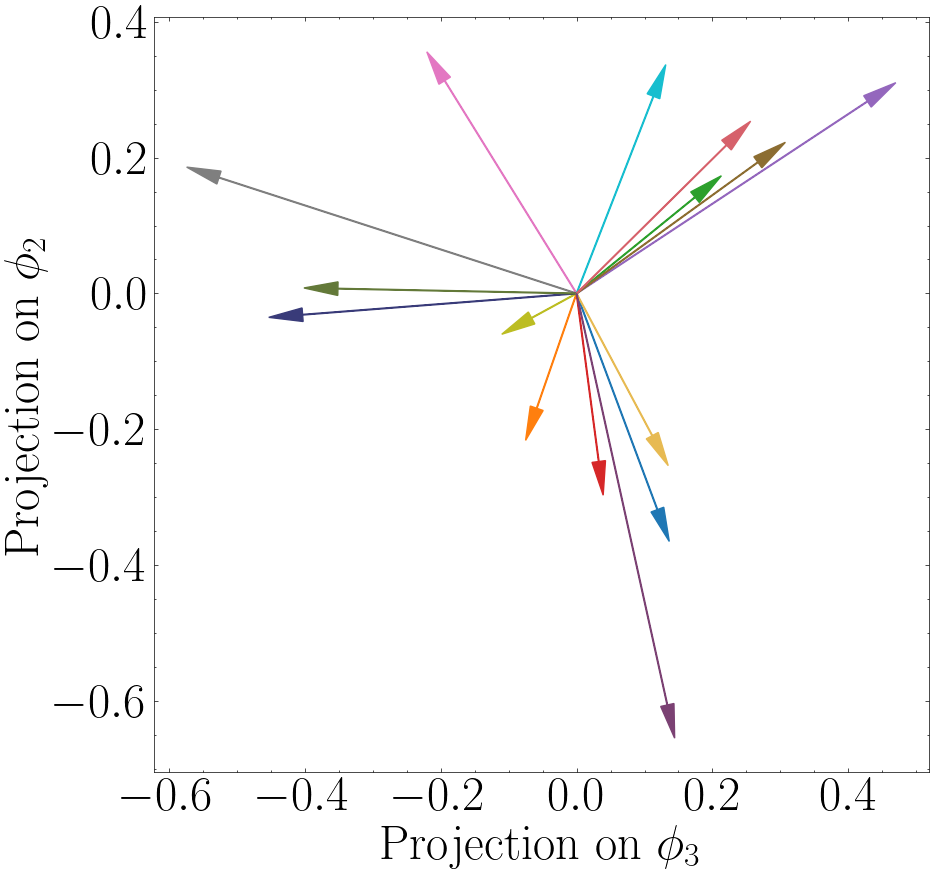

In [69]:

if components_kept>2:

    plt.rc("xtick", labelsize=30)
    plt.rc("ytick", labelsize=30)

    # fig, ax = plt.subplots(figsize=(10,8), dpi=100)
    fig, ax = plt.subplots(figsize=(10,10), dpi=100)



    visited_model=0
    for model in key_list:
        
        ax.arrow(0, 0, Vt_hat_normalized.T[visited_model][2],Vt_hat_normalized.T[visited_model][1], 
                head_width=0.02, head_length=0.05, fc=colors[visited_model], ec=colors[visited_model],label=model)
        # plt.text(Vt_hat_normalized.T[visited_model][2], Vt_hat_normalized.T[visited_model][1], model,fontsize=20,ha='center', va='center') 

        visited_model=visited_model+1




    # Determine plot limits based on the maximum absolute values of the vectors
    # max_val = max(max(abs(coordinate) for vector in list1 + list2 for coordinate in vector))
    # plt.xlim(-max_val-1, max_val+1)
    # plt.ylim(-max_val-1, max_val+1)

    plt.xlabel('Projection on $\phi_3$',fontsize=35)
    plt.ylabel('Projection on $\phi_2$',fontsize=35)

    # plt.legend(fontsize=15)

    
    plt.xticks(fontsize=35)
    plt.yticks(fontsize=35)

    
    
    plt.axis('equal')

    plt.show()


In [70]:
from mpl_toolkits.mplot3d import Axes3D

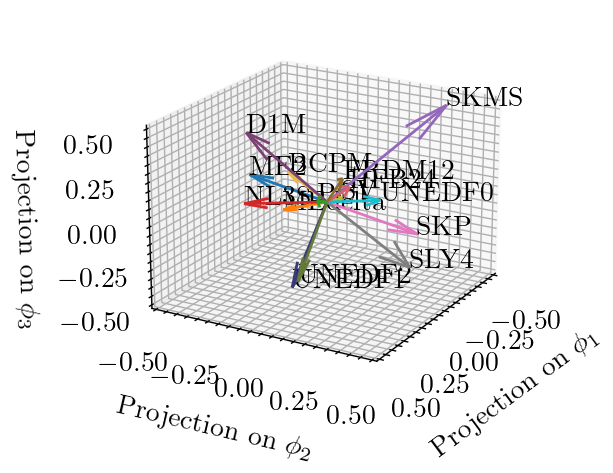

In [71]:


plt.rc("xtick", labelsize=10)
plt.rc("ytick", labelsize=10)

fig = plt.figure(dpi=200)
ax = fig.add_subplot(111, projection='3d')



visited_model=0
for model in key_list:

#     ax.arrow(0, 0, Vt_hat_normalized.T[visited_model][2],Vt_hat_normalized.T[visited_model][1], 
#             head_width=0.02, head_length=0.05, fc=colors[visited_model], ec=colors[visited_model],label=model)
    
    ax.quiver(0,0,0, Vt_hat_normalized.T[visited_model][0],Vt_hat_normalized.T[visited_model][1],Vt_hat_normalized.T[visited_model][2],
             fc=colors[visited_model], ec=colors[visited_model],label=model)
    # plt.text(Vt_hat_normalized.T[visited_model][2], Vt_hat_normalized.T[visited_model][1], model,fontsize=20,ha='center', va='center') 

    ax.text(Vt_hat_normalized.T[visited_model][0],Vt_hat_normalized.T[visited_model][1],Vt_hat_normalized.T[visited_model][2], model)
    
    visited_model=visited_model+1




# Determine plot limits based on the maximum absolute values of the vectors
# max_val = max(max(abs(coordinate) for vector in list1 + list2 for coordinate in vector))
# plt.xlim(-max_val-1, max_val+1)
# plt.ylim(-max_val-1, max_val+1)

# plt.xlabel('Projection on $\phi_3$',fontsize=35)
# plt.ylabel('Projection on $\phi_2$',fontsize=35)

# plt.legend(fontsize=15)

# plt.axis('auto')

ax.set_xlabel('Projection on $\phi_1$')
ax.set_ylabel('Projection on $\phi_2$')
ax.set_zlabel('Projection on $\phi_3$')

ax.view_init(elev=20, azim=30)
scale=0.5
ax.set_xlim([-scale,scale])
ax.set_ylim([-scale,scale])
ax.set_zlim([-scale,scale])

plt.show()


## Calibration section: learning weight distributions from data

In [72]:
X=np.copy(U_hat)
if centering_data:
    y=np.copy(models_output_train["truth"].tolist())-predictions_train_mean
else:
    y=np.copy(models_output_train["truth"].tolist())

In [73]:
#Making the list of principal components across the train part. These should be identical to the X on top made by \hat U
X_train=[]
for i in range(num_components):
    X_train.append(models_PC_train[key_list_PCs[i]].tolist() )
# if centering_data==True:
#     for i in range(num_components):
#         X_train.append(models_PC_train[key_list_PCs[i]].tolist() )

# else:
#     for i in range(num_components):
#         X_train.append(models_PC_train[key_list_PCs[i]].tolist())

X_train=np.array(X_train)

In [74]:
#Making the list of principal components across the validation part
X_validation=[]
for i in range(num_components):
    X_validation.append(models_PC_validation[key_list_PCs[i]].tolist())
# if centering_data==True:
#     for i in range(num_components):
#         X_validation.append(models_PC_validation[key_list_PCs[i]].tolist())
# else:
#     for i in range(num_components):
#         X_validation.append(models_PC_validation[key_list_PCs[i]].tolist())
X_validation=np.array(X_validation)

In [75]:
#Making the list of principal components across the testing part
X_test=[]
for i in range(num_components):
    X_test.append(models_PC_testing[key_list_PCs[i]].tolist())

# if centering_data==True:
#     for i in range(num_components):
#         X_test.append(models_PC_testing[key_list_PCs[i]].tolist())
# else:
#     for i in range(num_components):
#         X_test.append(models_PC_testing[key_list_PCs[i]].tolist())
X_test=np.array(X_test)

In [76]:
#Making the list of principal components across the entire chart (training+validation+testing)
X_full=[]
for i in range(num_components):
    X_full.append(models_PC[key_list_PCs[i]].tolist())
# if centering_data==True:
#     for i in range(num_components):
#         X_full.append(models_PC[key_list_PCs[i]].tolist())
# else:
#     for i in range(num_components):
#         X_full.append(models_PC[key_list_PCs[i]].tolist())
X_full=np.array(X_full)

## Unconstrained approach with empirical noise (linear algebra)

In [77]:
# 1) Find the least square solution for the training part
X_T_X=X.dot(X.T)
X_T_X_inv = np.linalg.inv(X_T_X)

beta = X_T_X_inv.dot(X).dot(y)

# if centering_data==True:
#     supermodel=X.T.dot(beta) + predictions_train_mean
# else:
#     supermodel=X.T.dot(beta)

#1.5) Construct the super model across the entire range and the test range
if centering_data:
    beta_full= np.insert(beta, 0, 1)  #Augmenting the beta list to add a "1" at the begining so it can use the PC0 (the mean)
else:
    beta_full=np.copy(beta)



supermodel=X_train.T.dot(beta_full)

supermodel_train=X_train.T.dot(beta_full)
# supermodel_train=np.copy(supermodel)

supermodel_validation=X_validation.T.dot(beta_full)
supermodel_test=X_test.T.dot(beta_full)
supermodel_full=X_full.T.dot(beta_full)


# 2) Construct the covariance matrix
if centering_data==True:
    residuals = y - supermodel + predictions_train_mean
else:
    residuals = y - supermodel
sigma_squared = np.sum(residuals**2) / len(residuals) 
cov_matrix = sigma_squared * X_T_X_inv

# 3) Make a corner plot
samples = np.random.multivariate_normal(beta, cov_matrix, size=500000)


In [78]:
sigma_squared

0.1427407571860094

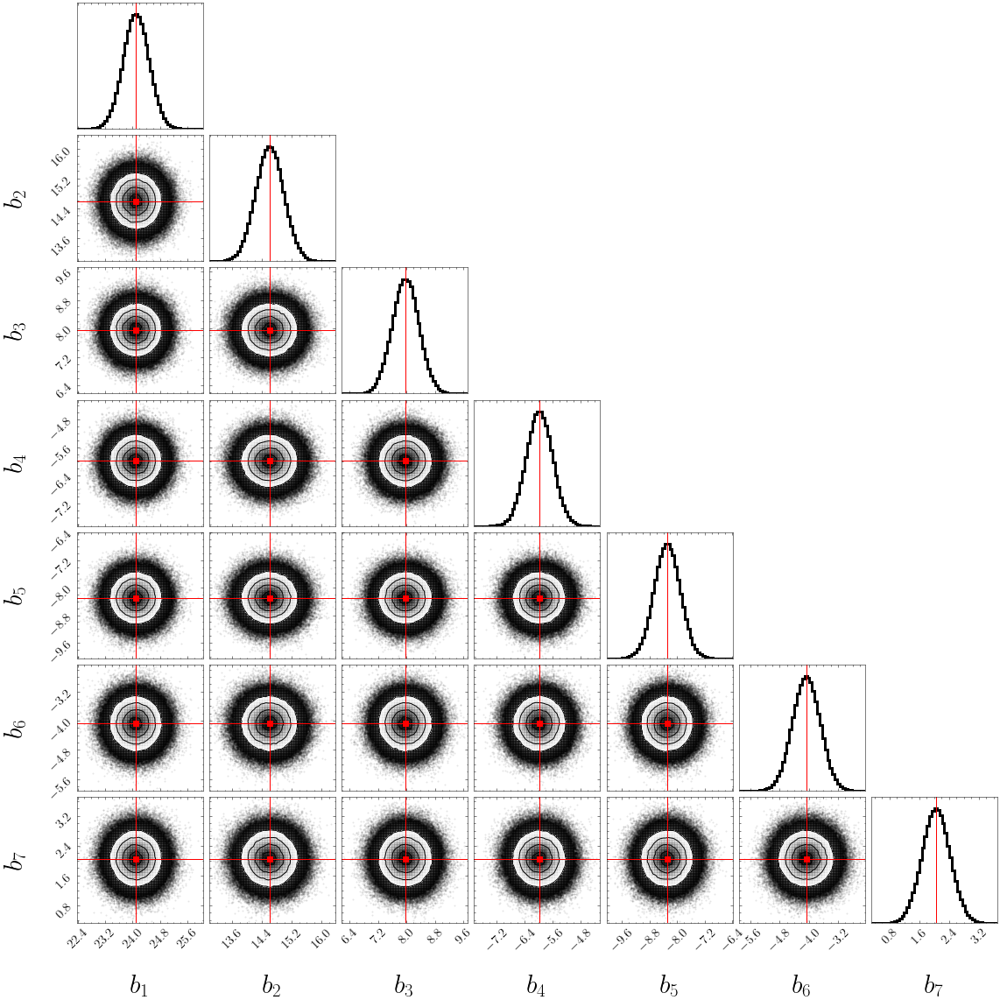

In [79]:
plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)

figure = corner.corner(samples,bins=50, dpi=300, hist_kwargs={"linewidth": 3},
                       labels=[f'$b_{i}$' for i in range(1, len(beta) + 1)], truths=beta,truth_color="r",
                       label_kwargs={"fontsize": 30},labelpad=0.1)


plt.show()

### We can make a plot on the original space from the latent observation. By default is commented out because it might take a couple of minutes

In [80]:
# if centering_data:
#     samples_naive_space = np.array([np.dot(betaval,Vt_hat) + np.full(len(Vt_hat.T),1/len(Vt_hat.T)) for  betaval in samples])
#     figure = corner.corner(samples_naive_space, bins=50, hist_kwargs={"linewidth": 3},labels=[f'w{i}' for i in range(1, len(Vt_hat.T) + 1)], truths=np.dot(beta,Vt_hat)+ np.full(len(Vt_hat.T),1/len(Vt_hat.T)),label_kwargs={"fontsize": 20})
# else:
#     samples_naive_space = np.array([np.dot(betaval,Vt_hat)  for  betaval in samples])
#     figure = corner.corner(samples_naive_space, bins=50, dpi=300, hist_kwargs={"linewidth": 3},labels=[f'w{i}' for i in range(1, len(Vt_hat.T) + 1)], truths=np.dot(beta,Vt_hat),label_kwargs={"fontsize": 30})

# plt.show()


## Unconstrained approach with unknown variance (MC sampling)

In [81]:
nu0_chosen=10
sigma20_chosen=0.5

In [82]:
def gibbs_sampler(y, X, iterations,prior_info):
    #Make sure that "y" has the correct structure. If data is being centered, it should have the mean already substracted
    b_mean_prior, b_mean_cov, nu0, sigma20  =  prior_info
    #From A_First_Course_in_Bayesian_Statistical_Methods (page ~ 159), 
    #nu0 represent the effective prior samples and sigma2_0 represents the expected prior variance
    
    b_mean_cov_inv=np.linalg.inv(b_mean_cov)
    
    
    n = len(y)
    X_T_X=X.dot(X.T)
    X_T_X_inv = np.linalg.inv(X_T_X)

    b_data = X_T_X_inv.dot(X).dot(y)

    
    
    supermodel=X.T.dot(b_data)
    

    residuals = y - supermodel 

    
    
    sigma2 = np.sum(residuals**2) / len(residuals) 
    cov_matrix = sigma2 * X_T_X_inv
    
    samples = []
    
    for i in range(iterations):
        # Sample from the conditional posterior of bs given sigma2 and data

        
        cov_matrix = np.linalg.inv(X_T_X/sigma2
                                   + b_mean_cov_inv)
        
        mean_vector = cov_matrix.dot(        b_mean_cov_inv.dot(b_mean_prior)+ X.dot(y)/sigma2  )
        
        
        b_current = np.random.multivariate_normal(mean_vector, cov_matrix)

        
        
        
        # Sample from the conditional posterior of sigma2 given bs and data
        supermodel=X.T.dot(b_current)
        
        residuals = y - supermodel 
        
        
        shape_post = (nu0 + n)/2.
        scale_post = (nu0*sigma20 + np.sum(residuals**2))/2.0
        # sigma2 = 1 / np.random.gamma(shape_post, 1/scale_post)
        sigma2 = 1 / np.random.default_rng().gamma(shape_post, 1/scale_post)
        
        
        samples.append(np.append(b_current,np.sqrt(sigma2)))
    


    return np.array(samples)

In [83]:
res_gibbs=gibbs_sampler(y, X, 200000,[np.full(components_kept,0),np.abs(np.diag(S_hat**2)), nu0_chosen, sigma20_chosen])

In [84]:
labels_MC=[f'$b_{i}$' for i in range(1, len(beta) + 1)]
labels_MC.append(f'$\sigma$')

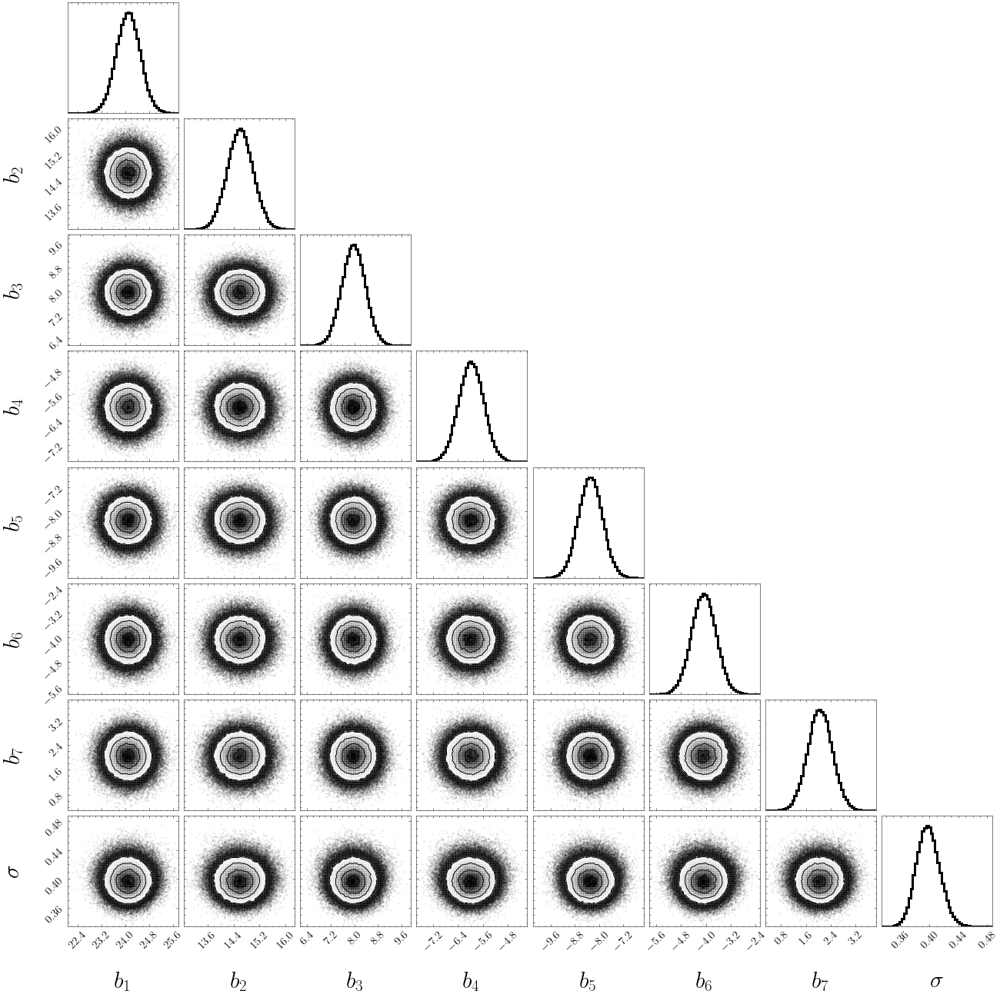

In [85]:
plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)

figure = corner.corner(res_gibbs,bins=50, dpi=300, hist_kwargs={"linewidth": 3},
                       labels=labels_MC, 
                    #    truths=np.append(beta,np.sqrt(sigma_squared)),
                    #    truth_color="r",
                       label_kwargs={"fontsize": 30},labelpad=0.1)



ndim=len(res_gibbs[0])

# Access the axes
axes = np.array(figure.axes).reshape((ndim, ndim))

ax=axes[2,0]           
ax.locator_params(nbins=3, axis='x')            
            
plt.show()



In [86]:
#Creating the transformed weights
samples_naive_space = np.array([np.dot(betaval,Vt_hat) + np.full(len(Vt_hat.T),1/len(Vt_hat.T)) for  betaval in res_gibbs.T[0:-1].T])

#Appending the \sigma values to the list
samples_naive_space_sigma= np.vstack((samples_naive_space.T,res_gibbs.T[-1])).T

labels_MC_Original=[f'$\omega_{i}$' for i in range(1, len(Vt_hat[0]) + 1)]
labels_MC_Original.append(f'$\sigma$')

In [87]:
np.shape(samples_naive_space)

(200000, 15)

Making a plot on the actual space of \omegas

In [88]:
# if centering_data:
#     #Creating the transformed weights
#     samples_naive_space = np.array([np.dot(betaval,Vt_hat) + np.full(len(Vt_hat.T),1/len(Vt_hat.T)) for  betaval in res_gibbs.T[0:-1].T])
    
#     #Appending the \sigma values to the list
#     samples_naive_space_sigma= np.vstack((samples_naive_space.T,res_gibbs.T[-1])).T

#     labels_MC_Original=[f'$\omega_{i}$' for i in range(1, len(Vt_hat[0]) + 1)]
#     labels_MC_Original.append(f'$\sigma$')


#     figure = corner.corner(samples_naive_space_sigma, bins=50, hist_kwargs={"linewidth": 3},labels=labels_MC_Original,label_kwargs={"fontsize": 20})
#     plt.show()




In [89]:
np.std(samples_naive_space_sigma.T[0])

0.005397137595939248

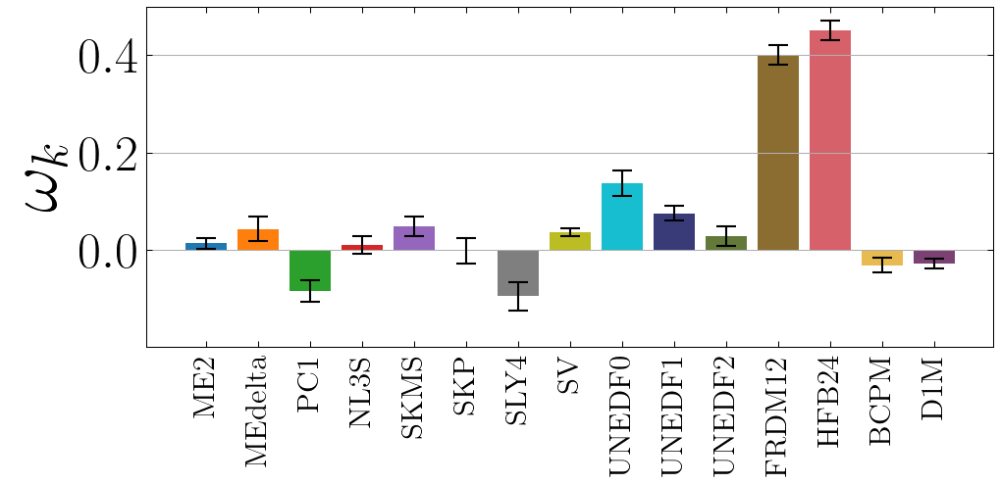

In [90]:
plt.rc("xtick", labelsize=20)
plt.rc("ytick", labelsize=20)
labels=list(models_output.keys())
plt.figure(figsize=(7, 3.5),dpi=150)
# y_max=0.6


i=0
for model in key_list:
        
        # ax.plot(filtered_models_output["N"], filtered_models_output[key_list[model_index]], 
        #         label = n_Labels[class_index], color=colors[class_index],alpha = alpha_models,linewidth=5)
        # plt.bar(model , np.mean(samples_naive_space_sigma.T[i]), color=colors[i])
        plt.bar(model , np.mean(samples_naive_space_sigma.T[i]),yerr=2*np.std(samples_naive_space_sigma.T[i]), color=colors[i],capsize=5)
        i=i+1

plt.minorticks_off()


# plt.xlabel('Models',fontsize=15)
plt.ylabel('$\omega_k$',fontsize=35)
plt.ylim(-0.2,0.5)
plt.yticks([0, 0.2, 0.4])
plt.xticks(fontsize=15,rotation='vertical')
plt.yticks(fontsize=25)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


## Constrained approach (simplex, MCMC plus sigma sampling)

In [91]:
bias0=np.full(len(model_predictions_train.T),1/len(model_predictions_train.T))
#This term will be added to the \omegas when obtaining them from the \betas to account for centering the data

In [92]:
# if centering_data:
#         omegas=np.dot(beta_2m,Vt_hat) + bias0
# else:
#         beta = np.insert(beta_2m, 0, b1_finder(beta_2m,Vt_hat))
        
#         omegas=np.dot(beta,Vt_hat) + bias0
    


In [93]:
def gibbs_sampler_simplex(y, X, iterations,prior_info,burn=10000,stepsize=0.001):
    if centering_data == False:
        print("Only available for centering data")
        return 
    #Make sure that "y" has the correct structure. If data is being centered, it should have the mean already substracted
#     b_mean_prior, b_mean_cov, nu0, sigma20  =  prior_info
    
    nu0, sigma20  =  prior_info   #Since our prior is only in \sigma, we are letting the \betas be free beyond the simplex
    
    #From A_First_Course_in_Bayesian_Statistical_Methods (page ~ 159), nu0 represent the effective prior samples and sigma2_0 represents the expected prior variance
    
    cov_matrix_step=np.diag(S_hat**2*stepsize**2)
    
    n = len(y)
    
    #Initializing the starting point at the average of all the models
    b_current = np.full(len(X),0)

    
    
    supermodel_current=X.T.dot(b_current)
    

    residuals_current = y - supermodel_current 

    
  
    log_likelihood_current= -np.sum(residuals_current**2)
    
    
    sigma2 = -log_likelihood_current/ len(residuals_current) 

    
    
    samples = []
    acceptance=0
    
    for i in range(burn):
        # Sample from the conditional posterior of bs given sigma2 and data       
        b_proposed =  np.random.multivariate_normal(b_current, cov_matrix_step)
        
        omegas_proposed=np.dot(b_proposed,Vt_hat) + bias0

        
            #Comment this line and uncomment the next if you want to check MCMC without the simplex  
        if  np.any(omegas_proposed < 0):
            pass
        
#         if 1>2:
#             pass
        
        else:
            
            supermodel_proposed=X.T.dot(b_proposed)
    
            residuals_proposed = y - supermodel_proposed 

            log_likelihood_proposed= -np.sum(residuals_proposed**2)
            
#           Calculate the acceptance probability
            acceptance_prob = min(1, np.exp(   (+log_likelihood_proposed - log_likelihood_current)/sigma2   ))

            # Accept or reject the proposal
            if np.random.uniform() < acceptance_prob:
                b_current = np.copy(b_proposed)
                log_likelihood_current=log_likelihood_proposed

        shape_post = (nu0 + n)/2.
        
        
#         scale_post = (nu0*sigma20 - log_likelihood_current/len(residuals_current))/2.0
        
        scale_post = (nu0*sigma20 - log_likelihood_current)/2.0

        sigma2 = 1 / np.random.default_rng().gamma(shape_post, 1/scale_post)
        
        
#         samples.append(np.append(b_current,np.sqrt(sigma2)))
        
        
  

    for i in range(iterations):
        # Sample from the conditional posterior of bs given sigma2 and data       
        b_proposed =  np.random.multivariate_normal(b_current, cov_matrix_step)
        
        omegas_proposed=np.dot(b_proposed,Vt_hat) + bias0

    #Comment this line and uncomment the next if you want to check MCMC without the simplex    
        if  np.any(omegas_proposed < 0):
            pass
        
#         if 1>2:
#             pass
        else:
            supermodel_proposed=X.T.dot(b_proposed)
    
            residuals_proposed = y - supermodel_proposed 

            log_likelihood_proposed= -np.sum(residuals_proposed**2)
            
#           Calculate the acceptance probability
            acceptance_prob = min(1, np.exp(   (+log_likelihood_proposed - log_likelihood_current)/sigma2   ))

            # Accept or reject the proposal
            if np.random.uniform() < acceptance_prob:
                b_current = np.copy(b_proposed)
                log_likelihood_current=log_likelihood_proposed
                acceptance=acceptance+1

        shape_post = (nu0 + n)/2.
        
        scale_post = (nu0*sigma20 - log_likelihood_current)/2.0

        sigma2 = 1 / np.random.default_rng().gamma(shape_post, 1/scale_post)
        
        
        samples.append(np.append(b_current,np.sqrt(sigma2)))        
        
        
        
        
        
        
    

    print("percentage accepted:", round(acceptance/iterations*100))
    return np.array(samples)

In [94]:
%%time
res_gibbs_simplex=gibbs_sampler_simplex(y, X, 1000000,[nu0_chosen, sigma20_chosen],burn=300000,stepsize=0.00045)

percentage accepted: 18
CPU times: user 1min 29s, sys: 765 ms, total: 1min 29s
Wall time: 1min 29s


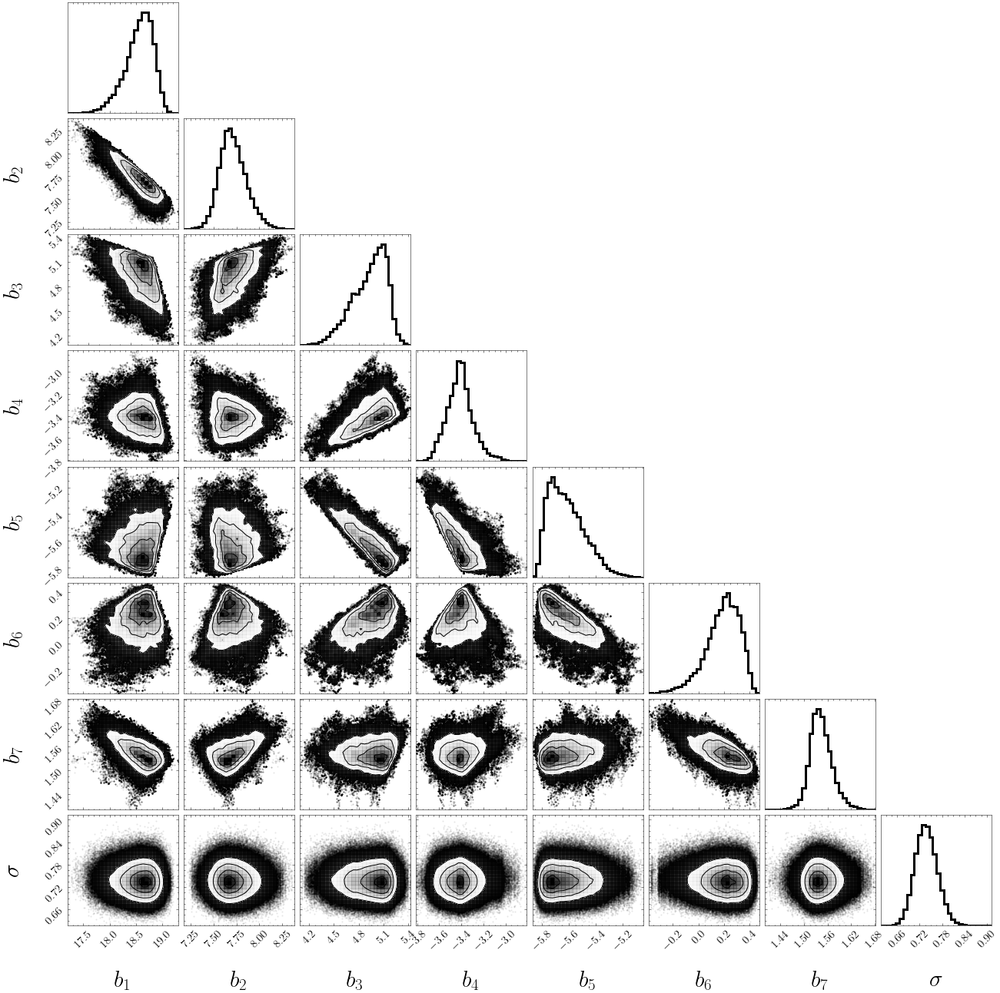

In [95]:
plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)

figure = corner.corner(res_gibbs_simplex,bins=30, dpi=300, hist_kwargs={"linewidth": 3},
                       labels=labels_MC, 
                    #    truths=np.append(beta,np.sqrt(sigma_squared)),
                    #    truth_color="r",
                       label_kwargs={"fontsize": 30},labelpad=0.1)



ndim=len(res_gibbs[0])

# Access the axes
axes = np.array(figure.axes).reshape((ndim, ndim))

ax=axes[2,0]           
ax.locator_params(nbins=3, axis='x')            
            
plt.show()



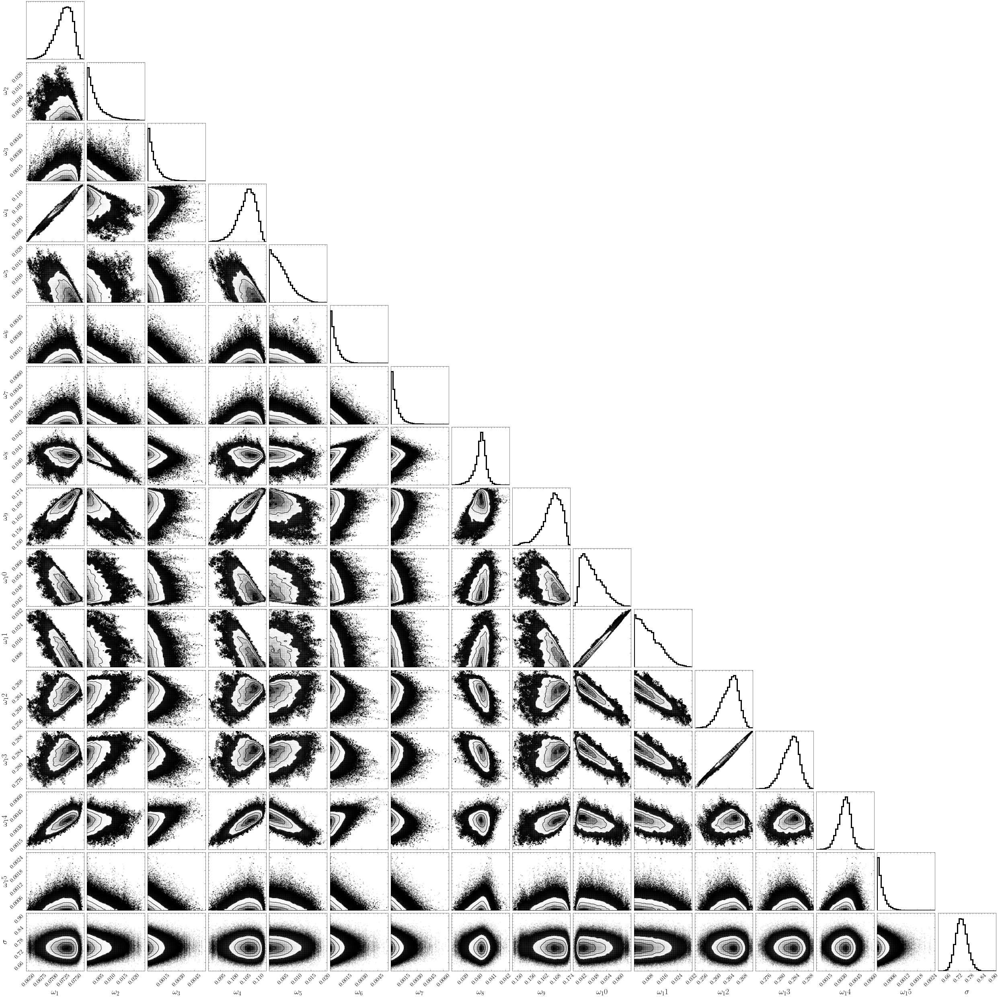

In [96]:
#Creating the transformed weights
samples_naive_space_simplex = np.array([np.dot(betaval,Vt_hat) + np.full(len(Vt_hat.T),1/len(Vt_hat.T)) for  betaval in res_gibbs_simplex.T[0:-1].T])

#Appending the \sigma values to the list
samples_naive_space_simplex= np.vstack((samples_naive_space_simplex.T,res_gibbs_simplex.T[-1])).T

labels_MCMC_Original=[f'$\omega_{i}$' for i in range(1, len(Vt_hat[0]) + 1)]
labels_MCMC_Original.append(f'$\sigma$')

figure = corner.corner(samples_naive_space_simplex, bins=30, hist_kwargs={"linewidth": 3},labels=labels_MCMC_Original,label_kwargs={"fontsize": 20})
plt.show()


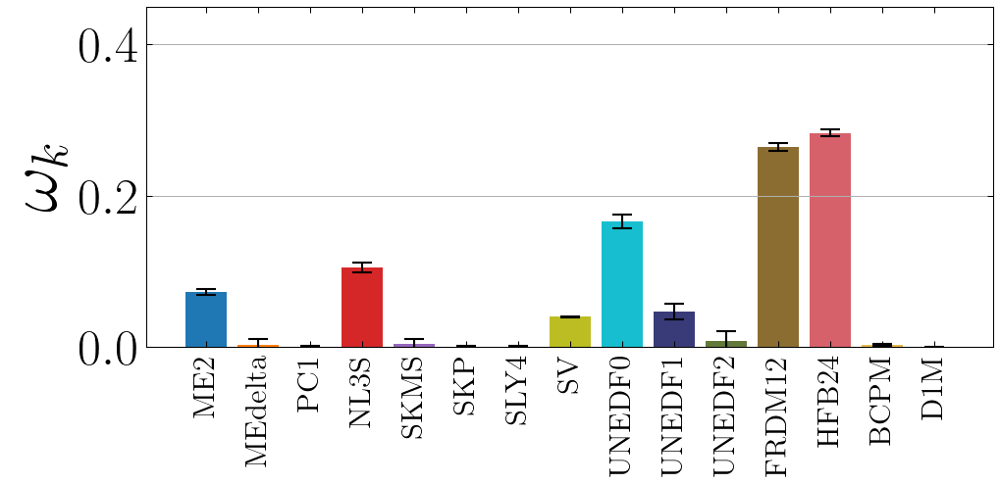

In [97]:
plt.rc("xtick", labelsize=20)
plt.rc("ytick", labelsize=20)
labels=list(models_output.keys())
plt.figure(figsize=(7, 3.5),dpi=150)
# y_max=0.6


i=0
for model in key_list:
        
        # ax.plot(filtered_models_output["N"], filtered_models_output[key_list[model_index]], 
        #         label = n_Labels[class_index], color=colors[class_index],alpha = alpha_models,linewidth=5)
        # plt.bar(model , np.mean(samples_naive_space_sigma.T[i]), color=colors[i])
        plt.bar(model , 
                np.mean(samples_naive_space_simplex.T[i]),yerr=2*np.std(samples_naive_space_simplex.T[i]),
                color=colors[i],capsize=5)
        i=i+1




# plt.xlabel('Models',fontsize=15)
# plt.title("c)",fontsize=25)
plt.minorticks_off()
plt.ylabel('$\omega_k$',fontsize=35)
plt.ylim(0,0.45)
plt.xticks(fontsize=15,rotation='vertical')
plt.yticks(fontsize=25)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


## We now follow the same sampling (unconstrained) but using the full space of models (naive BMM)

In [98]:
X_naive=np.copy(model_predictions_train).T
X_full_naive=np.copy(model_predictions).T
X_test_naive=np.copy(model_predictions_test).T
X_validation_naive=np.copy(model_predictions_validation).T

y_naive=np.copy(models_output_train["truth"].tolist())
y_naive_test=np.copy(models_output_test["truth"].tolist())
y_naive_validation=np.copy(models_output_validation["truth"].tolist())
y_naive_full=np.copy(models_output["truth"].tolist())



In [99]:
#Same process on the naive space of full models    

# 1) Find the least square solution for the training part
X_T_X_naive=X_naive.dot(X_naive.T)
X_T_X_inv_naive = np.linalg.inv(X_T_X_naive)
beta_naive = X_T_X_inv_naive.dot(X_naive).dot(y_naive)
supermodel_naive=X_naive.T.dot(beta_naive)

#1.5) Construct the super model across the entire range and the test range
supermodel_train_naive=np.copy(supermodel_naive)
supermodel_full_naive=X_full_naive.T.dot(beta_naive)
supermodel_test_naive=X_test_naive.T.dot(beta_naive)
supermodel_validation_naive=X_validation_naive.T.dot(beta_naive)


# 2) Construct the covariance matrix
residuals_naive = y_naive - supermodel_naive
sigma_squared_naive = np.sum(residuals_naive**2) / len(residuals_naive) 
cov_matrix_naive = sigma_squared_naive * X_T_X_inv_naive

# 3) Make a corner plot
samples_naive = np.random.multivariate_normal(beta_naive, cov_matrix_naive, size=50000)


### Uncomment the next cell to make the corner plot (might take a couple of minutes)

In [100]:
# figure = corner.corner(samples_naive, bins=50, dpi=300, hist_kwargs={"linewidth": 3},labels=[f'$w_{i}$' for i in range(1,1+len(beta_naive))], truths=beta_naive,label_kwargs={"fontsize": 30})
# # figure = corner.corner(samples_naive_space)

# plt.show()

### Making a correlation matrix plot of the weights obtained by the naive BMM

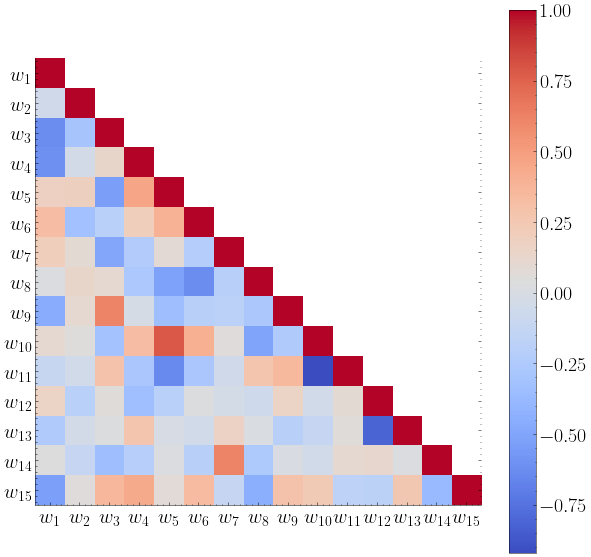

In [101]:
correlation_matrix_naive = cov_matrix_naive / np.sqrt(np.outer(np.diag(cov_matrix_naive), np.diag(cov_matrix_naive)))

mask = np.triu_indices_from(correlation_matrix_naive, k=1)
correlation_matrix_naive[mask] = np.nan

fig, ax = plt.subplots(figsize=(10, 10))

# Create the heatmap

# cax = ax.matshow(correlation_matrix_naive, cmap='coolwarm', vmin=0.99925, vmax=1)
cax = ax.matshow(correlation_matrix_naive, cmap='coolwarm')
# Add color bar
plt.colorbar(cax)

# Set axis labels
ax.set_xticks(np.arange(len(correlation_matrix_naive)))
ax.set_yticks(np.arange(len(correlation_matrix_naive)))

plot_labels=[f"$w_{{{i}}}$" for i in range(1, len(correlation_matrix_naive) + 1)]
ax.set_xticklabels(plot_labels)
ax.set_yticklabels(plot_labels)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.xaxis.tick_bottom()

# Show the plot
plt.show()

### Making a correlation plot in the space of the bs. For the unconstrained case it should be just a boring diagonal matrix

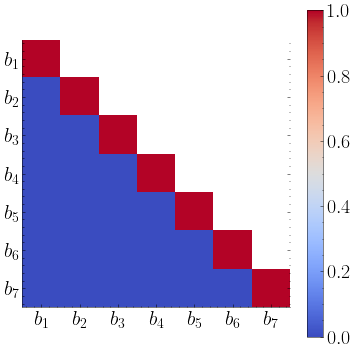

In [102]:
correlation_matrix = cov_matrix / np.sqrt(np.outer(np.diag(cov_matrix), np.diag(cov_matrix)))

mask = np.triu_indices_from(correlation_matrix, k=1)
correlation_matrix[mask] = np.nan

fig, ax = plt.subplots(figsize=(6, 6))

# Create the heatmap

# cax = ax.matshow(correlation_matrix, cmap='coolwarm', vmin=-1, vmax=1)
cax = ax.matshow(correlation_matrix, cmap='coolwarm')
# Add color bar
plt.colorbar(cax)

# Set axis labels
ax.set_xticks(np.arange(len(correlation_matrix)))
ax.set_yticks(np.arange(len(correlation_matrix)))

plot_labels=[f"$b_{i}$" for i in range(1, len(correlation_matrix) + 1)]

ax.set_xticklabels(plot_labels)
ax.set_yticklabels(plot_labels)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.xaxis.tick_bottom()

# Show the plot
plt.show()

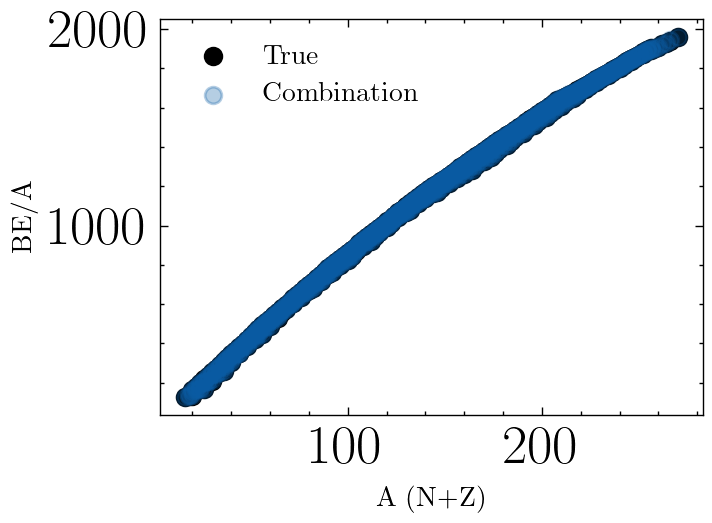

In [103]:
fig = plt.subplots(dpi=200)

plt.scatter(x = models_output["A"], y = models_output['truth'], label = str("True"), color='k')




plt.scatter(x = models_output["A"], y = supermodel_full, label = str("Combination"), alpha = 0.3)


plt.legend()

plt.xlabel('A (N+Z)')

plt.ylabel('BE/A')

plt.show()

### Making a plot of the calibrated models on the isotope of interest

### First the BMM with PCs (space of bs)

Choose next cell if you want to use the samples from unconstrained and estimated sigma

In [104]:
# #Restricting the super model to plot on the selected isotope 
# X_full_filtered=[]

# for i in range(len(X_full)):
#     X_full_filtered.append(X_full[i][filtered_models_output.index])
# X_full_filtered=np.array(X_full_filtered)

# rng = np.random.default_rng()


# #Chose this for when the sampling was done without constraint
# ####################
# theta_rand = rng.choice(samples, (50000), replace=False)
# appropiate_sigma=sigma_squared


# rndm_m = []

# for i in range(len(theta_rand)):
#     if centering_data:
#         yvals_rand= X_full_filtered.T.dot(np.insert(theta_rand[i], 0, 1))
#     else:
#         yvals_rand= X_full_filtered.T.dot(theta_rand[i])

#     rndm_m.append(yvals_rand +
#                    np.random.multivariate_normal(np.full(
#                        len(yvals_rand)
#                        ,0), np.diag(1.0 * np.full(len(yvals_rand),1.0 * appropiate_sigma ) )))   
    




Choose next cell if you want to use the GIBBS samples from unconstrained

In [105]:

#Restricting the super model to plot on the selected isotope 
X_full_filtered=[]

for i in range(len(X_full)):
    X_full_filtered.append(X_full[i][filtered_models_output.index])
X_full_filtered=np.array(X_full_filtered)

rng = np.random.default_rng()


###################
theta_rand = rng.choice(res_gibbs, min((200000),len(res_gibbs)), replace=False)
# appropiate_sigma=sigma_squared


rndm_m = []

for i in range(len(theta_rand)):
    if centering_data:
        yvals_rand= X_full_filtered.T.dot(np.insert(theta_rand[i][0:-1], 0, 1))
    else:
        yvals_rand= X_full_filtered.T.dot(theta_rand[i][0:-1])

    rndm_m.append(yvals_rand +
                   np.random.multivariate_normal(np.full(
                       len(yvals_rand)
                       ,0), np.diag(1.0 * np.full(len(yvals_rand),1.0 * theta_rand[i][-1]**2 ) )))   

In [106]:


###################
theta_rand = rng.choice(res_gibbs_simplex, min((200000),len(res_gibbs_simplex)), replace=False)
# appropiate_sigma=sigma_squared


rndm_m_simplex = []

for i in range(len(theta_rand)):
    if centering_data:
        yvals_rand= X_full_filtered.T.dot(np.insert(theta_rand[i][0:-1], 0, 1))
    else:
        yvals_rand= X_full_filtered.T.dot(theta_rand[i][0:-1])

    rndm_m_simplex.append(yvals_rand +
                   np.random.multivariate_normal(np.full(
                       len(yvals_rand)
                       ,0), np.diag(1.0 * np.full(len(yvals_rand),1.0 * theta_rand[i][-1]**2 ) )))   

In [107]:
# if computing_MCMC:
#     theta_rand_MCMC = rng.choice(met_res[0], (50000), replace=False)
#     appropiate_sigma_MCMC=emp_sigma**2

#     rndm_m_MCMC = []

#     for i in range(len(theta_rand_MCMC)):
#         if centering_data:
#             yvals_rand= X_full_filtered.T.dot(np.insert(theta_rand_MCMC[i], 0, 1))
#         else:
#             yvals_rand= X_full_filtered.T.dot(theta_rand_MCMC[i])

#         rndm_m_MCMC.append(yvals_rand +
#                     np.random.multivariate_normal(np.full(
#                         len(yvals_rand)
#                         ,0), np.diag(1.0 * np.full(len(yvals_rand),1.0 * appropiate_sigma_MCMC ) )))   

### Second (if we want) the BMM with all models (space of ws)

In [108]:
# `#Restricting the full naive model to the isotopes we want
# model_predictions_filtered=[]

# for i in range(len(model_predictions.T)):
#     model_predictions_filtered.append(model_predictions.T[i][filtered_models_output.index])
# model_predictions_filtered=np.array(model_predictions_filtered)

# rndm_m_naive=[]

# for i in range(len(samples_naive)):

#     yvals_rand= model_predictions_filtered.T.dot(samples_naive[i])

#     rndm_m_naive.append( ( yvals_rand +
#                    np.random.multivariate_normal(np.full(
#                        len(yvals_rand)
#                        ,0), np.diag(1.0 * np.full(len(yvals_rand),1.0 * sigma_squared_naive ) )))/filtered_models_output["A"]      )   `

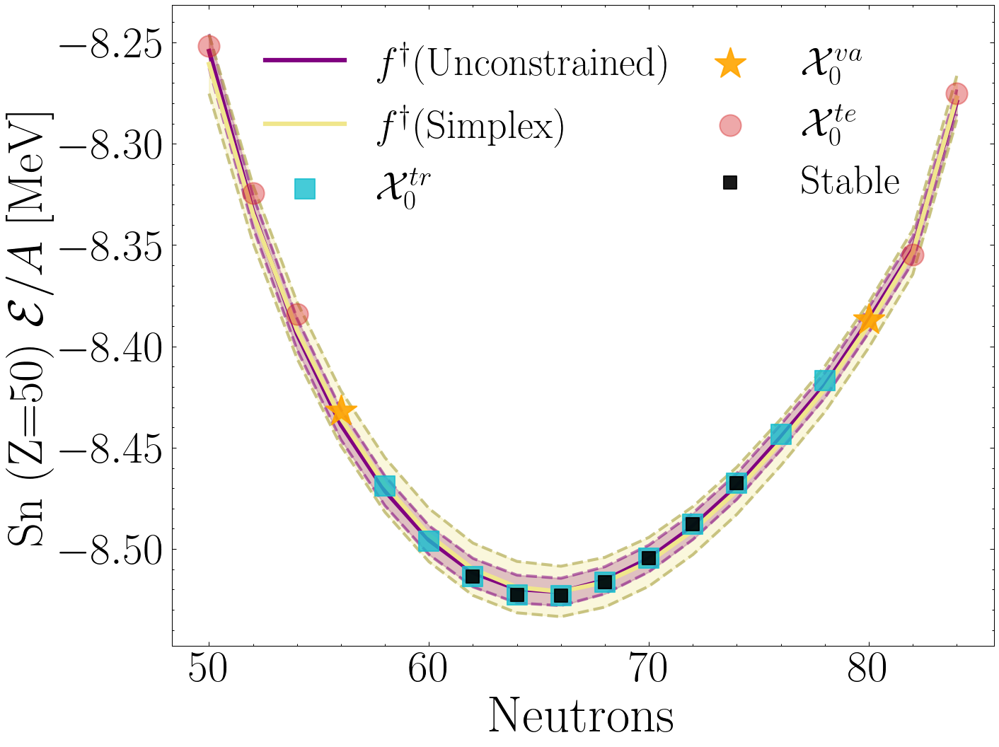

In [110]:
plt.rc("xtick", labelsize=30)
plt.rc("ytick", labelsize=30)

fig, ax = plt.subplots(figsize=(10,8), dpi=150)
# fig, ax = plt.subplots(dpi=200)

# alpha_models=0.2


#Select what to plot, either the super model or the naive version


# name="BMM-PC"
samples_plot=np.copy(rndm_m)



# name="BMM-0"
# samples_plot=np.copy(rndm_m_naive)











mean = -np.mean(samples_plot,axis=0)/filtered_models_output["A"]
upper = -(np.percentile(samples_plot, 97.5, axis=0))/filtered_models_output["A"]

lower = -(np.percentile(samples_plot, 2.5, axis=0))/filtered_models_output["A"]

plt.plot(filtered_models_output["N"], mean, color="purple", label='$f^\dagger$(Unconstrained)',linewidth=3)

plt.plot(filtered_models_output["N"], lower, color="purple",linestyle="dashed",linewidth=2,alpha=0.5)
plt.plot(filtered_models_output["N"], upper, color="purple",linestyle="dashed",linewidth=2,alpha=0.5)

plt.fill_between(filtered_models_output["N"], lower, upper, color="purple",alpha=0.3)





color_simplex= "khaki"

samples_plot=np.copy(rndm_m_simplex)

mean = -np.mean(samples_plot,axis=0)/filtered_models_output["A"]
upper = -(np.percentile(samples_plot, 97.5, axis=0))/filtered_models_output["A"]

lower = -(np.percentile(samples_plot, 2.5, axis=0))/filtered_models_output["A"]

plt.plot(filtered_models_output["N"], mean, color=color_simplex, label='$f^\dagger$(Simplex)',linewidth=3)

# plt.plot(filtered_models_output["N"], lower, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)
# plt.plot(filtered_models_output["N"], upper, color=color_simplex,linestyle="dashed",linewidth=3,alpha=0.8)


plt.plot(filtered_models_output["N"], lower, color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.8)
plt.plot(filtered_models_output["N"], upper, color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.8)

plt.fill_between(filtered_models_output["N"], lower, upper, color=color_simplex,alpha=0.3)









size_multiplyier=6

ax.scatter(x = filtered_models_output_train["N"], y = -filtered_models_output_train['truth']/filtered_models_output_train["A"], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_trainig,color=color_trainig,s=size_trainig*size_multiplyier,marker=marker_trainig,zorder=2)

ax.scatter(x = filtered_models_output_validation["N"], y = -filtered_models_output_validation['truth']/filtered_models_output_validation["A"], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=size_validation*size_multiplyier,marker=marker_validation,zorder=2)

ax.scatter(x = filtered_models_output_test["N"], y = -filtered_models_output_test['truth']/filtered_models_output_test["A"], label = "$\mathcal{X}_0^{te}$", alpha = alpha_testing,color=color_testing,s=size_testing*size_multiplyier,marker=marker_testing,zorder=2)

ax.scatter(x = filtered_models_output_stable["N"], y =- filtered_models_output_stable['truth']/filtered_models_output_stable["A"], label = "Stable", alpha = 0.9,color='k',s=80,marker="s",zorder=2)





plt.xlabel("Neutrons",fontsize=35)
plt.ylabel("Sn (Z=50) $ {\cal E}/A$ [MeV]",fontsize=33)
# plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
 
plt.legend(fontsize=27,markerscale=1,ncol=2,columnspacing=0.5)

plt.show()

In [111]:
# #Some colors that Pablo likes:
colors = [
    "#1f77b4", # Vivid blue
    "#ff7f0e", # Bright orange
    "#2ca02c", # Rich green
    "#d62728", # Strong red
    "#9467bd", # Deep purple
    # "#8c564b", # Brownish-pink
    "#e377c2", # Pink
    "#7f7f7f", # Medium gray
    "#bcbd22", # Lime green
    "#17becf", # Cyan
    "#393b79", # Dark blue
    "#637939", # Olive green
    "#8c6d31", # Bronze
    # "#843c39", # Dark red
    # "#ad494a", # Reddish brown
    "#d6616b", # Soft red
    "#e7ba52", # Golden yellow
    "#7b4173", # Dark purple
    "#a55194", # Mauve
    "#ce6dbd", # Light purple
]

# Computing coverage intervals and RMSE performance

Unconstrained model:

In [112]:
%%time
np.random.seed(142857)

total_samples=5000

rndm_full_train = []
rndm_full_val = []
rndm_full_test = []


rndm_full_train_noiseless = []
rndm_full_val_noiseless = []
rndm_full_test_noiseless = []

theta_rand_selected=rng.choice(res_gibbs, min((total_samples),len(res_gibbs)), replace=False)


for i in tqdm(range(len(theta_rand_selected))):

    if centering_data:
        yvals_rand_train= X_train.T.dot(np.insert(theta_rand_selected[i][0:-1], 0, 1))
        yvals_rand_val= X_validation.T.dot(np.insert(theta_rand_selected[i][0:-1], 0, 1))
        yvals_rand_test= X_test.T.dot(np.insert(theta_rand_selected[i][0:-1], 0, 1))
    else:
        yvals_rand_train= X_train.T.dot(theta_rand_selected[i][0:-1])
        yvals_rand_val= X_validation.T.dot(theta_rand_selected[i][0:-1])
        yvals_rand_test= X_test.T.dot(theta_rand_selected[i][0:-1])

        
        
    #Noiseless round (for calculating RMSE)
    rndm_full_train_noiseless.append(yvals_rand_train) 

    rndm_full_val_noiseless.append(yvals_rand_val) 
    rndm_full_test_noiseless.append(yvals_rand_test)           
        

        
        
        
        
        
    #Noise round       
    rndm_full_train.append(yvals_rand_train +
                   np.random.multivariate_normal(np.full(
                       len(yvals_rand_train)
                       ,0), np.diag(1.0 * np.full(len(yvals_rand_train),1.0 * theta_rand_selected[i][-1]**2 ) ))) 

    rndm_full_val.append(yvals_rand_val +
                np.random.multivariate_normal(np.full(
                    len(yvals_rand_val)
                    ,0), np.diag(1.0 * np.full(len(yvals_rand_val),1.0 * theta_rand_selected[i][-1]**2 ) ))) 
    rndm_full_test.append(yvals_rand_test +
                np.random.multivariate_normal(np.full(
                    len(yvals_rand_test)
                    ,0), np.diag(1.0 * np.full(len(yvals_rand_test),1.0 * theta_rand_selected[i][-1]**2 ) )))   


rndm_full_train_noiseless=np.array(rndm_full_train_noiseless)
rndm_full_val_noiseless=np.array(rndm_full_val_noiseless)
rndm_full_test_noiseless=np.array(rndm_full_test_noiseless)    
    
    
rndm_full_train=np.array(rndm_full_train)
rndm_full_val=np.array(rndm_full_val)
rndm_full_test=np.array(rndm_full_test)



    

100%|███████████████████████████████████████████████████████████████████████████████| 5000/5000 [03:21<00:00, 24.78it/s]

CPU times: user 26min 3s, sys: 41min 10s, total: 1h 7min 13s
Wall time: 3min 21s


Computing the RMSE performance of the model

In [113]:
super_model_resituals_train_gibbs=np.mean(rndm_full_train_noiseless,axis=0)  -  models_output_train['truth'].tolist()
super_model_residuals_validation_gibbs= np.mean(rndm_full_val_noiseless,axis=0)-models_output_validation['truth'].tolist()
super_model_residuals_test_gibbs = np.mean(rndm_full_test_noiseless,axis=0)-models_output_test['truth'].tolist()

sigma_train_gibbs=np.sqrt(np.sum(super_model_resituals_train_gibbs**2) / len(super_model_resituals_train_gibbs) )
sigma_validation_gibbs=np.sqrt(np.sum(super_model_residuals_validation_gibbs**2) / len(super_model_residuals_validation_gibbs) )
sigma_test_gibbs=np.sqrt(np.sum(super_model_residuals_test_gibbs**2) / len(super_model_residuals_test_gibbs) )


sigma_all_gibbs=np.sqrt((sigma_train_gibbs**2*len(super_model_resituals_train_gibbs)+
        sigma_validation_gibbs**2*len(super_model_residuals_validation_gibbs)+
        sigma_test_gibbs**2*len(super_model_residuals_test_gibbs))/(len(super_model_resituals_train_gibbs)+
                                                                   len(super_model_residuals_validation_gibbs)+
                                                                   len(super_model_residuals_test_gibbs)))


In [114]:
sigma_train_gibbs,sigma_validation_gibbs,sigma_test_gibbs,sigma_all_gibbs

(0.37781176550787826,
 0.4585165628029343,
 0.47499215192713196,
 0.4293647165470596)

Simplex model:


In [115]:
%%time
np.random.seed(142857)

total_samples=5000

rndm_full_train_simplex = []
rndm_full_val_simplex = []
rndm_full_test_simplex = []


rndm_full_train_noiseless_simplex = []
rndm_full_val_noiseless_simplex = []
rndm_full_test_noiseless_simplex = []

theta_rand_selected=rng.choice(res_gibbs_simplex, min((total_samples),len(res_gibbs_simplex)), replace=False)


for i in tqdm(range(len(theta_rand_selected))):

    if centering_data:
        yvals_rand_train= X_train.T.dot(np.insert(theta_rand_selected[i][0:-1], 0, 1))
        yvals_rand_val= X_validation.T.dot(np.insert(theta_rand_selected[i][0:-1], 0, 1))
        yvals_rand_test= X_test.T.dot(np.insert(theta_rand_selected[i][0:-1], 0, 1))
    else:
        yvals_rand_train= X_train.T.dot(theta_rand_selected[i][0:-1])
        yvals_rand_val= X_validation.T.dot(theta_rand_selected[i][0:-1])
        yvals_rand_test= X_test.T.dot(theta_rand_selected[i][0:-1])

        
        
    #Noiseless round (for calculating RMSE)
    rndm_full_train_noiseless_simplex.append(yvals_rand_train) 

    rndm_full_val_noiseless_simplex.append(yvals_rand_val) 
    rndm_full_test_noiseless_simplex.append(yvals_rand_test)           
        

        
        
        
        
        
    #Noise round       
    rndm_full_train_simplex.append(yvals_rand_train +
                   np.random.multivariate_normal(np.full(
                       len(yvals_rand_train)
                       ,0), np.diag(1.0 * np.full(len(yvals_rand_train),1.0 * theta_rand_selected[i][-1]**2 ) ))) 

    rndm_full_val_simplex.append(yvals_rand_val +
                np.random.multivariate_normal(np.full(
                    len(yvals_rand_val)
                    ,0), np.diag(1.0 * np.full(len(yvals_rand_val),1.0 * theta_rand_selected[i][-1]**2 ) ))) 
    rndm_full_test_simplex.append(yvals_rand_test +
                np.random.multivariate_normal(np.full(
                    len(yvals_rand_test)
                    ,0), np.diag(1.0 * np.full(len(yvals_rand_test),1.0 * theta_rand_selected[i][-1]**2 ) )))   


rndm_full_train_noiseless_simplex=np.array(rndm_full_train_noiseless_simplex)
rndm_full_val_noiseless_simplex=np.array(rndm_full_val_noiseless_simplex)
rndm_full_test_noiseless_simplex=np.array(rndm_full_test_noiseless_simplex)    
    
    
rndm_full_train_simplex=np.array(rndm_full_train_simplex)
rndm_full_val_simplex=np.array(rndm_full_val_simplex)
rndm_full_test_simplex=np.array(rndm_full_test_simplex)



    

100%|███████████████████████████████████████████████████████████████████████████████| 5000/5000 [04:25<00:00, 18.84it/s]


CPU times: user 32min 59s, sys: 55min 26s, total: 1h 28min 26s
Wall time: 4min 25s


In [116]:
super_model_resituals_train_simplex=np.mean(rndm_full_train_noiseless_simplex,axis=0)  -  models_output_train['truth'].tolist()
super_model_residuals_validation_simplex= np.mean(rndm_full_val_noiseless_simplex,axis=0)-models_output_validation['truth'].tolist()
super_model_residuals_test_simplex = np.mean(rndm_full_test_noiseless_simplex,axis=0)-models_output_test['truth'].tolist()

sigma_train_simplex=np.sqrt(np.sum(super_model_resituals_train_simplex**2) / len(super_model_resituals_train_simplex) )
sigma_validation_simplex=np.sqrt(np.sum(super_model_residuals_validation_simplex**2) / len(super_model_residuals_validation_simplex) )
sigma_test_simplex=np.sqrt(np.sum(super_model_residuals_test_simplex**2) / len(super_model_residuals_test_simplex) )


sigma_all_simplex=np.sqrt((sigma_train_simplex**2*len(super_model_resituals_train_simplex)+
        sigma_validation_simplex**2*len(super_model_residuals_validation_simplex)+
        sigma_test_simplex**2*len(super_model_residuals_test_simplex))/(len(super_model_resituals_train_simplex)+
                                                                   len(super_model_residuals_validation_simplex)+
                                                                   len(super_model_residuals_test_simplex)))


In [117]:
sigma_train_simplex,sigma_validation_simplex,sigma_test_simplex,sigma_all_simplex

(0.7357701301575951,
 0.6865921052238492,
 0.7114747552317044,
 0.7204441052484268)

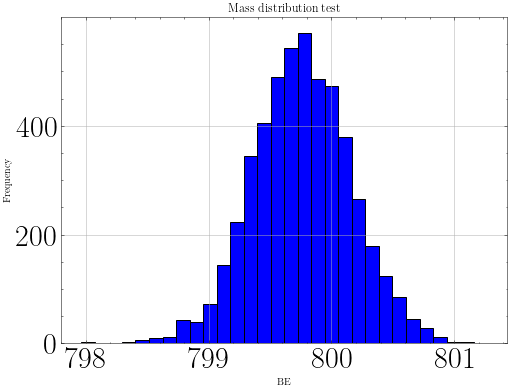

In [118]:
plt.figure(figsize=(8, 6))
plt.hist(rndm_full_train.T[100], bins=30, color='blue', edgecolor='black')  
plt.title('Mass distribution test')  
plt.xlabel('BE')  # Label the x-axis
plt.ylabel('Frequency')  # Label the y-axis
plt.grid(True)  # Optional: add grid lines for better readability
plt.show() 

In [120]:
# UNCONSTRAINED RUN Define percentiles to create intervals (10% to 100%)
percentiles = np.arange(0, 101, 5)


data_total=len(rndm_full_train.T)
data_true=models_output_train["truth"].tolist()
M_evals=len(rndm_full_train)


coverage_train = []

for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_train.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_train.append(count_covered / data_total * 100)
    
    
    
coverage_validation = []
data_total=len(rndm_full_val.T)
data_true=models_output_validation["truth"].tolist()
M_evals=len(rndm_full_val)


for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_val.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_validation.append(count_covered / data_total * 100)

    
coverage_test = []
data_total=len(rndm_full_test.T)
data_true=models_output_test["truth"].tolist()
M_evals=len(rndm_full_test)
for p in percentiles:
    count_covered = 0
    for i in range(data_total):
        # Sort model evaluations for the i-th data point
        sorted_evals = np.sort(rndm_full_test.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx = int((0.5 - p / 200) * M_evals)
        upper_idx = int((0.5 + p / 200) * M_evals) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals[lower_idx] <= data_true[i] <= sorted_evals[upper_idx]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_test.append(count_covered / data_total * 100)



In [121]:
# SIMPLEX RUN Define percentiles to create intervals (10% to 100%)
percentiles = np.arange(0, 101, 5)


data_total_simplex=len(rndm_full_train_simplex.T)
data_true=models_output_train["truth"].tolist()
M_evals_simplex=len(rndm_full_train_simplex)


coverage_train_simplex = []

for p in percentiles:
    count_covered = 0
    for i in range(data_total_simplex):
        # Sort model evaluations for the i-th data point
        sorted_evals_simplex = np.sort(rndm_full_train_simplex.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx_simplex = int((0.5 - p / 200) * M_evals_simplex)
        upper_idx_simplex = int((0.5 + p / 200) * M_evals_simplex) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals_simplex[lower_idx_simplex] <= data_true[i] <= sorted_evals_simplex[upper_idx_simplex]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_train_simplex.append(count_covered / data_total_simplex * 100)
    
    
    
coverage_validation_simplex = []
data_total_simplex=len(rndm_full_val_simplex.T)
data_true=models_output_validation["truth"].tolist()
M_evals_simplex=len(rndm_full_val_simplex)


for p in percentiles:
    count_covered = 0
    for i in range(data_total_simplex):
        # Sort model evaluations for the i-th data point
        sorted_evals_simplex = np.sort(rndm_full_val_simplex.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx_simplex = int((0.5 - p / 200) * M_evals_simplex)
        upper_idx_simplex = int((0.5 + p / 200) * M_evals_simplex) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals_simplex[lower_idx_simplex] <= data_true[i] <= sorted_evals_simplex[upper_idx_simplex]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_validation_simplex.append(count_covered / data_total_simplex * 100)

    
coverage_test_simplex = []
data_total_simplex=len(rndm_full_test_simplex.T)
data_true=models_output_test["truth"].tolist()
M_evals_simplex=len(rndm_full_test_simplex)
for p in percentiles:
    count_covered = 0
    for i in range(data_total_simplex):
        # Sort model evaluations for the i-th data point
        sorted_evals_simplex = np.sort(rndm_full_test_simplex.T[i])
        
        # Find indices for lower and upper bounds of the credible interval
        lower_idx_simplex = int((0.5 - p / 200) * M_evals_simplex)
        upper_idx_simplex = int((0.5 + p / 200) * M_evals_simplex) - 1  # Adjusted to avoid out-of-bounds
        
        # Check if the true value y[i] is within this interval
        if sorted_evals_simplex[lower_idx_simplex] <= data_true[i] <= sorted_evals_simplex[upper_idx_simplex]:
            count_covered += 1
            
    # Calculate and store the coverage percentage
    coverage_test_simplex.append(count_covered / data_total_simplex * 100)



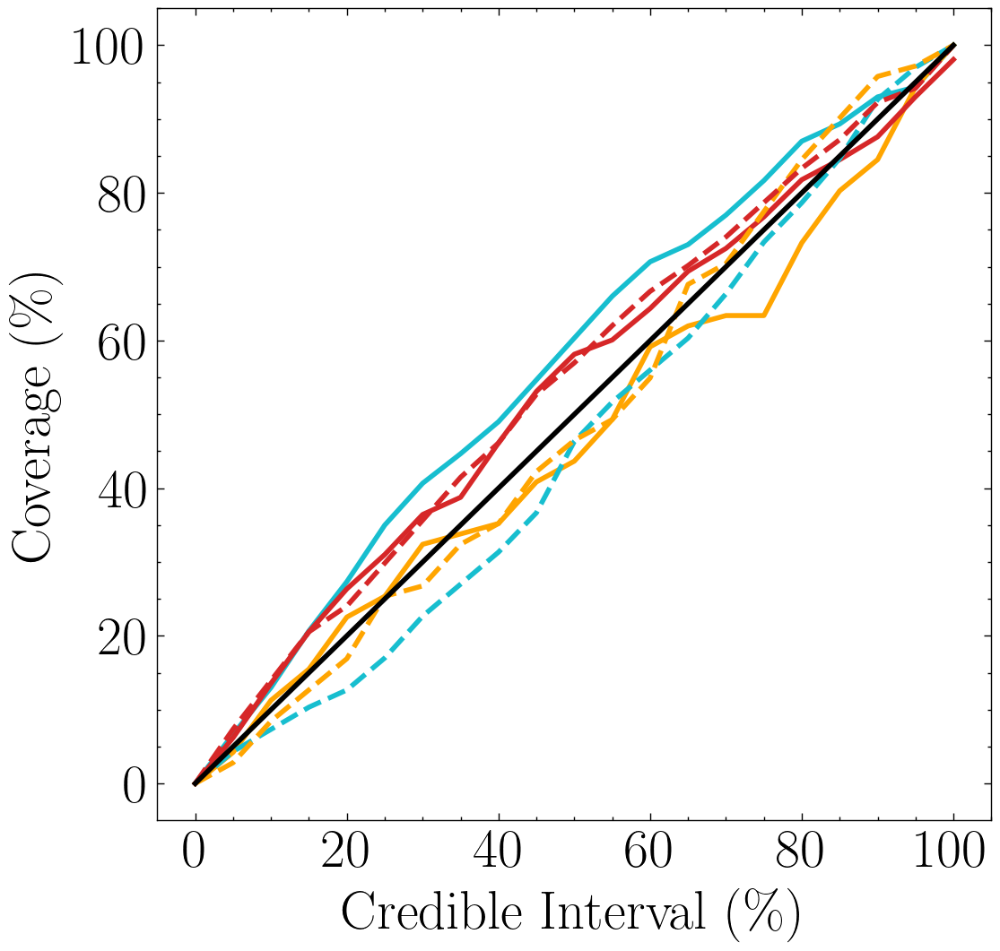

In [122]:
plt.rc("xtick", labelsize=22)
plt.rc("ytick", labelsize=22)
# Plotting the results
plt.figure(figsize=(6, 6),dpi=200)

width_line=2

plt.plot(percentiles, coverage_train, label='Training',color=color_trainig,linewidth=width_line)
plt.plot(percentiles, coverage_validation, label='Validation',color=color_validation,linewidth=width_line)
plt.plot(percentiles, coverage_test, label='Test',color=color_testing,linewidth=width_line)


plt.plot(percentiles, coverage_train_simplex,linestyle='dashed', label='Training',color=color_trainig,linewidth=width_line)
plt.plot(percentiles, coverage_validation_simplex, linestyle='dashed',label='Validation',color=color_validation,linewidth=width_line)
plt.plot(percentiles, coverage_test_simplex,linestyle='dashed', label='Test',color=color_testing,linewidth=width_line)



plt.plot(percentiles, percentiles,label='reference',color='k',linewidth=width_line)
plt.xlabel('Credible Interval (\%)',fontsize=22)
plt.ylabel('Coverage (\%)',fontsize=22)

plt.xticks(ticks=[0, 20,40,60,80,100])

# plt.title('Coverage of Observed Data Points by Credible Intervals')
# plt.grid(True)
# plt.legend(fontsize=15)
plt.show()


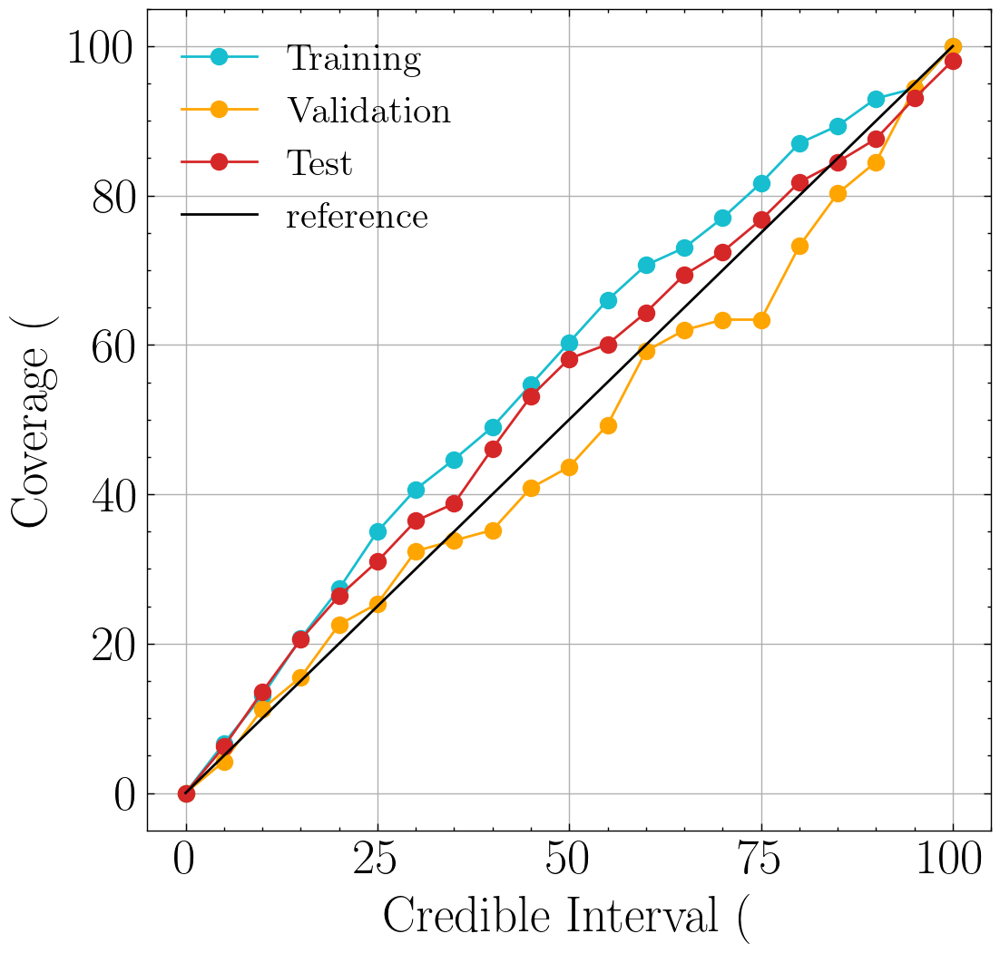

In [123]:
plt.rc("xtick", labelsize=20)
plt.rc("ytick", labelsize=20)
# Plotting the results
plt.figure(figsize=(6, 6),dpi=200)
plt.plot(percentiles, coverage_train, marker='o',label='Training',color=color_trainig)
plt.plot(percentiles, coverage_validation, marker='o',label='Validation',color=color_validation)
plt.plot(percentiles, coverage_test, marker='o',label='Test',color=color_testing)


plt.plot(percentiles, percentiles,label='reference',color='k')
plt.xlabel('Credible Interval (%)',fontsize=20)
plt.ylabel('Coverage (%)',fontsize=20)
# plt.title('Coverage of Observed Data Points by Credible Intervals')
plt.grid(True)
plt.legend(fontsize=15)
plt.show()


### Computing the root mean squared errors for the BMM PC

In [124]:
super_model_resituals_train=supermodel_train  -  models_output_train['truth'].tolist()
super_model_residuals_validation= supermodel_validation-models_output_validation['truth'].tolist()
super_model_residuals_test = supermodel_test-models_output_test['truth'].tolist()

sigma_train=np.sqrt(np.sum(super_model_resituals_train**2) / len(super_model_resituals_train) )
sigma_validation=np.sqrt(np.sum(super_model_residuals_validation**2) / len(super_model_residuals_validation) )
sigma_test=np.sqrt(np.sum(super_model_residuals_test**2) / len(super_model_residuals_test) )





### Computing the root mean squared errors for the BMM Naive (all models)

In [125]:

naive_model_resituals_train=supermodel_train_naive-models_output_train['truth'].tolist()
naive_model_residuals_validation= supermodel_validation_naive-models_output_validation['truth'].tolist()
naive_model_residuals_test = supermodel_test_naive-models_output_test['truth'].tolist()



sigma_naive_train=np.sqrt(np.sum(naive_model_resituals_train**2) / len(naive_model_resituals_train) )
sigma_naive_validation=np.sqrt(np.sum(naive_model_residuals_validation**2) / len(naive_model_residuals_validation) )
sigma_naive_test=np.sqrt(np.sum(naive_model_residuals_test**2) / len(naive_model_residuals_test) )



In [126]:
[sigma_train,sigma_validation,sigma_test]

[0.37781047786689215, 0.4586741804393583, 0.47487055632177816]

In [127]:
[sigma_naive_train,sigma_naive_validation,sigma_naive_test]

[0.3222244204236126, 0.49734502869232294, 0.567220413380154]

In [128]:
model_summary

{'rmse_all': array([2.38444857, 2.3163427 , 2.02654589, 2.84101016, 7.41666199,
        3.72193316, 5.34409298, 3.41881189, 1.55820035, 1.92260882,
        1.90271083, 0.63233467, 0.51797223, 2.49156948, 5.26781311]),
 'rmse_train': array([2.4727928 , 2.45528188, 1.93883818, 2.18015002, 4.91456517,
        3.06288259, 4.5259437 , 2.96693171, 1.47098555, 1.82411301,
        1.8325984 , 0.62252319, 0.52041497, 2.57248222, 5.01842293]),
 'rmse_validation': array([2.4760894 , 2.19128146, 1.77151098, 2.15383743, 6.33777613,
        3.50150216, 4.84193773, 2.98841616, 2.02439678, 1.8254579 ,
        1.65640339, 0.61696455, 0.51269202, 2.3383448 , 4.9140815 ]),
 'rmse_test': array([2.25034505, 2.1793779 , 2.18583249, 3.58808629, 9.74511473,
        4.41479674, 6.27348885, 3.97523577, 1.50849555, 2.05566112,
        2.04109737, 0.6476478 , 0.51656891, 2.43621218, 5.63239735])}

In [129]:
model_summary_df

,rmse_all,rmse_train,rmse_validation,rmse_test
ME2,2.384449,2.472793,2.476089,2.250345
MEdelta,2.316343,2.455282,2.191281,2.179378
PC1,2.026546,1.938838,1.771511,2.185832
NL3S,2.841010,2.180150,2.153837,3.588086
SKMS,7.416662,4.914565,6.337776,9.745115
SKP,3.721933,3.062883,3.501502,4.414797
SLY4,5.344093,4.525944,4.841938,6.273489
SV,3.418812,2.966932,2.988416,3.975236
UNEDF0,1.558200,1.470986,2.024397,1.508496
UNEDF1,1.922609,1.824113,1.825458,2.055661


### Lets plot them in a graphical way to make it easier to understand

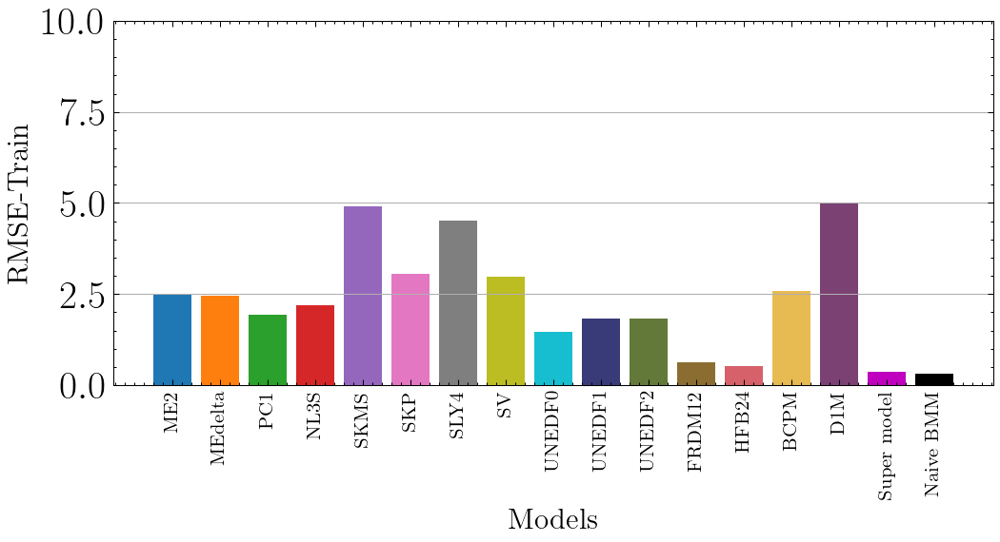

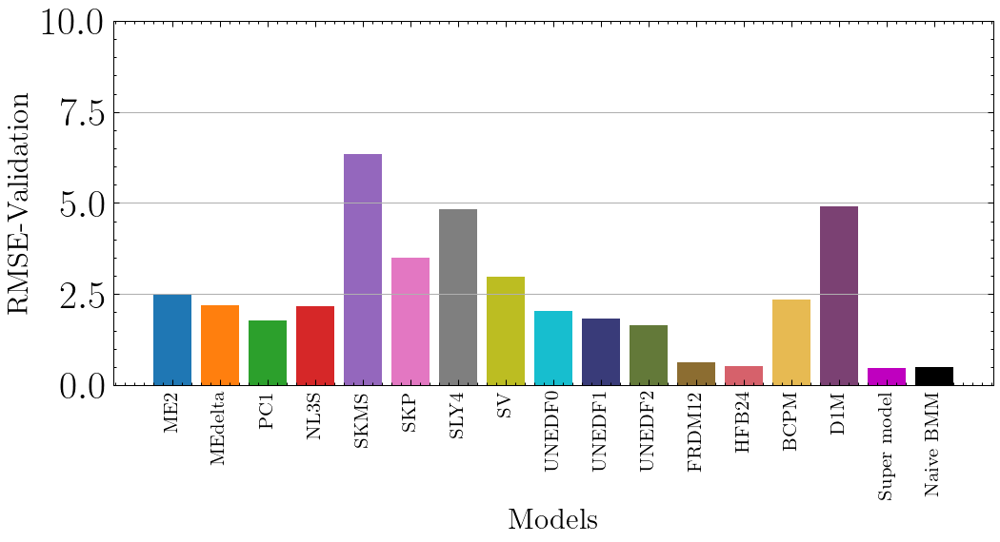

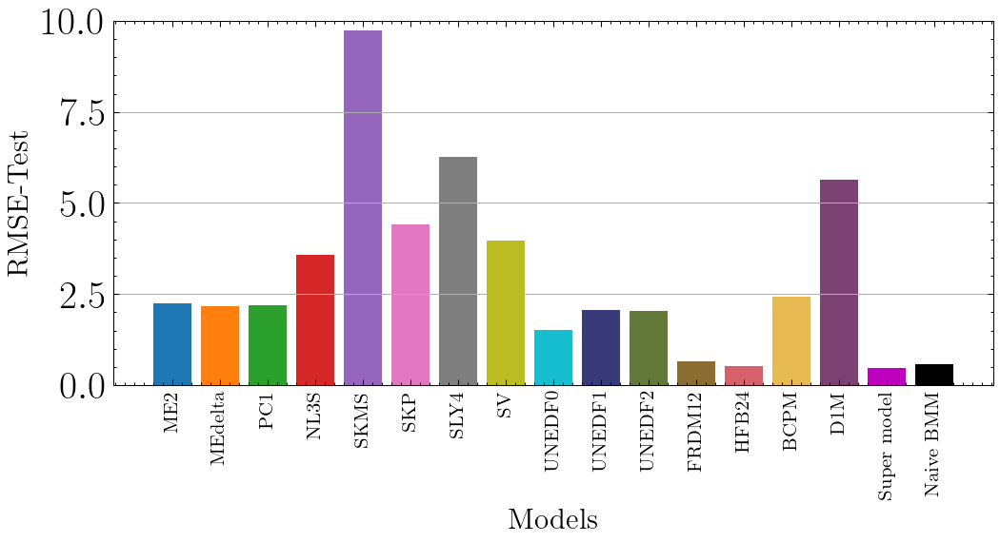

In [130]:
#Overall max height for the plots
y_max=10

plt.rc("xtick", labelsize=20)
plt.rc("ytick", labelsize=20)


################################

# Training round

labels=list(models_output.keys())
plt.figure(figsize=(7, 4),dpi=150)



i=0
for model in key_list:


        
        # ax.plot(filtered_models_output["N"], filtered_models_output[key_list[model_index]], 
        #         label = n_Labels[class_index], color=colors[class_index],alpha = alpha_models,linewidth=5)
        plt.bar(model , model_summary_df["rmse_train"][model], color=colors[i])
        i=i+1


plt.bar('Super model' , sigma_train, color='m')
plt.bar('Naive BMM' , sigma_naive_train, color='k')

plt.xlabel('Models',fontsize=15)
plt.ylabel('RMSE-Train',fontsize=15)
plt.ylim(0,y_max)
plt.xticks(fontsize=10,rotation='vertical')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

################################

# Validation round

labels=list(models_output.keys())
plt.figure(figsize=(7, 4),dpi=150)
# plt.figure(dpi=150)


i=0
for model in key_list:


        
        # ax.plot(filtered_models_output["N"], filtered_models_output[key_list[model_index]], 
        #         label = n_Labels[class_index], color=colors[class_index],alpha = alpha_models,linewidth=5)
        plt.bar(model , model_summary_df["rmse_validation"][model], color=colors[i])
        i=i+1

plt.bar('Super model' , sigma_validation, color='m')

plt.bar('Naive BMM' , sigma_naive_validation, color='k')

plt.xlabel('Models',fontsize=15)
plt.ylabel('RMSE-Validation',fontsize=15)
plt.ylim(0,y_max)
plt.xticks(fontsize=10,rotation='vertical')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

################################

# Testing round

labels=list(models_output.keys())
plt.figure(figsize=(7, 4),dpi=150)
# plt.figure(dpi=150)


i=0
for model in key_list:


        
        # ax.plot(filtered_models_output["N"], filtered_models_output[key_list[model_index]], 
        #         label = n_Labels[class_index], color=colors[class_index],alpha = alpha_models,linewidth=5)
        plt.bar(model , model_summary_df["rmse_test"][model], color=colors[i])
        i=i+1


plt.bar('Super model' , sigma_test, color='m')
plt.bar('Naive BMM' , sigma_naive_test, color='k')

plt.xlabel('Models',fontsize=15)
plt.ylabel('RMSE-Test',fontsize=15)
plt.ylim(0,y_max)
plt.xticks(fontsize=10,rotation='vertical')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

################################

# Everything round

## How results change as we change the number of PCs

In [131]:
def PC_RMSE_calculator(components_kept):  #A function that will basically run everything above (without the plots) with varying number of kept PCs




    S_hat=np.array([S[i] for i in range(components_kept)])

    # U_hat=np.array([U.T[i]*S_hat[i] for i in range(components_kept)])
    U_hat=np.array([U.T[i]*np.linalg.norm(predictions_train_mean) for i in range(components_kept)])

    # Vt_hat=np.array([Vt[i] for i in range(components_kept)])
    Vt_hat=np.array([Vt[i]/S_hat[i]*np.linalg.norm(predictions_train_mean) for i in range(components_kept)])   


    if centering_data:
        num_components=components_kept+1
    else:
        num_components=components_kept



    #########################################
    #Creating principal components that are for training. These should be equivalent to \hat U, and if they are not there is something wrong
    models_PC_train = {}
    if centering_data:
        models_PC_train[str("PC_0")] = predictions_train_mean       
    for i in range(components_kept):
        models_PC_train[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_train.T)
    models_PC_train["N"] = models_output_train["N"]
    models_PC_train["Z"] = models_output_train["Z"]
    models_PC_train["A"] = models_PC_train["N"] + models_PC_train["Z"]
    # models_PC_training = pd.DataFrame(models_PC_train)
    models_PC_train = pd.DataFrame(models_PC_train)
    #########################################

    #########################################
    #Creating principal components that are for validation
    models_PC_validation = {}
    if centering_data:
        models_PC_validation[str("PC_0")] = predictions_validation_mean
    for i in range(components_kept):
        models_PC_validation[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_validation.T)
    models_PC_validation["N"] = models_output_validation["N"]
    models_PC_validation["Z"] = models_output_validation["Z"]
    models_PC_validation["A"] = models_PC_validation["N"] + models_PC_validation["Z"]
    models_PC_validation = pd.DataFrame(models_PC_validation)
    #########################################

    #########################################
    #Creating principal components that are for testing
    models_PC_testing = {}
    if centering_data:
        models_PC_testing[str("PC_0")] = predictions_test_mean
    for i in range(components_kept):
        # models_PC_testing[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_test.T)*S_hat[i]
        models_PC_testing[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions_test.T)

    models_PC_testing["N"] = models_output_test["N"]
    models_PC_testing["Z"] = models_output_test["Z"]
    models_PC_testing["A"] = models_PC_testing["N"] + models_PC_testing["Z"]
    models_PC_testing = pd.DataFrame(models_PC_testing)
    #########################################

    #Creating principal components that are valid everywhere (testing + training + validation)
    models_PC = {}
    if centering_data:
        models_PC[str("PC_0")] = predictions_mean
    for i in range(components_kept):
        models_PC[str("PC_")+str(i+1)] = np.dot(Vt_hat[i],model_predictions.T)
    models_PC = pd.DataFrame(models_PC)
    models_PC["N"] = Full_set.T[0]
    models_PC["Z"] = Full_set.T[1]
    models_PC["A"] = models_PC["N"] + models_PC["Z"]
    #########################################

    key_list_PCs=list(models_PC_testing.keys())


    X=np.copy(U_hat)
    if centering_data:
        y=np.copy(models_output_train["truth"].tolist())-predictions_train_mean
    else:
        y=np.copy(models_output_train["truth"].tolist())
    #Making the list of principal components across the train part. These should be identical to the X on top made by \hat U
    X_train=[]
    for i in range(num_components):
        X_train.append(models_PC_train[key_list_PCs[i]].tolist())
    X_train=np.array(X_train)
    #Making the list of principal components across the validation part
    X_validation=[]
    for i in range(num_components):
        X_validation.append(models_PC_validation[key_list_PCs[i]].tolist())
    X_validation=np.array(X_validation)

    #Making the list of principal components across the testing part
    X_test=[]
    for i in range(num_components):
        X_test.append(models_PC_testing[key_list_PCs[i]].tolist())
    X_test=np.array(X_test)
    #Making the list of principal components across the entire chart (training+validation+testing)
    X_full=[]
    for i in range(num_components):
        X_full.append(models_PC[key_list_PCs[i]].tolist())
    X_full=np.array(X_full)

    

    # 1) Find the least square solution for the training part
    X_T_X_inv = np.linalg.inv(X.dot(X.T))
    beta = X_T_X_inv.dot(X).dot(y)
    
    #1.5) Construct the super model across the entire range and the test range
    if centering_data:
        beta_full= np.insert(beta, 0, 1)  #Augmenting the beta list to add a "1" at the begining so it can use the PC0 (the mean)
    else:
        beta_full=np.copy(beta)

    # supermodel=X.T.dot(beta_full)
    supermodel=X_train.T.dot(beta_full)
    supermodel_train=np.copy(supermodel)
    supermodel_validation=X_validation.T.dot(beta_full)
    supermodel_test=X_test.T.dot(beta_full)
    supermodel_full=X_full.T.dot(beta_full)

    
    super_model_resituals_train=supermodel_train-models_output_train['truth'].tolist()
    super_model_residuals_validation= supermodel_validation-models_output_validation['truth'].tolist()
    super_model_residuals_test = supermodel_test-models_output_test['truth'].tolist()
    super_model_residuals_full = supermodel_full-models_output['truth'].tolist()

    sigma_train=np.sqrt(np.sum(super_model_resituals_train**2) / len(super_model_resituals_train) )
    sigma_validation=np.sqrt(np.sum(super_model_residuals_validation**2) / len(super_model_residuals_validation) )
    sigma_test=np.sqrt(np.sum(super_model_residuals_test**2) / len(super_model_residuals_test) )
    sigma_full=np.sqrt(np.sum(super_model_residuals_full**2) / len(super_model_residuals_full) )


    return [sigma_train,sigma_validation,sigma_test,sigma_full]

In [132]:
if centering_data:
    s_validation=[np.linalg.norm(np.array(models_output_validation["truth"].tolist())-predictions_validation_mean)/np.sqrt(len(predictions_validation_mean))]
    s_test=[np.linalg.norm(np.array(models_output_test["truth"].tolist())-predictions_test_mean)/np.sqrt(len(predictions_test_mean))]
    s_train=[np.linalg.norm(np.array(models_output_train["truth"].tolist())-predictions_train_mean)/np.sqrt(len(predictions_train_mean))]
    s_all=[np.linalg.norm(np.array(models_output["truth"].tolist())-predictions_mean)/np.sqrt(len(predictions_mean))]
    
else:
    s_test=[]
    s_train=[]
    s_validation=[]
    s_all=[]

if centering_data:
    for i in range(1,len(S)):
        res=PC_RMSE_calculator(i)
        s_train.append(res[0])
        s_validation.append(res[1])
        s_test.append(res[2])
        
        s_all.append(res[3])
else:
    for i in range(1,len(S)+1):
        res=PC_RMSE_calculator(i)
        s_train.append(res[0])
        s_validation.append(res[1])
        s_test.append(res[2])
        
        s_all.append(res[3])

In [133]:
# if centering_data:
#     s_validation=[np.linalg.norm(np.array(models_output_validation["truth"].tolist())-predictions_validation_mean)/np.sqrt(len(predictions_validation_mean))]
#     s_test=[np.linalg.norm(np.array(models_output_test["truth"].tolist())-predictions_test_mean)/np.sqrt(len(predictions_test_mean))]
#     s_train=[np.linalg.norm(np.array(models_output_train["truth"].tolist())-predictions_train_mean)/np.sqrt(len(predictions_train_mean))]
#     s_all=[np.linalg.norm(np.array(models_output["truth"].tolist())-predictions_mean)/np.sqrt(len(predictions_mean))]
    
# else:
#     s_test=[]
#     s_train=[]
#     s_validation=[]
#     s_all=[]

# for i in range(1,len(S)):
#     res=PC_RMSE_calculator(i)
#     s_train.append(res[0])
#     s_validation.append(res[1])
#     s_test.append(res[2])
    
#     s_all.append(res[3])

### Plotting the results

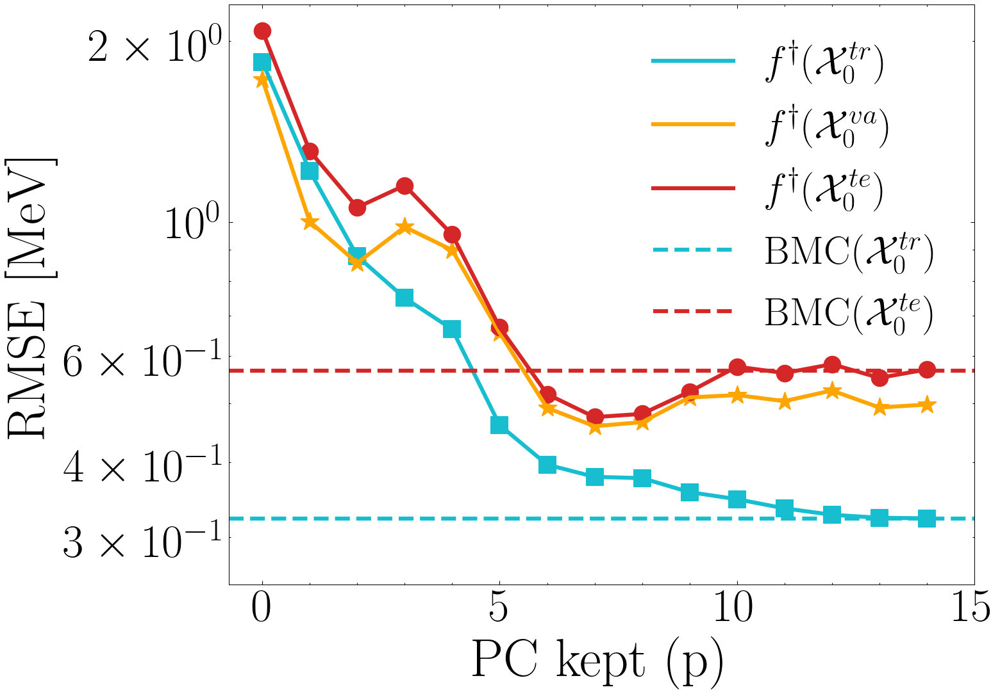

In [134]:
plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

fig, ax = plt.subplots(figsize=(10,8),dpi=150)
fig.patch.set_facecolor('white')




size_points=150


ax.scatter(np.arange(0,len(s_train)), s_train,color=color_trainig,s=size_points,marker=marker_trainig)
ax.plot(np.arange(0,len(s_train)), s_train,color=color_trainig,linewidth=3,label='$f^\dagger(\mathcal{X}_0^{tr})$')

ax.scatter(np.arange(0,len(s_validation)), s_validation,color=color_validation,s=size_points*1.3,marker=marker_validation)
ax.plot(np.arange(0,len(s_validation)), s_validation,color=color_validation,linewidth=3,label="$f^\dagger(\mathcal{X}_0^{va})$")


ax.scatter(np.arange(0,len(s_test)), s_test,color=color_testing,s=size_points,marker=marker_testing)
ax.plot(np.arange(0,len(s_test)), s_test,color=color_testing,linewidth=3,label="$f^\dagger(\mathcal{X}_0^{te})$")

ax.axhline(y=sigma_naive_train,color=color_trainig,label="BMC$(\mathcal{X}_0^{tr})$",linestyle='dashed',linewidth=3)

ax.axhline(y=sigma_naive_test,color=color_testing,label="BMC$(\mathcal{X}_0^{te})$",linestyle='dashed',linewidth=3)








ax.set_yticks([0.2,0.5,1,2])


ax.set_yscale('log')
ax.set_xlabel(r'PC kept (p)',fontsize=40)
ax.set_ylabel(r' RMSE [MeV]',fontsize=40);
ax.set_xticks([0,5,10,15])

plt.ylim(2.5*10**(-1),2.3)

# plt.legend(fontsize=20,loc=(0.1,0.6))
plt.legend(fontsize=30)
plt.show()

In [246]:
key_list_plotting=['DD-ME2',
 'DD-ME$\delta$',
 'DD-PC1',
 'NL3$^*$',
 'SkM$^*$',
 'SkP',
 'SLy4',
 'SV-min',
 'UNEDF0',
 'UNEDF1',
 'UNEDF2',
 'FRDM-12',
 'HFB-24',
 'BCPM',
 'D1M']

In [346]:
text_arrows_coordinates=[]


for visited_model in range(len(key_list)):
    text_arrows_coordinates.append([Vt_hat_normalized.T[visited_model][0], Vt_hat_normalized.T[visited_model][1]])

In [357]:
key_list

['ME2',
 'MEdelta',
 'PC1',
 'NL3S',
 'SKMS',
 'SKP',
 'SLY4',
 'SV',
 'UNEDF0',
 'UNEDF1',
 'UNEDF2',
 'FRDM12',
 'HFB24',
 'BCPM',
 'D1M']

In [358]:
text_arrows_coordinates_new=1.2*np.array([
 [1.3*0.08612691738136995, -1.3*0.3180988975817903],
 [2*0.06571505636708896+0.08, -2*0.16895837223969457],
 [0.3212721119069401+0.1, 0.14164474550984557-0.03],
 [1.1*0.24335175302351952+0.04, -1.1*0.24732553998826373],
 [-0.5057452335525958, 0.2826186402457717],
 [-0.19851373442792028-0.03, 0.3131228044444988],
 [-1.1*0.4085079327245562, 1.1*0.17053867754565818-0.03],
 [-1.6*0.18859750185565305, -1.6*0.03608580503598219],
 [0.07942485169267002-0.05, 0.29019401268310263+0.02],
 [0.22855238690121704+0.13, -0.031292570250878726-0.04],
 [0.24822938332115163+0.13, 0.007075451654206991+0.01],
 [0.2120026581294464+0.13, 0.1930934142001326-0.014],
 [0.20219632622073364+0.01, 0.21832641865278604+0.032],
 [-1.3*0.0380029179066879, -1.3*0.20925717118856013],
 [-0.347504124476724-0.04, -0.6055958086508355+0.05]
])

In [520]:
colors_barplot= [
    'grey',
    "#ff7f0e", # Bright orange
    "#2ca02c", # Rich green
#     "#d62728", # Strong red
    "#9467bd", # Deep purple
    # "#8c564b", # Brownish-pink
    "#e377c2", # Pink
    "#7f7f7f", # Medium gray
    "#bcbd22", # Lime green
#     "#17becf", # Cyan
    "#393b79", # Dark blue
    "#637939", # Olive green
    "#8c6d31", # Bronze
    # "#843c39", # Dark red
    # "#ad494a", # Reddish brown
#     "#d6616b", # Soft red
    "#e7ba52", # Golden yellow
    "#7b4173", # Dark purple
#     "#a55194", # Mauve
    
    "#1f77b4", # Vivid blue
    "#ad494a",  #Reddish brown
    'k'
]

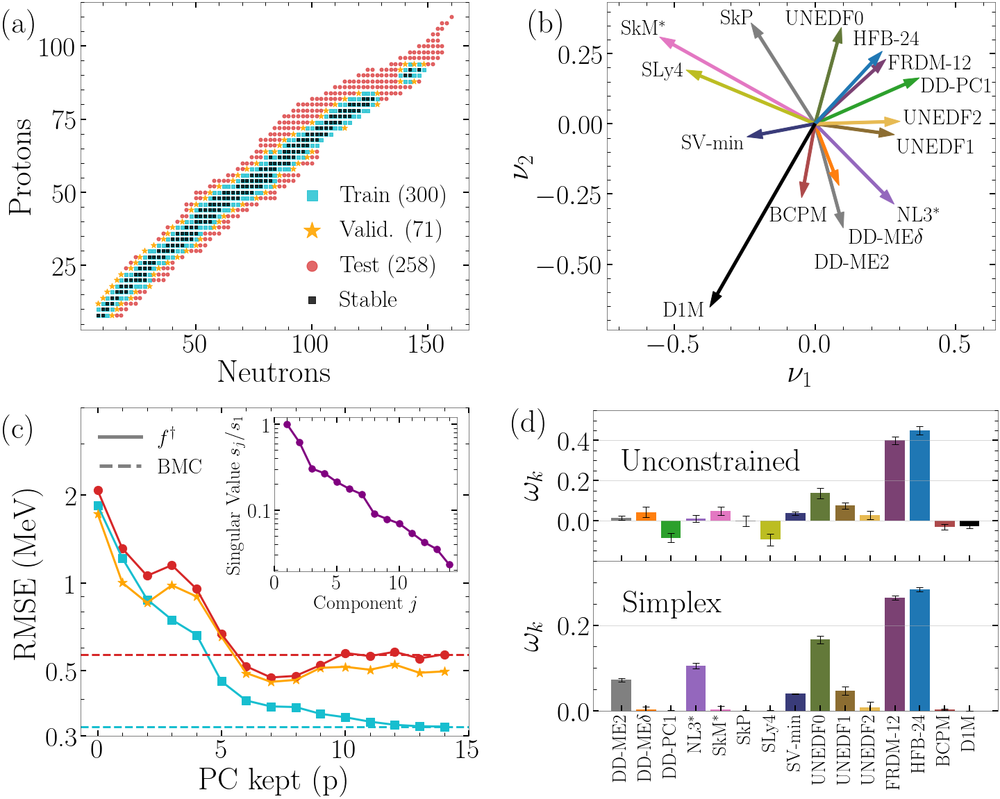

In [629]:

ticks_font_size=40


# Create a figure
fig = plt.figure(figsize=(20, 16),constrained_layout=True)
fig.set_constrained_layout_pads(w_pad=0.05, h_pad=0.05, hspace=0.05, wspace=0.05)

# Define the main GridSpec
gs = gridspec.GridSpec(2, 2, figure=fig)





# Top-left subplot


######### Figure 1 ############


# Accessing each subplot using axs[row, col] and plotting data
# Top-left subplot (0, 0)
ax1 = fig.add_subplot(gs[0, 0])

color_trainig=colors_sets[9]
color_validation='orange'
color_testing=colors_sets[3]

marker_trainig='s'
marker_validation='*'
marker_testing='o'



size_trainig=25
size_validation=70
size_testing=25

alpha_trainig=0.8
alpha_validation=0.9
alpha_testing=0.7



ax1.scatter(x = training_set.T[0], y = training_set.T[1], label = "Train ("+ str(len(training_set))+")", alpha = alpha_trainig,color=color_trainig,s=size_trainig,marker=marker_trainig)

ax1.scatter(x = validation_set.T[0], y = validation_set.T[1], label = "Valid. (" + str(len(validation_set))+")", alpha = alpha_validation,color=color_validation,s=size_validation,marker=marker_validation)

ax1.scatter(x = test_set.T[0], y = test_set.T[1], label = "Test (" + str(len(test_set))+")", alpha = alpha_testing,color=color_testing,s=size_testing,marker=marker_testing)


ax1.scatter(x = stable_coordinates.T[0], y = stable_coordinates.T[1], label = "Stable", alpha = 0.8,color='black',s=11,marker="s")


ax1.set_xlabel("Neutrons",fontsize=45)
ax1.set_ylabel("Protons",fontsize=45)

ax1.legend(fontsize=34,markerscale=3 ,loc =(0.51,0.03),handletextpad=0.2)

ax1.tick_params(axis='both', length=8, width=2)

ax1.tick_params(axis='both',which='minor', length=5, width=1)

ax1.tick_params(axis='both', labelsize=ticks_font_size)
###############################

######### Figure2 ############


# Top-right subplot
ax2 = fig.add_subplot(gs[0, 1])



visited_model=0
for model in key_list_plotting:
    ax2.arrow(0, 0, Vt_hat_normalized.T[visited_model][0],Vt_hat_normalized.T[visited_model][1], 
            head_width=0.035, head_length=0.055, fc=colors_barplot[visited_model], ec=colors_barplot[visited_model],label=model,
             width=0.01)
    
    plt.text(text_arrows_coordinates_new[visited_model][0], text_arrows_coordinates_new[visited_model][1],
             model,fontsize=30,ha='center', va='center')    
   
    visited_model=visited_model+1



# ax2.set_xlabel('Projection on $\phi_1$',fontsize=45)
# ax2.set_ylabel('Projection on $\phi_2$',fontsize=45)

ax2.set_xlabel(r'$\nu_1$',fontsize=45)
ax2.set_ylabel(r'$\nu_2$',fontsize=45)

# axs[0, 1].set_xticks(fontsize=35)
# axs[0, 1].set_yticks(fontsize=35)

ax2.tick_params(axis='both', which='major', labelsize=35)



ax2.axis('equal')

ax2.set_xlim(-0.8,0.7)

ax2.set_ylim(-0.9,0.6)

ax2.tick_params(axis='both', length=8, width=2)

ax2.tick_params(axis='both',which='minor', length=5, width=1)

ax2.tick_params(axis='both', labelsize=ticks_font_size)

###############################


######### Figure 3 ############


# Bottom-left subplot (1, 0)
ax3 = fig.add_subplot(gs[1, 0])

size_points=150


ax3.scatter(np.arange(0,len(s_train)), s_train,color=color_trainig,s=size_points,marker=marker_trainig)
ax3.plot(np.arange(0,len(s_train)), s_train,color=color_trainig,linewidth=3,label='$f^\dagger(\mathcal{X}_0^{tr})$')

ax3.scatter(np.arange(0,len(s_validation)), s_validation,color=color_validation,s=size_points*1.3,marker=marker_validation)
ax3.plot(np.arange(0,len(s_validation)), s_validation,color=color_validation,linewidth=3,label="$f^\dagger(\mathcal{X}_0^{va})$")


ax3.scatter(np.arange(0,len(s_test)), s_test,color=color_testing,s=size_points,marker=marker_testing)
ax3.plot(np.arange(0,len(s_test)), s_test,color=color_testing,linewidth=3,label="$f^\dagger(\mathcal{X}_0^{te})$")

ax3.axhline(y=sigma_naive_train,color=color_trainig,label="BMC$(\mathcal{X}_0^{tr})$",linestyle='dashed',linewidth=3)

ax3.axhline(y=sigma_naive_test,color=color_testing,label="BMC$(\mathcal{X}_0^{te})$",linestyle='dashed',linewidth=3)


ax3.set_yscale('log')

ax3.set_xticks([0,5,10,15])


ax3.set_yticks([0.3,0.5,1,2])
ax3.set_yticklabels(['0.3','0.5','1','2'])


ax3.set_xlabel(r'PC kept (p)',fontsize=45)
ax3.set_ylabel(r' RMSE (MeV)',fontsize=45);

ax3.set_ylim([0.3,4])

# ax3.yaxis.set_minor_locator(plt.NullLocator())
ax3.yaxis.set_minor_formatter(plt.NullFormatter())

# ax3.set_ylim(2.5*10**(-1),2.3)


ax3.tick_params(axis='both', length=8, width=2)

ax3.tick_params(axis='both',which='minor', length=5, width=1)

# ax3.legend(fontsize=30)



ax3.tick_params(axis='both', labelsize=ticks_font_size)





# Define custom legend handles
legend_handles = [
     Line2D([0], [0], color='grey', linewidth=5, linestyle='-', label=r'$f^\dagger$'),
    Line2D([0], [0], color='grey', linewidth=5, linestyle='--', label='BMC'),
   
]

ax3.legend(handles=legend_handles, labels=[r'$f^\dagger$', 'BMC'], loc='upper left',fontsize=30)

######### Inset Figure 3  ##############

# inset_ax3 = inset_axes(ax3, width="50%", height="50%", loc='upper right')


inset_ax3 = inset_axes(ax3, width="100%", height="100%", 
                       bbox_to_anchor=(0.5, 0.5, 0.47, 0.47),
                       bbox_transform=ax3.transAxes, loc='center')

#We plot only up to n-1 singular values if we centered the data because the nth value is numerical noise ~10**(-15)

inset_ax3.scatter(np.arange(1,S.size), S[0:-1]/S[0],color='purple',s=90)
inset_ax3.plot(np.arange(1,S.size), S[0:-1]/S[0],color='purple',linewidth=3)



inset_ax3.set_yscale('log')
inset_ax3.set_xlabel(r'Component $j$',fontsize=28)
inset_ax3.set_ylabel(r' Singular Value $s_j/s_1$',fontsize=28);
# plt.ylim(2*10**(-3),1.5)
inset_ax3.set_xticks([0,5,10])

inset_ax3.set_yticks([0.1,1])

inset_ax3.set_yticklabels(['0.1','1'])
# plt.title("Singular values decay",fontsize=30)


inset_ax3.tick_params(axis='both', length=8, width=2)

inset_ax3.tick_params(axis='both',which='minor', length=5, width=1)








###############################

#########  Figure 4  ##############

# Define a nested GridSpec for the bottom-right quadrant
nested_gs = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs[1, 1])

# Create and position the first bar plot in the bottom-right subplot
ax4a = fig.add_subplot(nested_gs[0])


x_pos=0.595
x_with=0.405

y_pos=0.11
ywidth=0.188

ax4a.set_position([x_pos, y_pos+ywidth, x_with, ywidth])  # Adjust these values as needed [left, bottom, width, height]


# Remove x-axis labels and tick marks from the top bar plot
ax4a.tick_params(labelbottom=False)
ax4a.grid(axis='y')

i=0
for model in key_list_plotting:
        
       
        ax4a.bar(model , np.mean(samples_naive_space_sigma.T[i]),yerr=2*np.std(samples_naive_space_sigma.T[i]), 
                 color=colors_barplot[i],capsize=5)
        i=i+1

# ax4a.minorticks_off()
ax4a.xaxis.set_tick_params(which='both', top=False)
ax4a.tick_params(axis='both', length=8, width=2)

ax4a.tick_params(axis='y',which='minor', length=5, width=1)

ax4a.tick_params(axis='x',which='minor', length=0, width=0)

# ax4a.set_ylim(-0.3,0.55)

# ax4a.set_yticks([-0.2,0,0.2,0.4])

ax4a.set_ylim(-0.2,0.55)

ax4a.set_yticks([0,0.2,0.4])


ax4a.set_ylabel('$\omega_k$',fontsize=45, labelpad=20)

ax4a.tick_params(axis='both', labelsize=ticks_font_size)


ax4a.annotate('Unconstrained', xy=(0.0,0.29), 
             ha='left', va='center', fontsize=45) 

# Create and position the second bar plot in the bottom-right subplot
ax4b = fig.add_subplot(nested_gs[1], sharex=ax4a)
ax4b.grid(axis='y')
ax4b.set_position([x_pos, y_pos, x_with, ywidth])  # Adjust these values to reduce the gap


i=0
for model in key_list_plotting:
        
       
        ax4b.bar(model , np.mean(samples_naive_space_simplex.T[i]),
                 yerr=2*np.std(samples_naive_space_simplex.T[i]), color=colors_barplot[i],capsize=5)
        i=i+1


        
# bars = ax4b.bar(names, values)


# Set the x-ticks to correspond to the bar positions and assign names
ax4b.set_xticks(range(len(key_list_plotting)))  # Set tick positions
ax4b.set_xticklabels(key_list_plotting,fontsize=27)  # Set text labels

# Optional: Rotate labels if they overlap or if preferred
ax4b.tick_params(axis='x', labelrotation=90) 
        

# ax4b.set_minorticks_off()
ax4b.set_ylabel('$\omega_k$',fontsize=45, labelpad=20)


ax4b.xaxis.set_tick_params(which='both', top=False)
ax4b.tick_params(axis='both', length=8, width=2)

ax4b.tick_params(axis='y',which='minor', length=5, width=1)

ax4b.tick_params(axis='x',which='minor', length=0, width=0)

ax4b.set_ylim(0,0.35)

ax4b.set_yticks([0,0.2])

ax4b.tick_params(axis='y', labelsize=ticks_font_size)

ax4b.annotate('Simplex', xy=(0.11,0.25), 
             ha='left', va='center', fontsize=45) 


ax1.text(-0.2, 0.98, '(a)', transform=ax1.transAxes, fontsize=45, va='top', ha='left')


ax2.text(-0.2, 0.98, '(b)', transform=ax2.transAxes, fontsize=45, va='top', ha='left')


ax3.text(-0.2, 0.98, '(c)', transform=ax3.transAxes, fontsize=45, va='top', ha='left')


ax4a.text(-0.2, 1.02, '(d)', transform=ax4a.transAxes, fontsize=45, va='top', ha='left')

# Show the plot
plt.show()
fig.savefig('Figure-Realistic-4P.pdf')

In [487]:
text_arrows_coordinates_new=1.2*np.array([
 [1.3*0.08612691738136995, -1.3*0.3180988975817903],
 [2*0.06571505636708896+0.08, -2*0.16895837223969457],
 [0.3212721119069401+0.1, 0.14164474550984557-0.03],
 [1.1*0.24335175302351952+0.04, -1.1*0.24732553998826373],
 [-0.5057452335525958, 0.2826186402457717],
 [-0.19851373442792028-0.03, 0.3131228044444988],
 [-1.1*0.4085079327245562, 1.1*0.17053867754565818-0.03],
 [-1.6*0.18859750185565305, -1.6*0.03608580503598219],
 [0.07942485169267002-0.05, 0.29019401268310263+0.02],
 [0.22855238690121704+0.13, -0.031292570250878726-0.04],
 [0.24822938332115163+0.13, 0.007075451654206991+0.01],
 [0.2120026581294464+0.13, 0.1930934142001326-0.014],
 [0.20219632622073364+0.01, 0.21832641865278604+0.032],
 [-1.3*0.0380029179066879, -1.3*0.20925717118856013],
 [-0.347504124476724-0.04, -0.6055958086508355+0.05]
])

In [374]:
key_list_plotting

['DD-ME2',
 'DD-ME$\\delta$',
 'DD-PC1',
 'NL3$^*$',
 'SkM$^*$',
 'SkP',
 'SLy4',
 'SV-min',
 'UNEDF0',
 'UNEDF1',
 'UNEDF2',
 'FRDM-12',
 'HFB-24',
 'BCPM',
 'D1M']

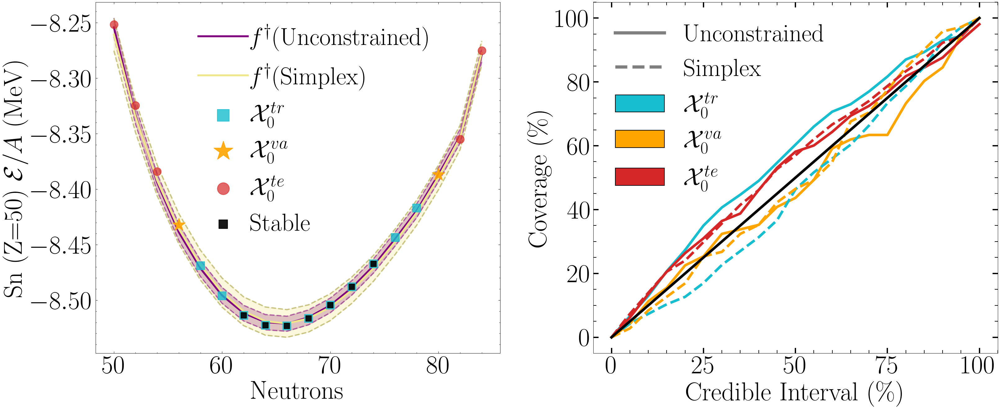

In [666]:

plt.rc("xtick", labelsize=40)
plt.rc("ytick", labelsize=40)

# Create a figure with two subplots (side by side)
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(25,10), dpi=150)

######### Figure 1 #############

plt.rc("xtick", labelsize=30)
plt.rc("ytick", labelsize=30)


samples_plot=np.copy(rndm_m)



mean = -np.mean(samples_plot,axis=0)/filtered_models_output["A"]
upper = -(np.percentile(samples_plot, 97.5, axis=0))/filtered_models_output["A"]

lower = -(np.percentile(samples_plot, 2.5, axis=0))/filtered_models_output["A"]

ax1.plot(filtered_models_output["N"], mean, color="purple", label='$f^\dagger$(Unconstrained)',linewidth=3)

ax1.plot(filtered_models_output["N"], lower, color="purple",linestyle="dashed",linewidth=2,alpha=0.5)
ax1.plot(filtered_models_output["N"], upper, color="purple",linestyle="dashed",linewidth=2,alpha=0.5)

ax1.fill_between(filtered_models_output["N"], lower, upper, color="purple",alpha=0.3)





color_simplex= "khaki"

samples_plot=np.copy(rndm_m_simplex)

mean = -np.mean(samples_plot,axis=0)/filtered_models_output["A"]
upper = -(np.percentile(samples_plot, 97.5, axis=0))/filtered_models_output["A"]

lower = -(np.percentile(samples_plot, 2.5, axis=0))/filtered_models_output["A"]

ax1.plot(filtered_models_output["N"], mean, color=color_simplex, label='$f^\dagger$(Simplex)',linewidth=3)


ax1.plot(filtered_models_output["N"], lower, color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.8)
ax1.plot(filtered_models_output["N"], upper, color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.8)

ax1.fill_between(filtered_models_output["N"], lower, upper, color=color_simplex,alpha=0.3)









size_multiplyier=6

ax1.scatter(x = filtered_models_output_train["N"], y = -filtered_models_output_train['truth']/filtered_models_output_train["A"], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_trainig,color=color_trainig,s=size_trainig*size_multiplyier,marker=marker_trainig,zorder=2)

ax1.scatter(x = filtered_models_output_validation["N"], y = -filtered_models_output_validation['truth']/filtered_models_output_validation["A"], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=size_validation*size_multiplyier,marker=marker_validation,zorder=2)

ax1.scatter(x = filtered_models_output_test["N"], y = -filtered_models_output_test['truth']/filtered_models_output_test["A"], label = "$\mathcal{X}_0^{te}$", alpha = alpha_testing,color=color_testing,s=size_testing*size_multiplyier,marker=marker_testing,zorder=2)

ax1.scatter(x = filtered_models_output_stable["N"], y =- filtered_models_output_stable['truth']/filtered_models_output_stable["A"], label = "Stable", alpha = 0.9,color='k',s=80,marker="s",zorder=2)





ax1.set_xlabel("Neutrons",fontsize=40)
ax1.set_ylabel("Sn (Z=50) $ {\cal E}/A$ (MeV)",fontsize=40)
# plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
 
# ax1.legend(fontsize=40,markerscale=1,ncol=1,columnspacing=0.5)


# ax1.legend(fontsize=38,markerscale=1,loc='upper center')

ax1.legend(fontsize=38,loc='upper left', bbox_to_anchor=(0.2, 1),handletextpad=0.1,markerscale=1.5 )








######### Figure 2 ############


width_line=4

ax2.plot(percentiles, coverage_train, label='Training',color=color_trainig,linewidth=width_line)
ax2.plot(percentiles, coverage_validation, label='Validation',color=color_validation,linewidth=width_line)
ax2.plot(percentiles, coverage_test, label='Test',color=color_testing,linewidth=width_line)


ax2.plot(percentiles, coverage_train_simplex,linestyle='dashed', label='Training',color=color_trainig,linewidth=width_line)
ax2.plot(percentiles, coverage_validation_simplex, linestyle='dashed',label='Validation',color=color_validation,linewidth=width_line)
ax2.plot(percentiles, coverage_test_simplex,linestyle='dashed', label='Test',color=color_testing,linewidth=width_line)



ax2.plot(percentiles, percentiles,label='reference',color='k',linewidth=width_line)
ax2.set_xlabel('Credible Interval (\%)',fontsize=40)
ax2.set_ylabel('Coverage (\%)',fontsize=40)




ax2.tick_params(axis='both', length=8, width=2)

ax2.tick_params(axis='both',which='minor', length=5, width=1)

ax2.tick_params(axis='both', labelsize=ticks_font_size)
###############################


legend_handles = [
     Line2D([0], [0], color='grey', linewidth=5, linestyle='-', label=r'$f^\dagger$'),
     Line2D([0], [0], color='grey', linewidth=5, linestyle='--', label='BMC'),
    
#     Line2D([0], [0], color=color_trainig, linewidth=10, linestyle='-', label=r'$\mathcal{X}_0^{tr}$'),
#     Line2D([0], [0], color=color_validation, linewidth=10, linestyle='-', label=r'$\mathcal{X}_0^{va}$'),
#     Line2D([0], [0], color=color_testing, linewidth=10, linestyle='-', label=r'$\mathcal{X}_0^{te}$')
   
    
    Patch(facecolor=color_trainig, edgecolor='black'),
    Patch(facecolor=color_validation, edgecolor='black'),
    Patch(facecolor=color_testing, edgecolor='black')
    
]

ax2.legend(handles=legend_handles, labels=['Unconstrained', 'Simplex',r'$\mathcal{X}_0^{tr}$',
                                          r'$\mathcal{X}_0^{va}$',
                                          r'$\mathcal{X}_0^{te}$'], loc='upper left',fontsize=38)





# Adjust the spacing between the plots
plt.subplots_adjust(wspace=0.23)  # Adjust the width space

# Show the figure
plt.show()
fig.savefig('Figure-Realistic-2P.pdf')

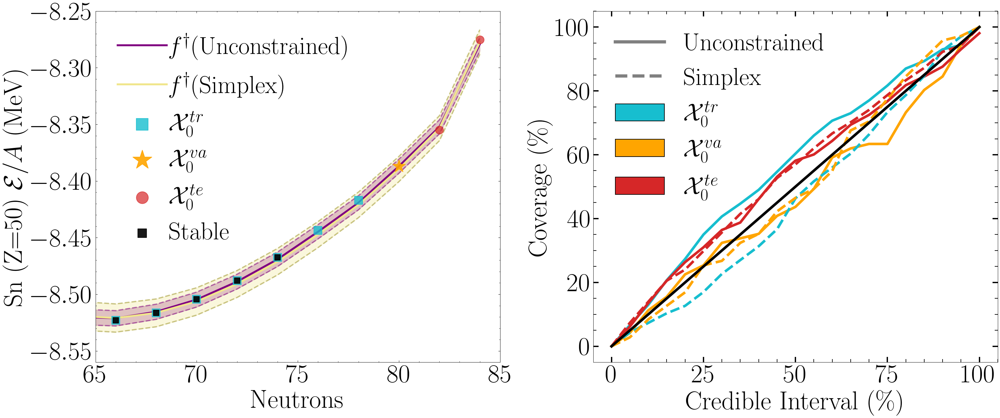

In [674]:

plt.rc("xtick", labelsize=40)
plt.rc("ytick", labelsize=40)

# Create a figure with two subplots (side by side)
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(25,10), dpi=150)

######### Figure 1 #############

plt.rc("xtick", labelsize=30)
plt.rc("ytick", labelsize=30)


samples_plot=np.copy(rndm_m)



mean = -np.mean(samples_plot,axis=0)/filtered_models_output["A"]
upper = -(np.percentile(samples_plot, 97.5, axis=0))/filtered_models_output["A"]

lower = -(np.percentile(samples_plot, 2.5, axis=0))/filtered_models_output["A"]

ax1.plot(filtered_models_output["N"], mean, color="purple", label='$f^\dagger$(Unconstrained)',linewidth=3)

ax1.plot(filtered_models_output["N"], lower, color="purple",linestyle="dashed",linewidth=2,alpha=0.5)
ax1.plot(filtered_models_output["N"], upper, color="purple",linestyle="dashed",linewidth=2,alpha=0.5)

ax1.fill_between(filtered_models_output["N"], lower, upper, color="purple",alpha=0.3)





color_simplex= "khaki"

samples_plot=np.copy(rndm_m_simplex)

mean = -np.mean(samples_plot,axis=0)/filtered_models_output["A"]
upper = -(np.percentile(samples_plot, 97.5, axis=0))/filtered_models_output["A"]

lower = -(np.percentile(samples_plot, 2.5, axis=0))/filtered_models_output["A"]

ax1.plot(filtered_models_output["N"], mean, color=color_simplex, label='$f^\dagger$(Simplex)',linewidth=3)


ax1.plot(filtered_models_output["N"], lower, color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.8)
ax1.plot(filtered_models_output["N"], upper, color="darkkhaki",linestyle="dashed",linewidth=2,alpha=0.8)

ax1.fill_between(filtered_models_output["N"], lower, upper, color=color_simplex,alpha=0.3)









size_multiplyier=6

ax1.scatter(x = filtered_models_output_train["N"], y = -filtered_models_output_train['truth']/filtered_models_output_train["A"], label = "$\mathcal{X}_0^{tr}$",  alpha = alpha_trainig,color=color_trainig,s=size_trainig*size_multiplyier,marker=marker_trainig,zorder=2)

ax1.scatter(x = filtered_models_output_validation["N"], y = -filtered_models_output_validation['truth']/filtered_models_output_validation["A"], label = "$\mathcal{X}_0^{va}$", alpha=alpha_validation ,color=color_validation,s=size_validation*size_multiplyier,marker=marker_validation,zorder=2)

ax1.scatter(x = filtered_models_output_test["N"], y = -filtered_models_output_test['truth']/filtered_models_output_test["A"], label = "$\mathcal{X}_0^{te}$", alpha = alpha_testing,color=color_testing,s=size_testing*size_multiplyier,marker=marker_testing,zorder=2)

ax1.scatter(x = filtered_models_output_stable["N"], y =- filtered_models_output_stable['truth']/filtered_models_output_stable["A"], label = "Stable", alpha = 0.9,color='k',s=80,marker="s",zorder=2)





ax1.set_xlabel("Neutrons",fontsize=40)
ax1.set_ylabel("Sn (Z=50) $ {\cal E}/A$ (MeV)",fontsize=40)
# plt.ylabel(Selected_element_name+ " BE/A MeV",fontsize=25)
 
# ax1.legend(fontsize=40,markerscale=1,ncol=1,columnspacing=0.5)


ax1.legend(fontsize=38,handletextpad=0.1,markerscale=1.5,loc='upper left')

# ax1.legend(fontsize=38,loc='upper left', bbox_to_anchor=(0.2, 1),handletextpad=0.1,markerscale=1.5 )



ax1.set_xlim(65,85)

ax1.set_ylim(-8.56,-8.25)


######### Figure 2 ############


width_line=4

ax2.plot(percentiles, coverage_train, label='Training',color=color_trainig,linewidth=width_line)
ax2.plot(percentiles, coverage_validation, label='Validation',color=color_validation,linewidth=width_line)
ax2.plot(percentiles, coverage_test, label='Test',color=color_testing,linewidth=width_line)


ax2.plot(percentiles, coverage_train_simplex,linestyle='dashed', label='Training',color=color_trainig,linewidth=width_line)
ax2.plot(percentiles, coverage_validation_simplex, linestyle='dashed',label='Validation',color=color_validation,linewidth=width_line)
ax2.plot(percentiles, coverage_test_simplex,linestyle='dashed', label='Test',color=color_testing,linewidth=width_line)



ax2.plot(percentiles, percentiles,label='reference',color='k',linewidth=width_line)
ax2.set_xlabel('Credible Interval (\%)',fontsize=40)
ax2.set_ylabel('Coverage (\%)',fontsize=40)




ax2.tick_params(axis='both', length=8, width=2)

ax2.tick_params(axis='both',which='minor', length=5, width=1)

ax2.tick_params(axis='both', labelsize=ticks_font_size)
###############################


legend_handles = [
     Line2D([0], [0], color='grey', linewidth=5, linestyle='-', label=r'$f^\dagger$'),
     Line2D([0], [0], color='grey', linewidth=5, linestyle='--', label='BMC'),
    
#     Line2D([0], [0], color=color_trainig, linewidth=10, linestyle='-', label=r'$\mathcal{X}_0^{tr}$'),
#     Line2D([0], [0], color=color_validation, linewidth=10, linestyle='-', label=r'$\mathcal{X}_0^{va}$'),
#     Line2D([0], [0], color=color_testing, linewidth=10, linestyle='-', label=r'$\mathcal{X}_0^{te}$')
   
    
    Patch(facecolor=color_trainig, edgecolor='black'),
    Patch(facecolor=color_validation, edgecolor='black'),
    Patch(facecolor=color_testing, edgecolor='black')
    
]

ax2.legend(handles=legend_handles, labels=['Unconstrained', 'Simplex',r'$\mathcal{X}_0^{tr}$',
                                          r'$\mathcal{X}_0^{va}$',
                                          r'$\mathcal{X}_0^{te}$'], loc='upper left',fontsize=38)





# Adjust the spacing between the plots
plt.subplots_adjust(wspace=0.23)  # Adjust the width space

# Show the figure
plt.show()
fig.savefig('Figure-Realistic-2P-Option2.pdf')

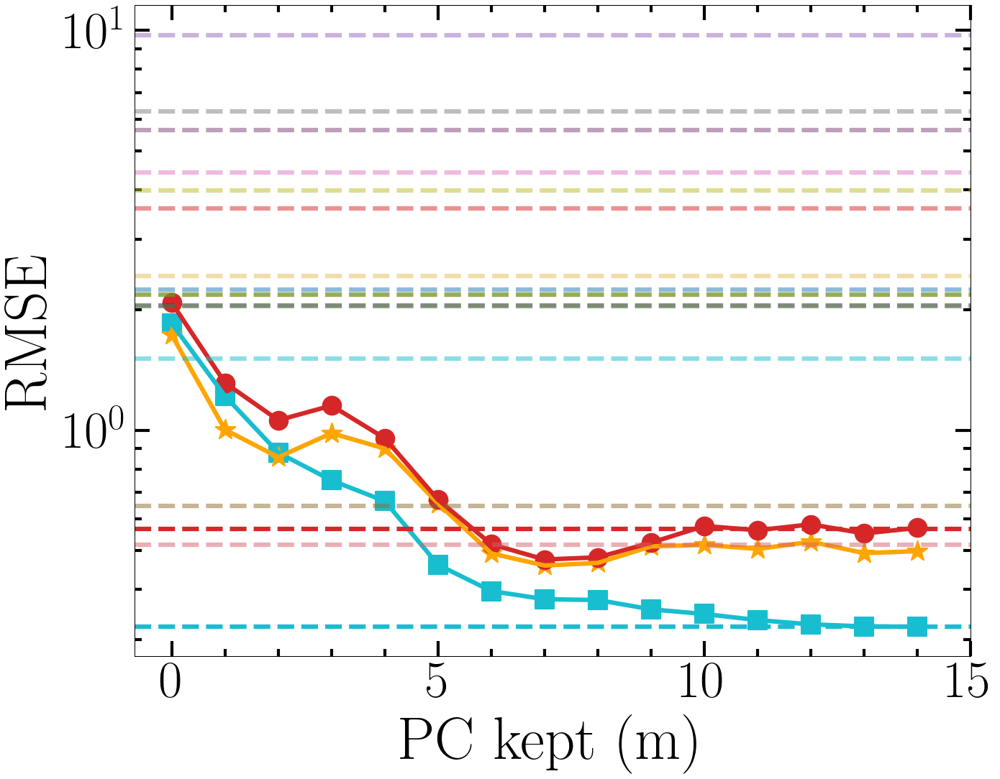

In [135]:
plt.rc("xtick", labelsize=35)
plt.rc("ytick", labelsize=35)

fig, ax = plt.subplots(figsize=(10,8),dpi=150)
fig.patch.set_facecolor('white')


# color_trainig=colors[9]
# color_validation='orange'
# color_testing=colors[3]

# marker_trainig='s'
# marker_validation='*'
# marker_testing='o'



# size_trainig=30
# size_validation=80
# size_testing=35

# alpha_trainig=0.8
# alpha_validation=0.9
# alpha_testing=0.4



size_points=150


ax.scatter(np.arange(0,len(s_train)), s_train,color=color_trainig,s=size_points,marker=marker_trainig)
ax.plot(np.arange(0,len(s_train)), s_train,color=color_trainig,linewidth=3,label="Train")

ax.scatter(np.arange(0,len(s_validation)), s_validation,color=color_validation,s=size_points*1.3,marker=marker_validation)
ax.plot(np.arange(0,len(s_validation)), s_validation,color=color_validation,linewidth=3,label="Valid.")


ax.scatter(np.arange(0,len(s_test)), s_test,color=color_testing,s=size_points,marker=marker_testing)
ax.plot(np.arange(0,len(s_test)), s_test,color=color_testing,linewidth=3,label="Test")

# ax.scatter(np.arange(1,len(s_all)+1), s_all,color='k',s=90,marker="s")
# ax.plot(np.arange(1,len(s_all)+1), s_all,color='k',linewidth=3,label="All",linestyle='dashed')

ax.axhline(y=sigma_naive_test,color=color_testing,label="Test$^0$",linestyle='dashed',linewidth=3)

ax.axhline(y=sigma_naive_train,color=color_trainig,label=f"Train$^0$",linestyle='dashed',linewidth=3)




i=0
for model in key_list:


        
        # ax.plot(filtered_models_output["N"], filtered_models_output[key_list[model_index]], 
        #         label = n_Labels[class_index], color=colors[class_index],alpha = alpha_models,linewidth=5)

        ax.axhline(y=model_summary_df["rmse_test"][model],color=colors[i],label=model,linestyle='dashed',linewidth=3,alpha=0.5)
        i=i+1





ax.set_yscale('log')
ax.set_xlabel(r'PC kept (m)',fontsize=40)
ax.set_ylabel(r' RMSE',fontsize=40);
ax.set_xticks([0,5,10,15])
# ax.set_yticks()
# plt.ylim(1.7*10**(-2),1)

# plt.title("Singular values decay",fontsize=30)

plt.tick_params(axis='both',       
            which='major',      
            length=10,        
            width=2)

plt.tick_params(axis='both',       
            which='minor',      
            length=5,        
            width=2) 

# plt.annotate(f'$5 x 10^{{-1}}$', xy=(-0.12,1), xycoords='axes fraction',
#              ha='center', va='top', fontsize=30) 

# plt.annotate(f'$2 x 10^{{-2}}$', xy=(-0.12,0.1), xycoords='axes fraction',
#              ha='center', va='top', fontsize=30) 



# plt.legend(fontsize=20,loc=(0.1,0.6))
# plt.legend(fontsize=15,ncols=2)
plt.show()

## Constrained approach (simplex, MCMC plus sigma sampling)

Below are the lines of codes to do the MCMC approach with the simplex constraint. We are not running that for now. 

In [ ]:
print(1/0)
#To stop notebook from running if we hit the run all command

In [ ]:

#Interestingly enough, if we are centering the data, the constraint that the sum of the weights is 0 is automatically enforced. They can still be negative though

if centering_data:  #Calculating a bias term to add to the coefficient transformation to account for the \phi0 term
    bias0=np.full(len(model_predictions_train.T),1/len(model_predictions_train.T))
else:
    bias0=np.full(len(model_predictions_train.T),0)

def b1_finder(beta_2m,Vt_hat):
#     beta_2m is a list of the beta values that are active
    if len(beta_2m)<1:
        print("AAAAAAAAAAA!")
    return (1-np.sum(bias0)-np.sum(np.dot(Vt_hat[1:].T,beta_2m)))/np.sum(Vt_hat[0])
    # return (1-np.sum(bias0)-np.sum(np.dot(Vt_hat[1:].T,beta_2m)))/np.sum(Vt_hat.T[0])


if centering_data:  #If we center the data we need to remove the PC that has to do with the center \phi0
    X_train_MCMC=np.copy(X_train[1:])
else:
    X_train_MCMC=np.copy(X_train)



# Define the likelihood function for given errors sigma
# We might want to re-define it so it takes the data as an input
def log_likelihood_PC(beta_2m,data):
    #Assumed format for data=[yvals], it is also assummed to be centered or not centered directly (either y-\phi0 or just y)
    
    if centering_data:  #When centering the data "beta_2m" actually contains the full betas
        residuals=data-(X_train_MCMC.T.dot(beta_2m))
    else: #If the data is not centered, we need to respect the constraint and the first b adjust appropiatly
        beta = np.insert(beta_2m, 0, b1_finder(beta_2m,Vt_hat))
        residuals=data-(X_train_MCMC.T.dot(beta))



    

    return -np.sum(residuals**2)


# Define the prior function
def log_prior_PC(beta_2m,Vt_hat):


    if centering_data:
        omegas=np.dot(beta_2m,Vt_hat) + bias0
    else:
        beta = np.insert(beta_2m, 0, b1_finder(beta_2m,Vt_hat))
        
        omegas=np.dot(beta,Vt_hat) + bias0
    
    
    if  np.any(omegas < 0):
        return -np.infty
    else:
        return 0
    
# Define the prior function, this is just so we can see if we recover the same posterior as compared to the case where no constraint is present
#Not sure why I called "unormalized" though...
def log_prior_PC_unormalized(beta,Vt_hat):
#     beta = np.insert(beta_2m, 0, b1_finder(beta_2m,Vt_hat))
    
    # omegas=np.dot(beta,Vt_hat) + bias0
    
    return 0
    
    if  np.any(omegas < 0):
        return -np.infty
    else:
        return 0
        
# # Define the Metropolis algorithm  (OLD VERSION)
# def metropolis(data,sigma, log_prior,log_likelihood,\
#                num_iterations, step_size,initial_parameters,Vt_hat,burn_samples=10000):
# #     step_size should be a list the size of the parameters of the model


#     if centering_data:
#         if len(initial_parameters)!=len(X_train_MCMC):
#             print("Error, need to pass all parameters because you are centering the data, not just [b2,b3....]")
#             return 

#     #thermalizing

#     # Set the initial state of the chain
#     params_current=initial_parameters
#     params_list=[]
#     posterior_list=[]
    
#     acceptance_times=0
    
#     cov_step_size=np.diag(step_size)**2
    

    
#     log_posterior_current=(log_likelihood(params_current,data))/sigma**2 + (log_prior(params_current,Vt_hat))

#     # Run the Metropolis-Hastings algorithm for burning
#     for i in range(burn_samples):
#         # Propose a new state for the chain
#         params_proposed=np.random.multivariate_normal(params_current,cov_step_size)

#         log_posterior_proposed=(log_likelihood(params_proposed,data))/sigma**2 + (log_prior(params_proposed,Vt_hat))
        
#         # Calculate the acceptance probability
#         acceptance_prob = min(1, np.exp((+log_posterior_proposed - log_posterior_current)))

#         # Accept or reject the proposal
#         if np.random.uniform() < acceptance_prob:
#             params_current = params_proposed
#             log_posterior_current=log_posterior_proposed


#     for i in range(num_iterations):
#         params_proposed=np.random.multivariate_normal(params_current,cov_step_size)
   
#         log_posterior_proposed=(log_likelihood(params_proposed,data))/sigma**2+ (log_prior(params_proposed,Vt_hat))

#         # Calculate the acceptance probability
#         acceptance_prob = min(1, np.exp((+log_posterior_proposed - log_posterior_current)))

#         # Accept or reject the proposal
#         if np.random.uniform() < acceptance_prob:
#             params_current = params_proposed
#             log_posterior_current=log_posterior_proposed
#             acceptance_times=acceptance_times+1

#         # Store the current state
#         if centering_data:
#             params_list.append(params_current)
#         else:
#             params_list.append(np.insert(params_current, 0, b1_finder(params_current,Vt_hat)))
            
#         posterior_list.append(log_posterior_current*sigma**2)
        
    
#     #Rule of thumb acceptance is around 30%. 
#     #You could plot the accuracy of the estimations as a function of this rate, that would be interesting to see. 
#     print(acceptance_times/num_iterations*100,"%")
    
#     return(np.array(params_list),np.array(posterior_list),\
#            acceptance_times/num_iterations*100)

In [ ]:
def MCMC_sigma_sampler(y, X, iterations,prior_info):
    #This sampler does not assum a known sigma value, but still can account for a simplex constraint
    #Make sure that "y" has the correct structure. If data is being centered, it should have the mean already substracted
    b_mean_prior, b_mean_cov, nu0, sigma20  =  prior_info
    #From A_First_Course_in_Bayesian_Statistical_Methods (page ~ 159), nu0 represent the effective prior samples and sigma2_0 represents the expected prior variance
    
    b_mean_cov_inv=np.linalg.inv(b_mean_cov)
    
    
    n = len(y)
    X_T_X=X.dot(X.T)
    X_T_X_inv = np.linalg.inv(X_T_X)

    b_data = X_T_X_inv.dot(X).dot(y)

    
    
    supermodel=X_train[1:].T.dot(b_data)
    

    residuals = y - supermodel 

    
    
    sigma2 = np.sum(residuals**2) / len(residuals) 
    cov_matrix = sigma_squared * X_T_X_inv
    
    samples = []
    
    for i in range(iterations):
        # Sample from the conditional posterior of bs given sigma2 and data

        
        cov_matrix = np.linalg.inv(X_T_X/sigma2
                                   + b_mean_cov_inv)
        
        mean_vector = cov_matrix.dot(        b_mean_cov_inv.dot(b_mean_prior)+ X.dot(y)/sigma2  )
        
        
        b_current = np.random.multivariate_normal(mean_vector, cov_matrix)

        
        
        
        # Sample from the conditional posterior of sigma2 given bs and data
        supermodel=X_train[1:].T.dot(b_current)
        
        residuals = y - supermodel 
        
        
        shape_post = (nu0 + n)/2.
        scale_post = (nu0*sigma20 + np.sum(residuals**2))/2.0
        # sigma2 = 1 / np.random.gamma(shape_post, 1/scale_post)
        sigma2 = 1 / np.random.default_rng().gamma(shape_post, 1/scale_post)
        
        
        samples.append(np.append(b_current,np.sqrt(sigma2)))
    


    return np.array(samples)

### For the MCMC part, the step sizes depend a lot on which scenario we are, so we made a couple of explorations for different scenarios.

### Since we don't know the model error (sigma) a priori, we are guessing it and then re-starting the chain with that new guess. A full Bayesian approach where sigma is estimated alongside the coefficient would be nice

In [ ]:
# %%time

# #For the case of 1, 1, 1 models keeping 3 PC
# if computing_MCMC:
    # met_res=metropolis(y,0.05, log_prior_PC,log_likelihood_PC,\
    #                100000, np.array([0.004,0.004]),np.array([0.0,0.0]),Vt_hat,normalized=True)

In [ ]:
%%time

#For the case of 3, 5, 10 models keeping 3 PC
if computing_MCMC:
    met_res=metropolis(y,0.05, log_prior_PC,log_likelihood_PC,\
                50000, np.array([0.0045,0.0004,0.000035]),np.array([-5.8,0.8,0.0073]),Vt_hat,burn_samples=20000)

In [ ]:
labelsChains = [f'$b_{i}$' for i in range(1, len(beta) + 1)]

In [ ]:


nparams=len(labelsChains)

plt.rc("xtick", labelsize=15)
plt.rc("ytick", labelsize=15)
fig, axs = plt.subplots(nparams, 1, figsize=(12, 12), sharex='all')

for i in range(nparams):

    axs[i].plot(met_res[0].T[i], alpha=0.65)
    axs[i].set_ylabel(labelsChains[i], fontsize=18)

plt.xlabel('MCMC samples')
plt.show()


In [ ]:
#Calculating the empirical sigma

if computing_MCMC:
    emp_sigma=np.sqrt(-np.mean(met_res[1])/len(y))

In [ ]:
if computing_MCMC:
    print(emp_sigma)

In [ ]:
emp_sigma

### We now run it again with the new empirical sigma

In [ ]:
%%time
if computing_MCMC:
    met_res=metropolis(y,emp_sigma, log_prior_PC,log_likelihood_PC,\
                150000, np.array([0.0045,0.0004,0.000035]),np.array([-5.8,0.8,0.0073]),Vt_hat,burn_samples=40000)

In [ ]:
if computing_MCMC:
    np.sqrt(-np.mean(met_res[1])/len(y))/emp_sigma

### The last cell compares the old empirical sigma with the new, letting us know we basically nail it and can continue

In [ ]:
if computing_MCMC:
    emp_sigma=np.sqrt(-np.mean(met_res[1])/len(y))

In [ ]:
#We now make a posterior distribution in the constrained space of the bs
if computing_MCMC:
    plt.rc("xtick", labelsize=15)
    plt.rc("ytick", labelsize=15)

    figure = corner.corner(met_res[0],bins=20, dpi=300, hist_kwargs={"linewidth": 3},
                        labels=[f'$b_{i}$' for i in range(1, len(beta) + 1)],
    #                        truths=beta,truth_color="r",
                        label_kwargs={"fontsize": 30},labelpad=0.1)


    plt.show()

In [ ]:
sampled_numbers=20000

rng = np.random.default_rng()
theta_rand = rng.choice(met_res[0], sampled_numbers, replace=False)

if computing_MCMC:
    if centering_data:
        samples_naive_space = np.array([np.dot(betaval,Vt_hat) + np.full(len(Vt_hat.T),1/len(Vt_hat.T)) for  betaval in theta_rand])
        figure = corner.corner(samples_naive_space, bins=20, hist_kwargs={"linewidth": 3},labels=[f'w{i}' for i in range(1, len(Vt_hat.T) + 1)],label_kwargs={"fontsize": 20})
    else:
        samples_naive_space = np.array([np.dot(betaval,Vt_hat)  for  betaval in theta_rand])
        figure = corner.corner(samples_naive_space, bins=20, dpi=300, hist_kwargs={"linewidth": 3},labels=[f'w{i}' for i in range(1, len(Vt_hat.T) + 1)],label_kwargs={"fontsize": 30})

    plt.show()

In [ ]:
if computing_MCMC:
    #Checking that indeed we respect the constraint
    print([np.sum(samples_naive_space[i]) for i in range(20)])

### Checking now that if we were to run the MCMC approach without the constraint we will recover what we expect from the direct sampling we used before

In [ ]:
if computing_MCMC:
    met_res_unnorm=metropolis(y,0.5, log_prior_PC_unormalized,log_likelihood_PC,\
               50000, np.array([1,0.1,0.1]),np.array([150,0.0,0.0]),Vt_hat)

In [ ]:
if computing_MCMC:
    plt.rc("xtick", labelsize=15)
    plt.rc("ytick", labelsize=15)

    figure = corner.corner(met_res_unnorm[0],bins=50, dpi=300, hist_kwargs={"linewidth": 3},
                        labels=[f'$b_{i}$' for i in range(1, len(beta) + 1)], truths=beta,truth_color="r",
                        label_kwargs={"fontsize": 30},labelpad=0.1)


    plt.show()